# Simplified Workflow Ver4

./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S001\S001R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S001\S001R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S002\S002R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S002\S002R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S003\S003R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S003\S003R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S004\S004R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S004\S004R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S005\S005R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S005\S005R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S006\S006R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S006\S006R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S007\S007R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S007\S007R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S008\S008R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb

104
104
(83, 64, 9760)
(76, 64, 9760)
eyes open


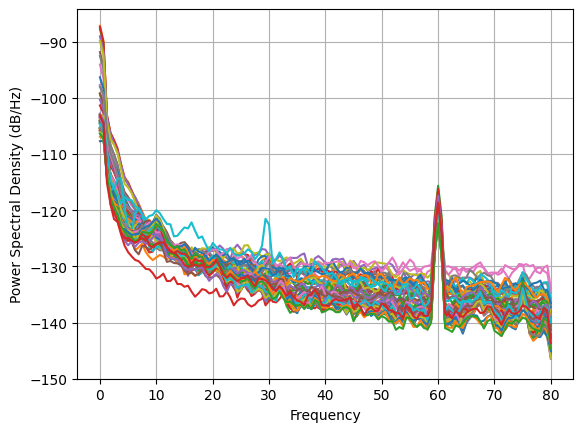

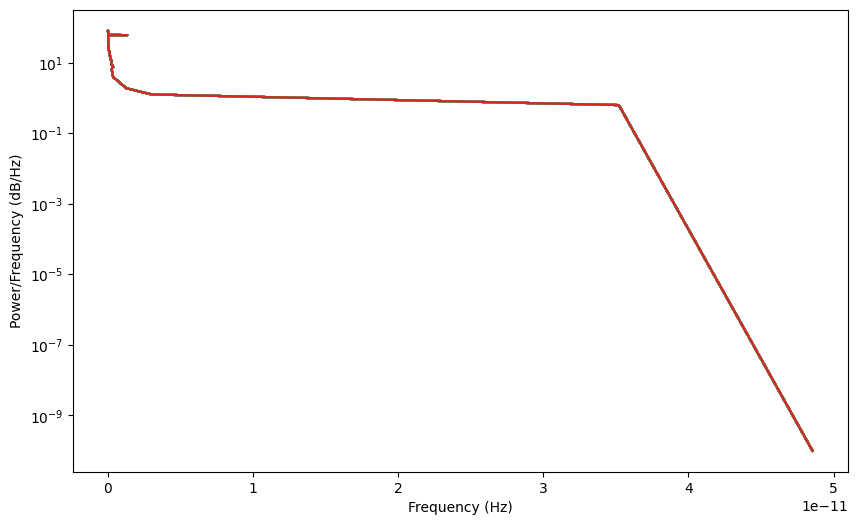

eyes closed


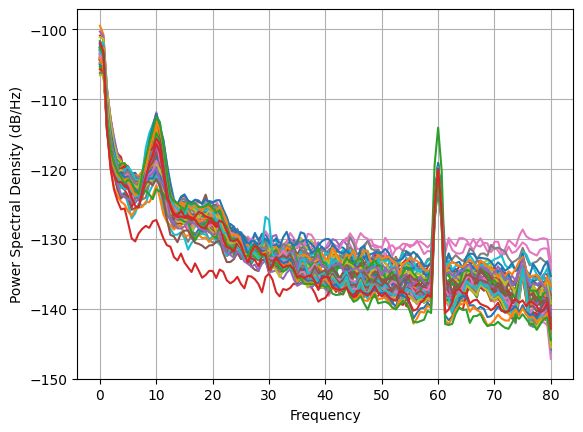

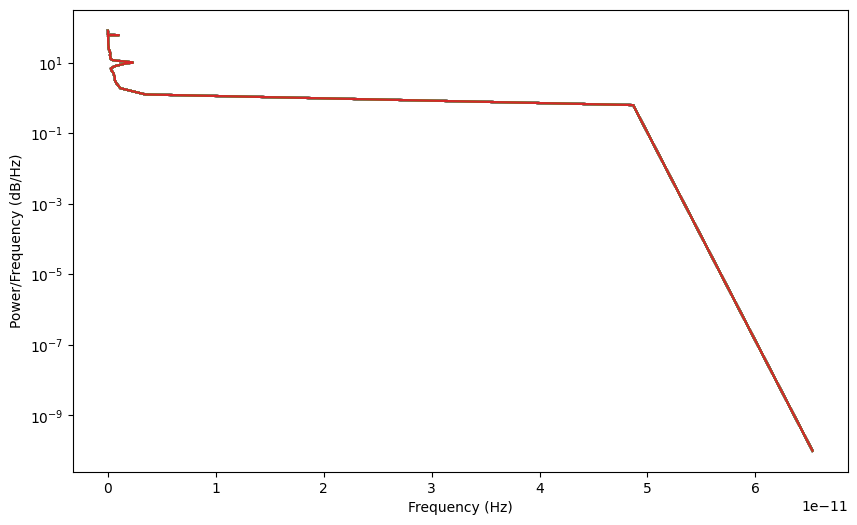

In [1]:
import mne
import numpy as np 
import matplotlib.pyplot as plt
import torch
import os
import sklearn
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import ShuffleSplit, cross_val_score, train_test_split
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from sklearn.preprocessing import MinMaxScaler
from torch.utils.data import TensorDataset, DataLoader
from Data import download_EEGBCI

main_folder = './EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0'
subdirectories = [f.path for f in os.scandir(main_folder) if f.is_dir()]

opened_files = []
closed_files = []

i = 0
for subdirectory in subdirectories:
    files = os.listdir(subdirectory)
    
    if len(files) > 0 and i not in [13, 50, 68, 96, 108]: # 13, 50, 68, 96, 108 idx does not have 9760 seq len
        for file in files:
            
            if file[-6:] == '01.edf':
                # This is data for eyes opened
                eyes_opened = os.path.join(subdirectory, file)
                print(eyes_opened)
                opened_files.append(eyes_opened)

            if file[-6:] == '02.edf':
                # This is data for eyes closed
                eyes_closed = os.path.join(subdirectory, file)
                print(eyes_closed)
                closed_files.append(eyes_closed)
    else:
        print(f"No files found in {subdirectory}")
    
    i += 1
    
large_open_data = []    # This is a list of all the data for eyes opened
large_closed_data = []  # This is a list of all the data for eyes closed

for data in opened_files:
    value_open = mne.io.read_raw_edf(data, preload=True, verbose=False).get_data(verbose=False)
    if(len(value_open) == 64):
        large_open_data.append(value_open)

for data in closed_files:
    value_closed = mne.io.read_raw_edf(data, preload=True, verbose=False).get_data(verbose=False)
    if(len(value_closed) == 64):
        large_closed_data.append(value_closed)

print(large_open_data.__len__())   # This is the number of files for eyes opened
print(large_closed_data.__len__()) # This is the number of files for eyes closed



open_data = []
closed_data = []

for i in range(len(large_open_data)):
    if i not in [1,4,6,13,22,29,31,33,36,43,50,53,60,63,86,87,88,94,95,100,102]: # data that looks sussy
        open_data.append(large_open_data[i])

for i in range(len(large_closed_data)):
    if i not in [1,4,5,6,12,13,15,17,19,22,29,31,33,34.47,50,51,58,60,71,76,77,79,81,86,87,88,90,95,100]: # data that looks sussy
        closed_data.append(large_closed_data[i])   
        
training_data_open = np.array(open_data)
training_data_closed = np.array(closed_data)
print(np.shape(training_data_open))
print(np.shape(training_data_closed))



# Load the raw EEG data
edf_file = './EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R01.edf'
raw = mne.io.read_raw_edf(edf_file, preload=True, verbose=False)


def compute_psd(data, fs, nperseg=256, noverlap=None):
    """
    Compute Power Spectral Density (PSD) using the Welch method.

    Parameters:
        data (array): EEG data array with shape (n_channels, n_samples).
        fs (float): Sampling frequency.
        nperseg (int): Length of each segment for PSD estimation.
        noverlap (int): Number of overlapping samples between segments.
    
    Returns:
        freqs (array): Frequency values.
        psd (array): Power Spectral Density values.
    """
    n_channels, n_samples = data.shape
    psd = np.zeros((n_channels, nperseg // 2 + 1))

    for ch_idx in range(n_channels):
        f, Pxx = plt.psd(data[ch_idx], Fs=fs, NFFT=nperseg, noverlap=noverlap)
        # Add a small epsilon to avoid zero values
        psd[ch_idx] = Pxx + 1e-10

    return f, psd


# Get the EEG data using .get_data()
eeg_data = raw.get_data()
#eeg_data = large_closed_data[0]

# Set the sampling frequency
fs = raw.info['sfreq']

def average_across_arrays(generated_data):
    return generated_data.mean(dim=0)



## open data
averaged_data = average_across_arrays(torch.tensor(training_data_open).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes open")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()



## closed data
averaged_data = average_across_arrays(torch.tensor(training_data_closed).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes closed")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()




NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty


def plot_everything(generated_data, gen_err, critic_err):
    generated_data = generated_data.detach()
    
    # plotting generated data
    values = generated_data[0, 0, :]
    plt.plot(values.tolist())
    plt.show()

    # plotting PSD
    averaged_data = average_across_arrays(generated_data)
    freqs, psd = compute_psd(averaged_data, fs)
    plt.figure(figsize=(10, 6))  # Add this line to create a single figure
    for ch_idx in range(eeg_data.shape[0]):
        plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.show()

    # plotting G vs D losses
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(gen_err,label="Generator")
    plt.plot(critic_err,label="Critic")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

eyes open


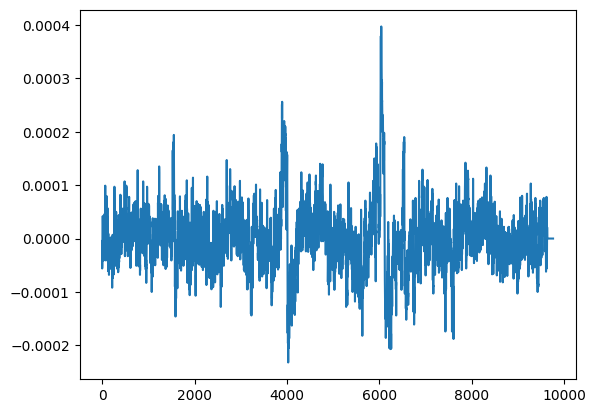

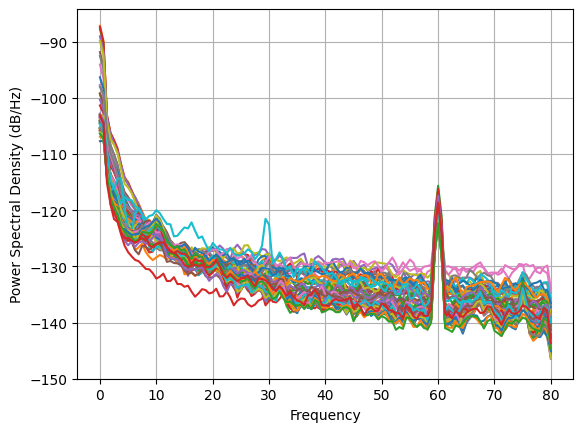

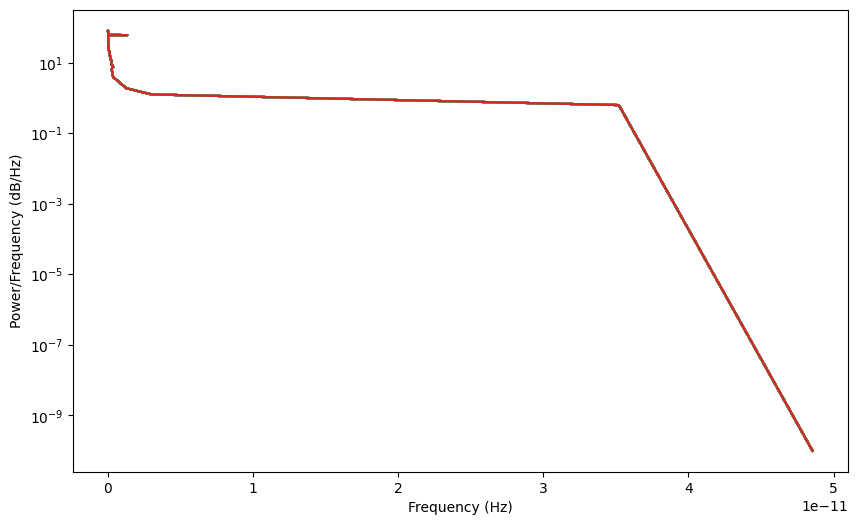

eyes open normalized


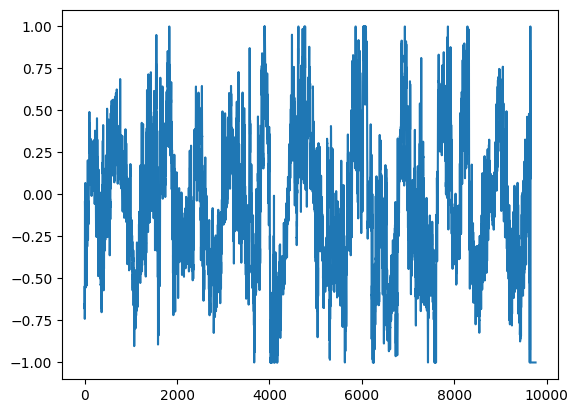

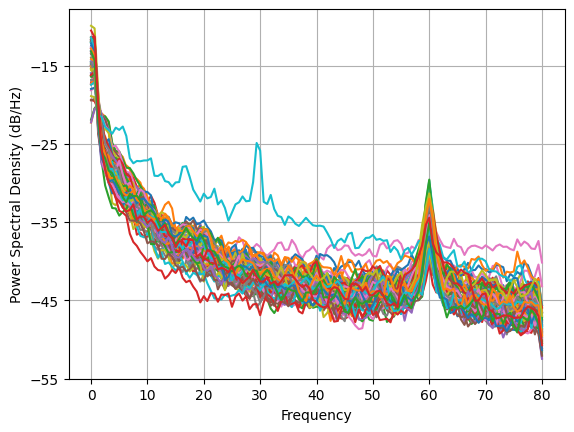

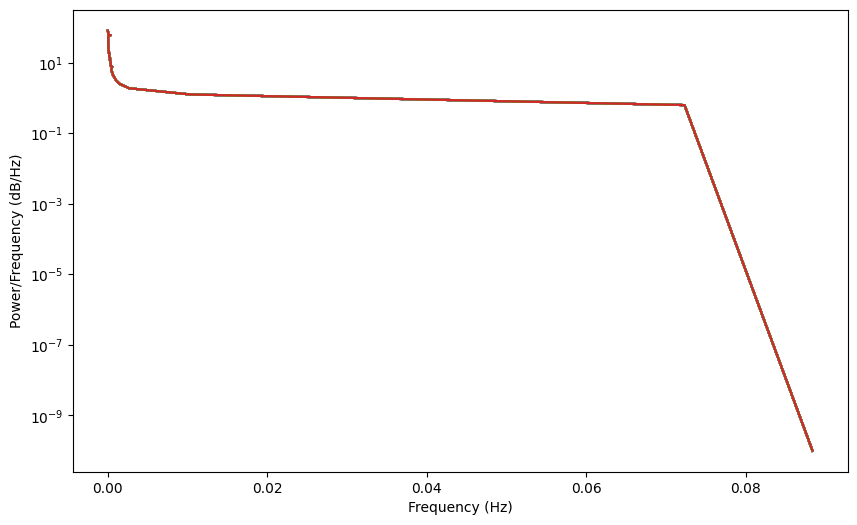

eyes closed


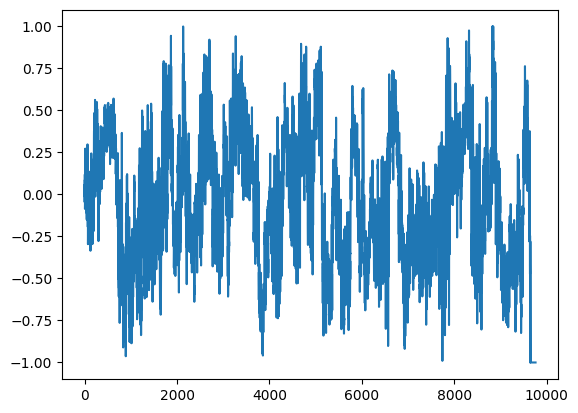

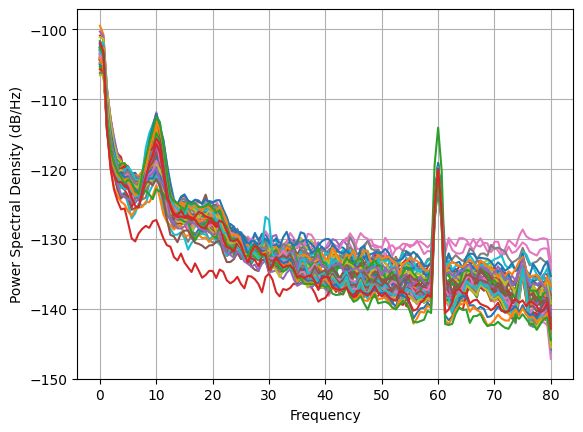

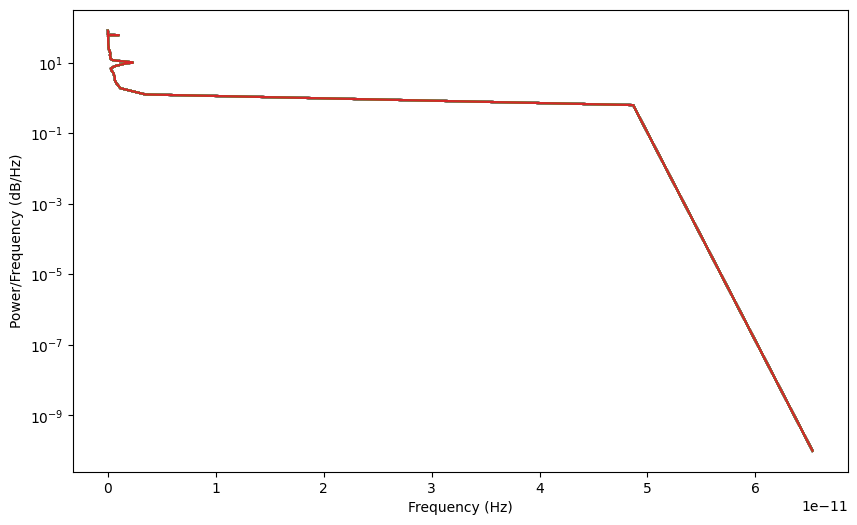

eyes closed normalized


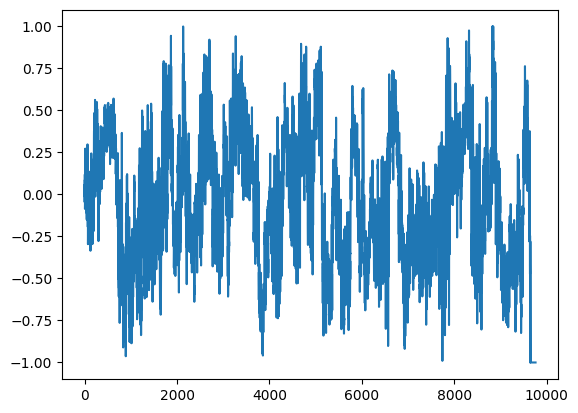

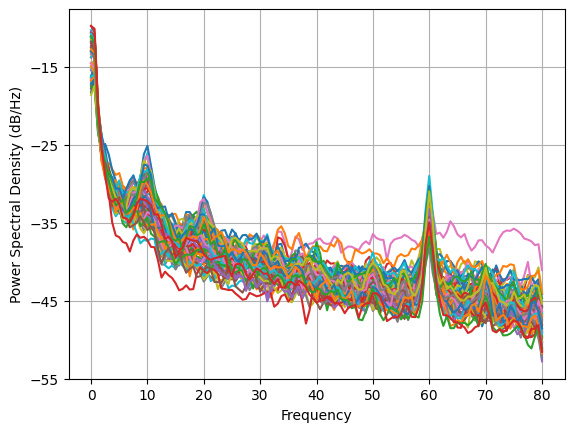

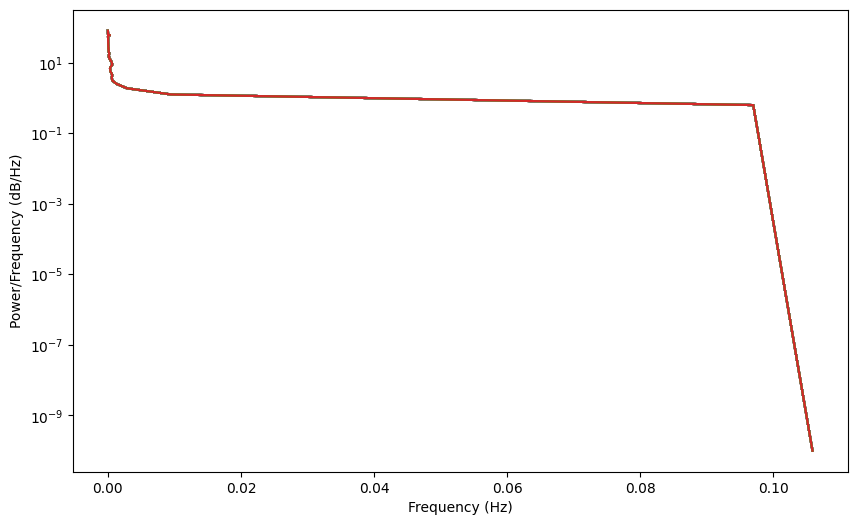

In [2]:
# Normalize the data (OPEN)
scaler = MinMaxScaler(feature_range=(-1, 1))
normalized_data_open = np.zeros_like(training_data_open)
for i in range(training_data_open.shape[1]):
    scaler = scaler.fit(training_data_open[:, i])
    normalized_data_open[:, i] = scaler.transform(training_data_open[:, i])

print("eyes open")
plt.plot(training_data_open[0][0])
plt.show()
averaged_data = average_across_arrays(torch.tensor(training_data_open).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()


print("eyes open normalized")
plt.plot(normalized_data_open[0][0])
plt.show()
averaged_data = average_across_arrays(torch.tensor(normalized_data_open).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()








# Normalize the data (CLOSED)
scaler = MinMaxScaler(feature_range=(-1, 1))
normalized_data_closed = np.zeros_like(training_data_closed)
for i in range(training_data_closed.shape[1]):
    scaler = scaler.fit(training_data_closed[:, i])
    normalized_data_closed[:, i] = scaler.transform(training_data_closed[:, i])
    
print("eyes closed")
plt.plot(normalized_data_closed[0][0])
plt.show()
averaged_data = average_across_arrays(torch.tensor(training_data_closed).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()


print("eyes closed normalized")
plt.plot(normalized_data_closed[0][0])
plt.show()
averaged_data = average_across_arrays(torch.tensor(normalized_data_closed).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()

# Baseline

Epoch 0: Critic error ([1.1292541921623496]) Generator err ([-0.006577083375304937])


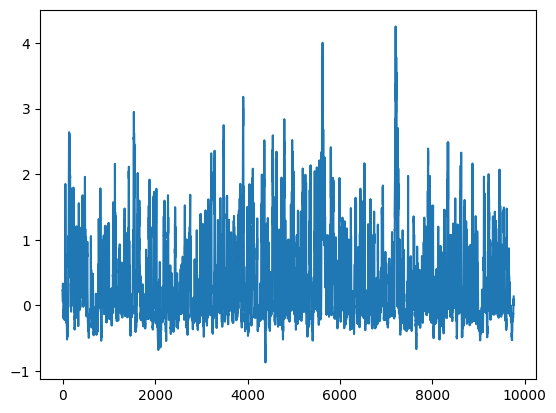

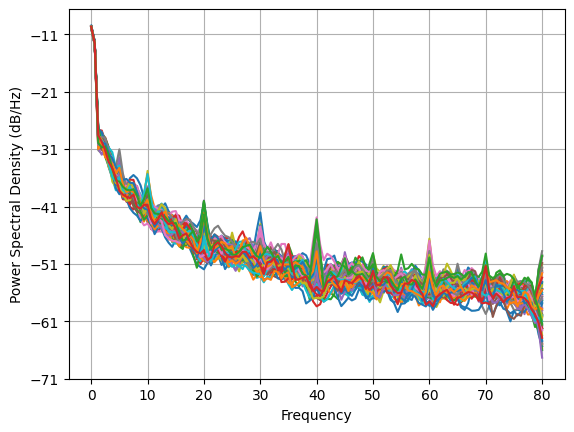

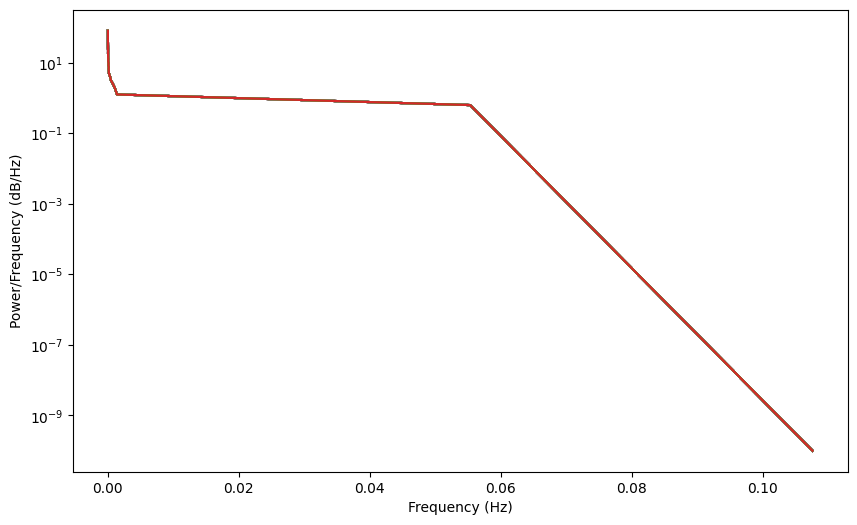

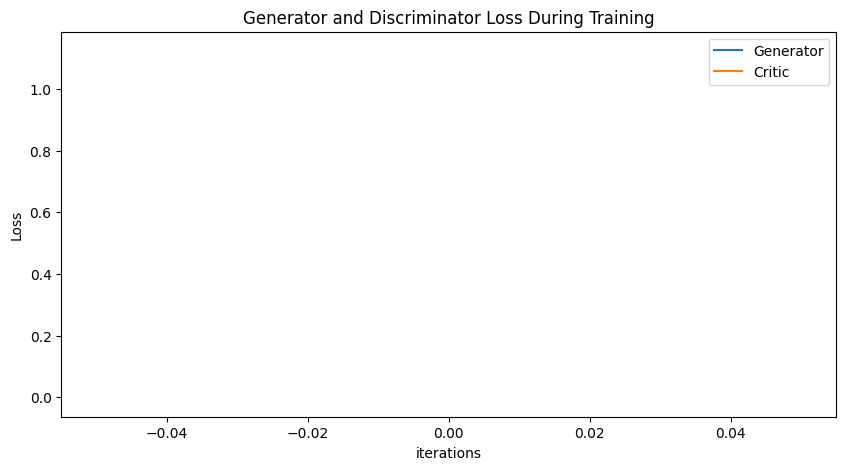

Epoch 50: Critic error ([1.1292541921623496, 0.3969079044069738, -0.025260953897763144, 0.05565797538610648, 0.016600597255936128, 0.009096618252810773, 0.060765012276692176, 0.08265840155331333, 0.028872358910519605, 0.1230950870595936, 0.09541985259572322, 0.1290342052576332, 0.06865882601137471, 0.10757859836541944, 0.06233361526379416, 0.02096779838754785, -0.031166907418695364, -0.060736225887243506, -0.11216014400414638, -0.15793896281530231, -0.17349184255839004, -0.25128706566227776, -0.3000545460150878, -0.37405989795556727, -0.4689137711398583, -0.5909593594291157, -0.7168224812534942, -0.9413343842150841, -1.0645437488304448, -1.1936490779181974, -1.3605891857075625, -1.4954679711467747, -1.4740653147419909, -1.6759824972271824, -1.7493392392469707, -1.7922688061403487, -1.9800671644135077, -1.8930815677259245, -1.987062541655437, -2.2548837158171953, -2.288179254758166, -2.436551463163147, -2.4655988277366157, -2.566845185005389, -2.7253463029882368, -2.8987154428600794, -2

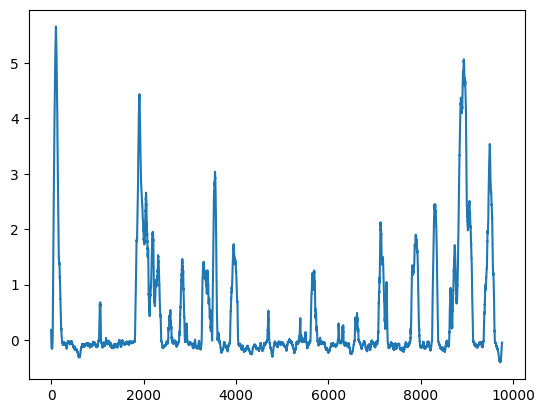

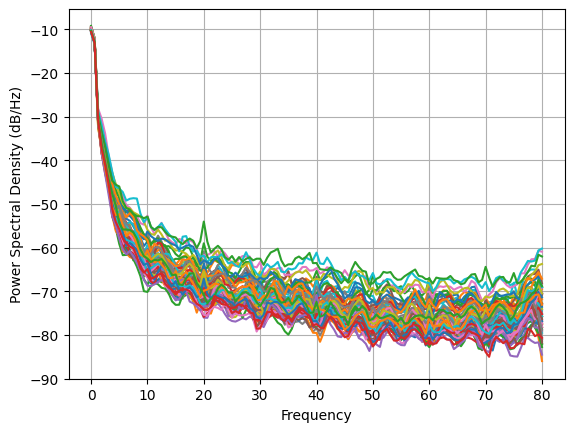

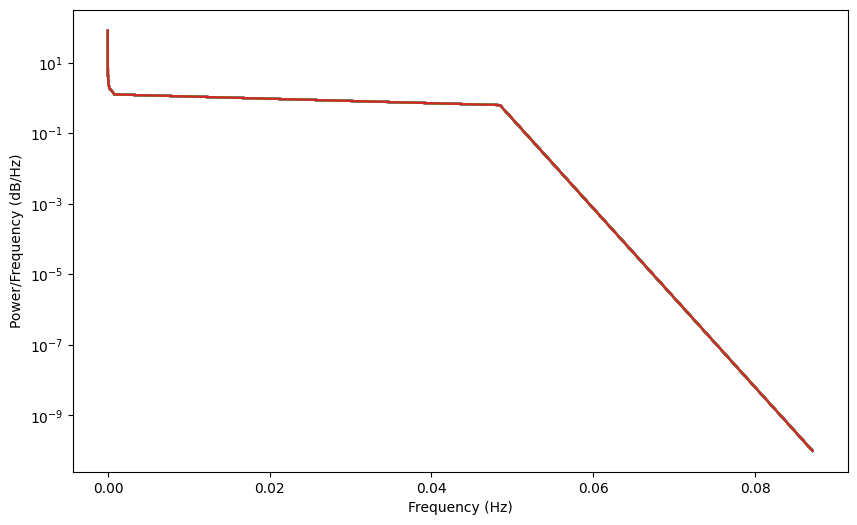

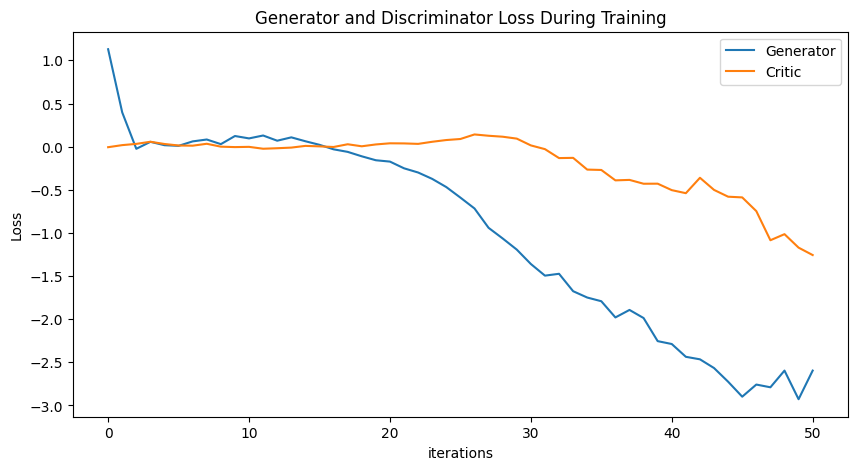

Epoch 100: Critic error ([1.1292541921623496, 0.3969079044069738, -0.025260953897763144, 0.05565797538610648, 0.016600597255936128, 0.009096618252810773, 0.060765012276692176, 0.08265840155331333, 0.028872358910519605, 0.1230950870595936, 0.09541985259572322, 0.1290342052576332, 0.06865882601137471, 0.10757859836541944, 0.06233361526379416, 0.02096779838754785, -0.031166907418695364, -0.060736225887243506, -0.11216014400414638, -0.15793896281530231, -0.17349184255839004, -0.25128706566227776, -0.3000545460150878, -0.37405989795556727, -0.4689137711398583, -0.5909593594291157, -0.7168224812534942, -0.9413343842150841, -1.0645437488304448, -1.1936490779181974, -1.3605891857075625, -1.4954679711467747, -1.4740653147419909, -1.6759824972271824, -1.7493392392469707, -1.7922688061403487, -1.9800671644135077, -1.8930815677259245, -1.987062541655437, -2.2548837158171953, -2.288179254758166, -2.436551463163147, -2.4655988277366157, -2.566845185005389, -2.7253463029882368, -2.8987154428600794, -

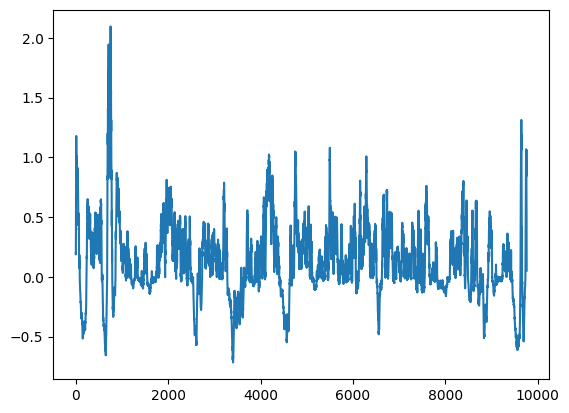

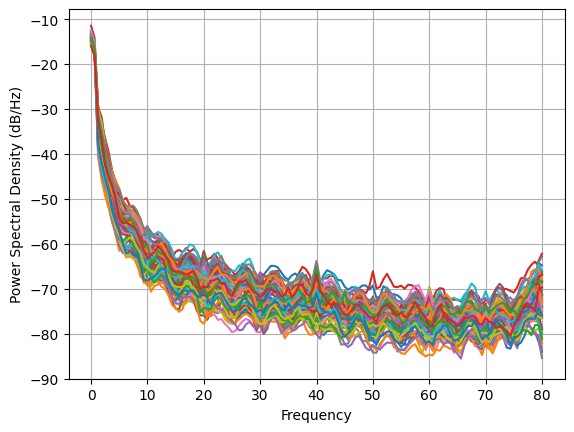

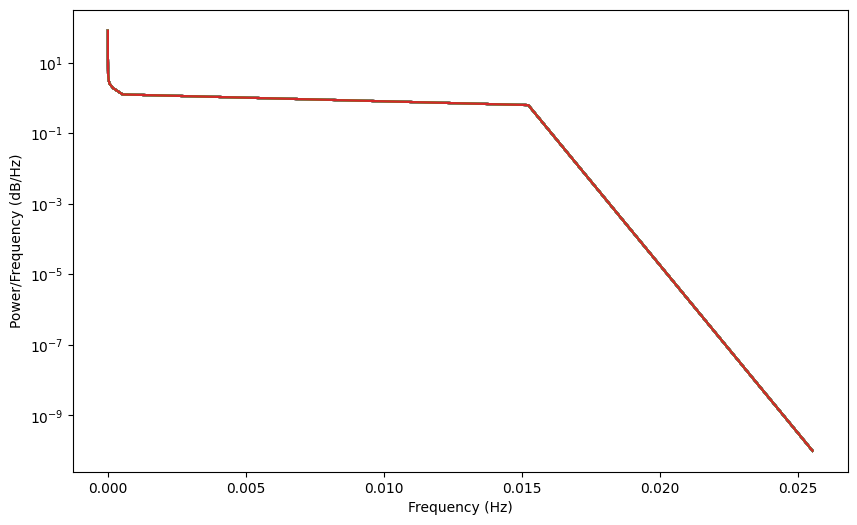

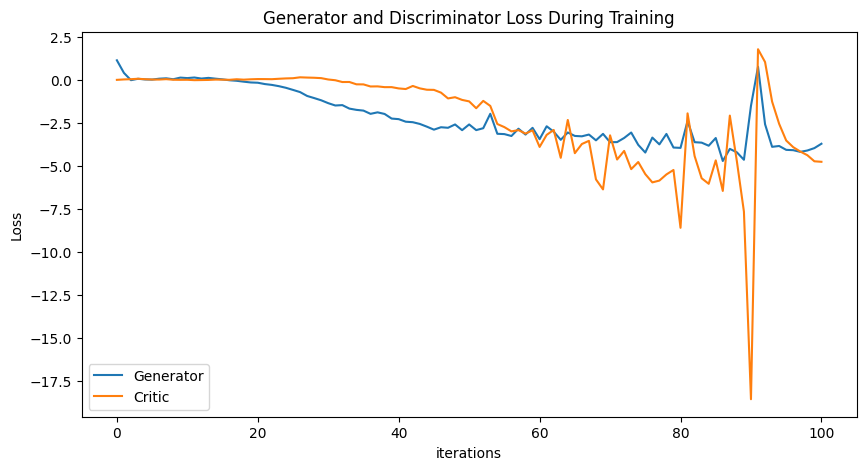

KeyboardInterrupt: 

In [10]:
NUM_EPOCHS = 300
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(normalized_data_closed)[0]

train_data = TensorDataset(torch.tensor(normalized_data_closed).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for (real,) in train_loader:
            for _ in range(5):
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)

                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_closed_1, disc, gen = train()

torch.save(gen, 'gen4_1.pt')
torch.save(disc, 'disc4_1.pt')

plot_everything(generated_closed_1, gen_err, critic_err)

# Baseline + batch norm (affine = true)

Epoch 0: Critic error ([0.01401503992304115]) Generator err ([-0.18367020785808563])


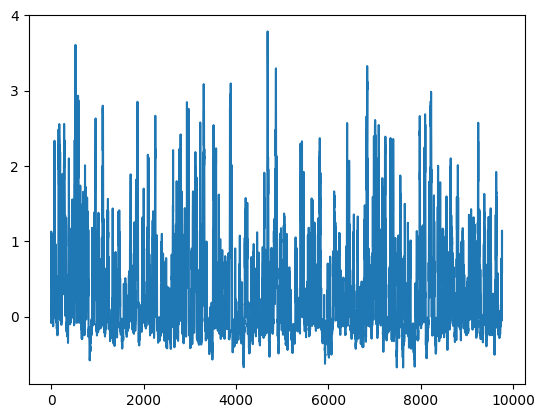

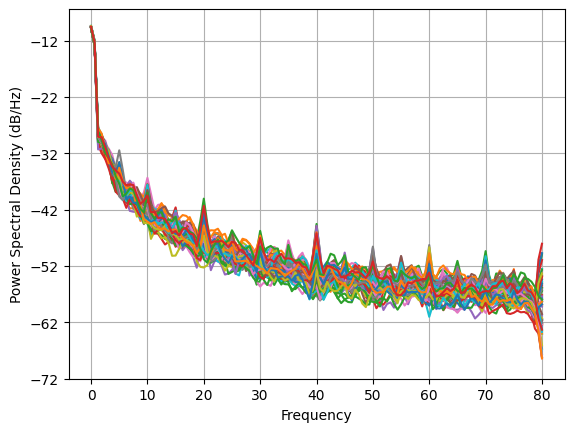

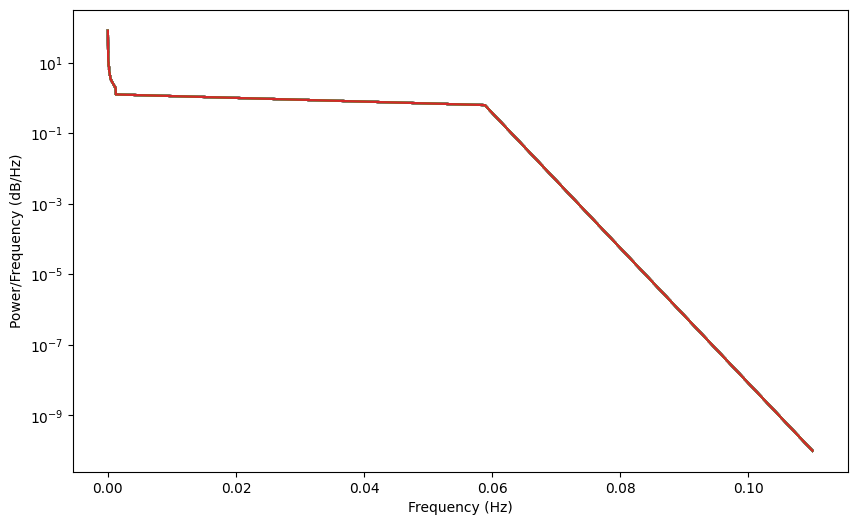

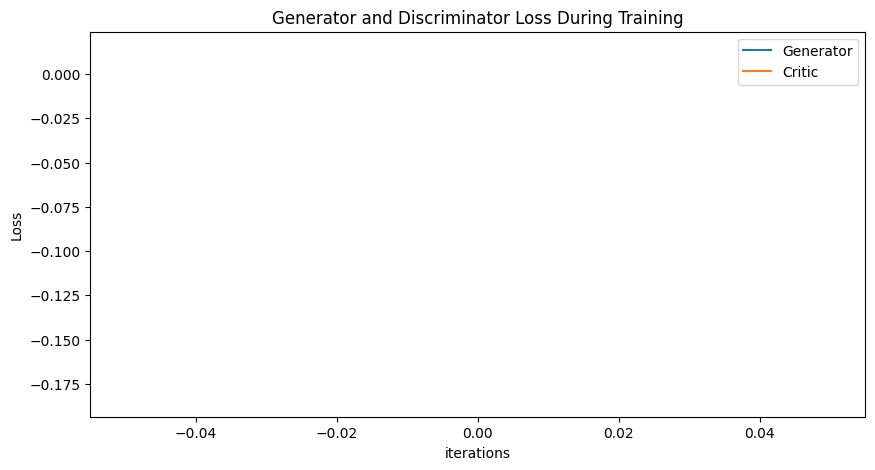

Epoch 50: Critic error ([0.01401503992304115, -0.12550882237296812, -0.23666965957107708, -0.391902591802978, -0.5483801822001985, -0.5993894625730188, -0.8812994674014779, -0.9341127340881787, -1.0906294322635213, -1.413627233410046, -1.3304693194922035, -1.8051963873019548, -1.8580767531987965, -2.2473712895721625, -2.5105384937829003, -2.665178821475426, -2.7208457456399033, -3.3048858683093396, -3.216570335577883, -3.545200519380346, -1.151401211575235, -3.2033565286053354, -3.278576344058825, -3.8509653078482007, -4.035676774083293, -4.232930119225211, -3.7833223386859887, -4.8906510339638025, -5.0086357273028055, -5.57061503430447, -3.4836078634755836, -5.900009558572935, -5.506007080282467, -5.527054525710507, -6.381614744363491, -4.59364219537157, -6.650247147661645, -6.922280309119628, -7.054457040431272, -7.121940908208732, -7.599517752652377, 0.5988329416687574, -0.31377200120764553, -0.6596768276496092, -1.1704041043024218, -1.7634686215561808, -3.120747480528475, -5.890744

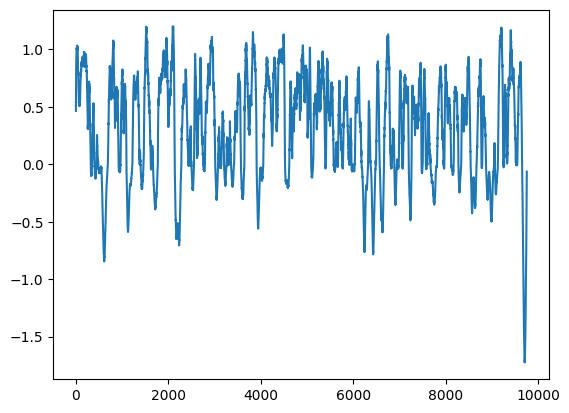

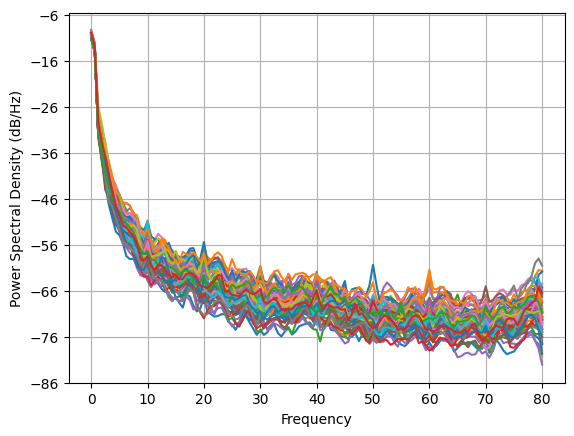

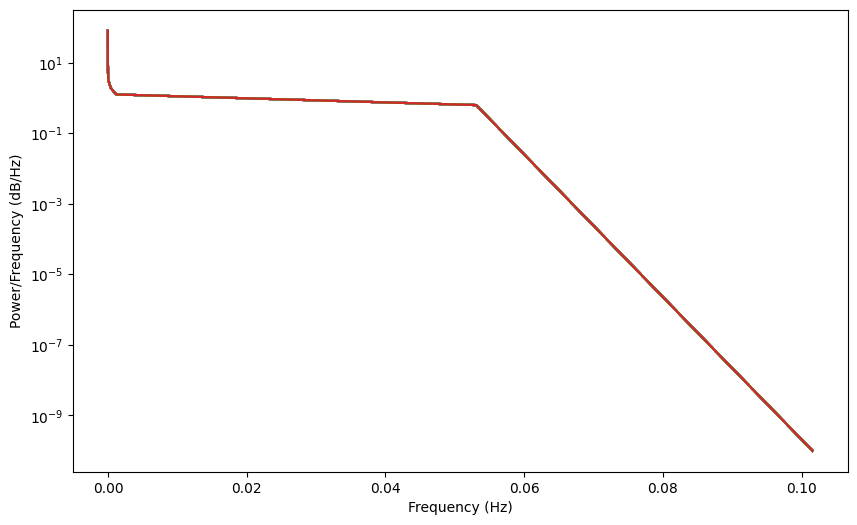

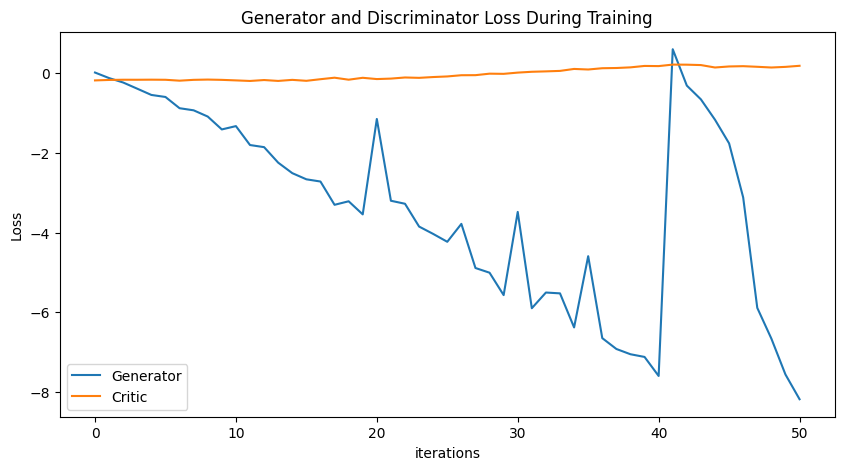

Epoch 100: Critic error ([0.01401503992304115, -0.12550882237296812, -0.23666965957107708, -0.391902591802978, -0.5483801822001985, -0.5993894625730188, -0.8812994674014779, -0.9341127340881787, -1.0906294322635213, -1.413627233410046, -1.3304693194922035, -1.8051963873019548, -1.8580767531987965, -2.2473712895721625, -2.5105384937829003, -2.665178821475426, -2.7208457456399033, -3.3048858683093396, -3.216570335577883, -3.545200519380346, -1.151401211575235, -3.2033565286053354, -3.278576344058825, -3.8509653078482007, -4.035676774083293, -4.232930119225211, -3.7833223386859887, -4.8906510339638025, -5.0086357273028055, -5.57061503430447, -3.4836078634755836, -5.900009558572935, -5.506007080282467, -5.527054525710507, -6.381614744363491, -4.59364219537157, -6.650247147661645, -6.922280309119628, -7.054457040431272, -7.121940908208732, -7.599517752652377, 0.5988329416687574, -0.31377200120764553, -0.6596768276496092, -1.1704041043024218, -1.7634686215561808, -3.120747480528475, -5.89074

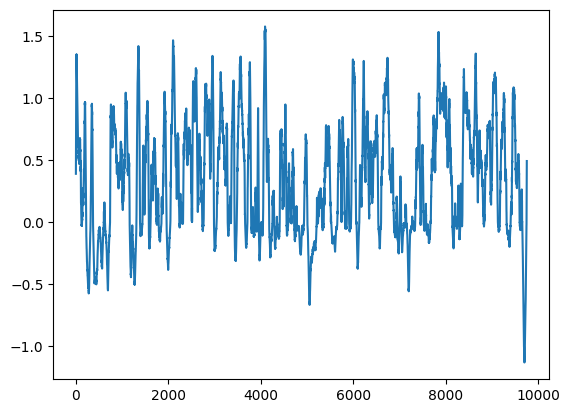

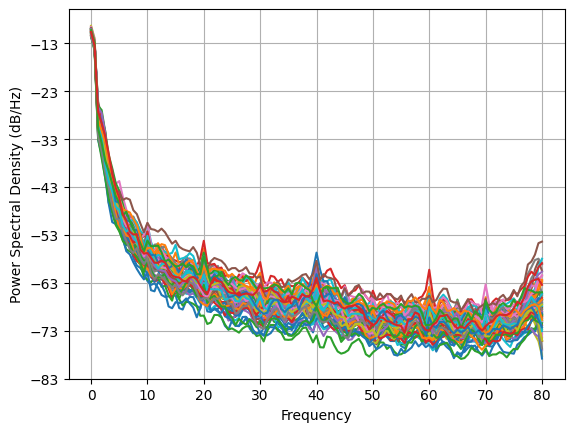

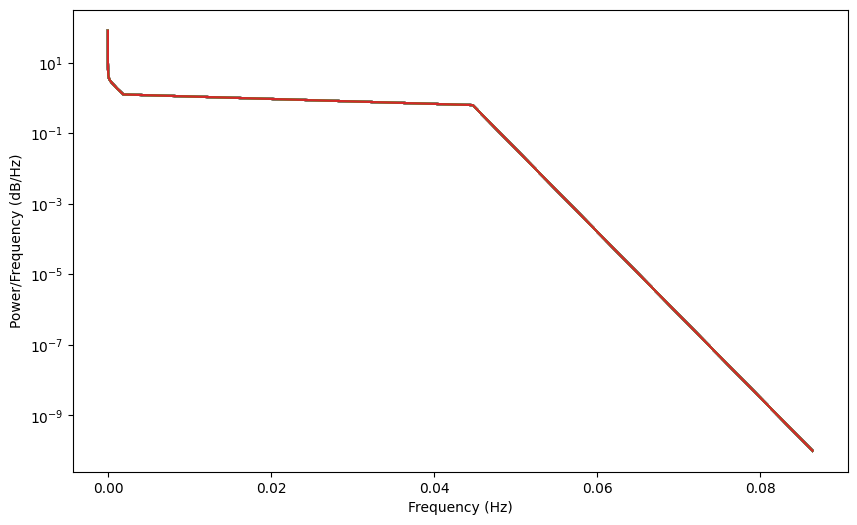

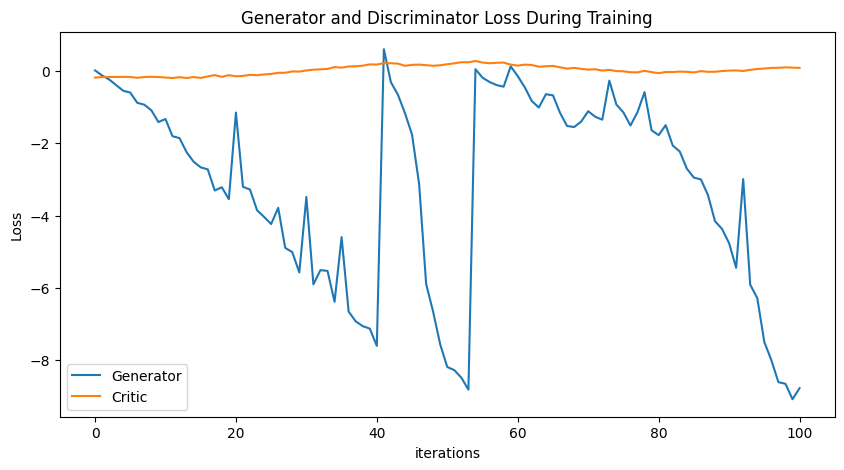

Epoch 150: Critic error ([0.01401503992304115, -0.12550882237296812, -0.23666965957107708, -0.391902591802978, -0.5483801822001985, -0.5993894625730188, -0.8812994674014779, -0.9341127340881787, -1.0906294322635213, -1.413627233410046, -1.3304693194922035, -1.8051963873019548, -1.8580767531987965, -2.2473712895721625, -2.5105384937829003, -2.665178821475426, -2.7208457456399033, -3.3048858683093396, -3.216570335577883, -3.545200519380346, -1.151401211575235, -3.2033565286053354, -3.278576344058825, -3.8509653078482007, -4.035676774083293, -4.232930119225211, -3.7833223386859887, -4.8906510339638025, -5.0086357273028055, -5.57061503430447, -3.4836078634755836, -5.900009558572935, -5.506007080282467, -5.527054525710507, -6.381614744363491, -4.59364219537157, -6.650247147661645, -6.922280309119628, -7.054457040431272, -7.121940908208732, -7.599517752652377, 0.5988329416687574, -0.31377200120764553, -0.6596768276496092, -1.1704041043024218, -1.7634686215561808, -3.120747480528475, -5.89074

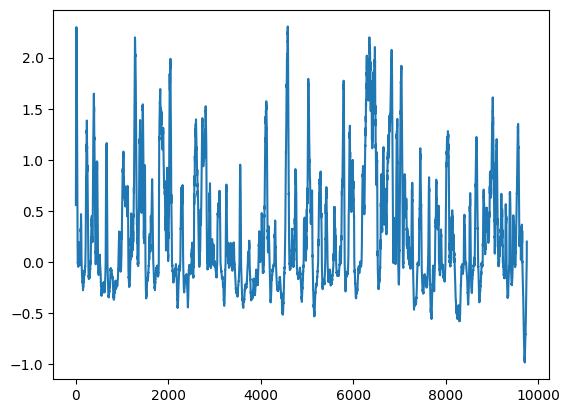

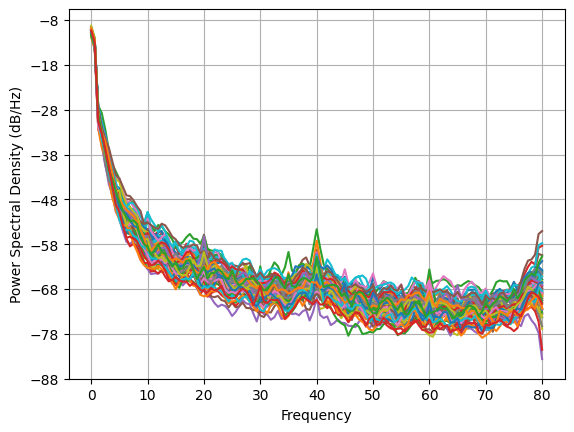

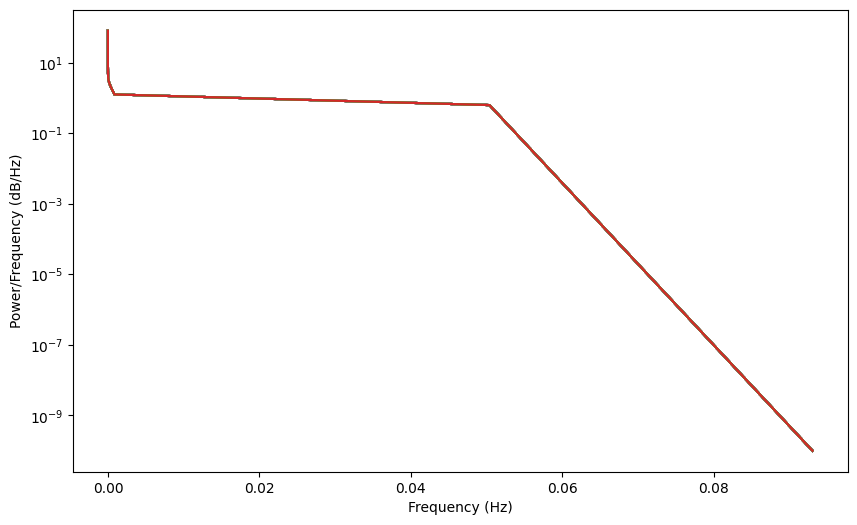

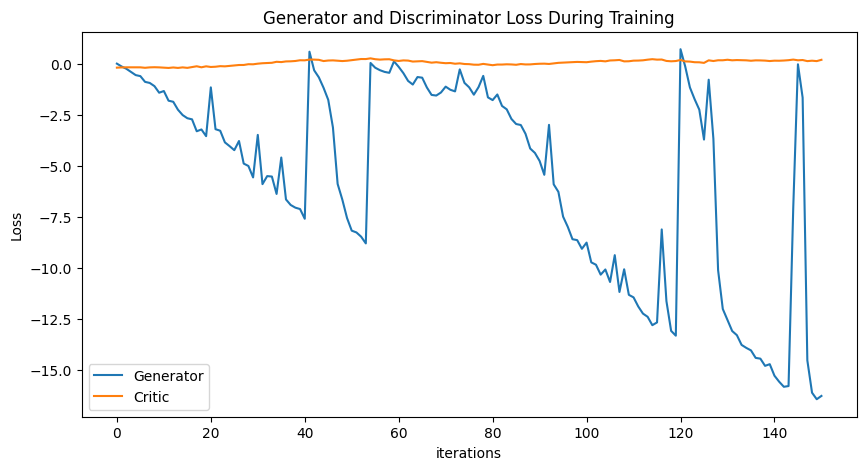

Epoch 200: Critic error ([0.01401503992304115, -0.12550882237296812, -0.23666965957107708, -0.391902591802978, -0.5483801822001985, -0.5993894625730188, -0.8812994674014779, -0.9341127340881787, -1.0906294322635213, -1.413627233410046, -1.3304693194922035, -1.8051963873019548, -1.8580767531987965, -2.2473712895721625, -2.5105384937829003, -2.665178821475426, -2.7208457456399033, -3.3048858683093396, -3.216570335577883, -3.545200519380346, -1.151401211575235, -3.2033565286053354, -3.278576344058825, -3.8509653078482007, -4.035676774083293, -4.232930119225211, -3.7833223386859887, -4.8906510339638025, -5.0086357273028055, -5.57061503430447, -3.4836078634755836, -5.900009558572935, -5.506007080282467, -5.527054525710507, -6.381614744363491, -4.59364219537157, -6.650247147661645, -6.922280309119628, -7.054457040431272, -7.121940908208732, -7.599517752652377, 0.5988329416687574, -0.31377200120764553, -0.6596768276496092, -1.1704041043024218, -1.7634686215561808, -3.120747480528475, -5.89074

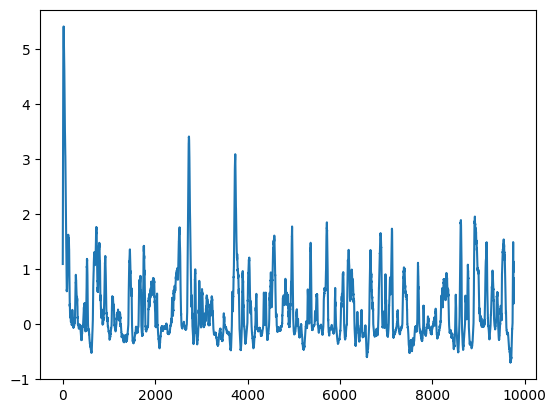

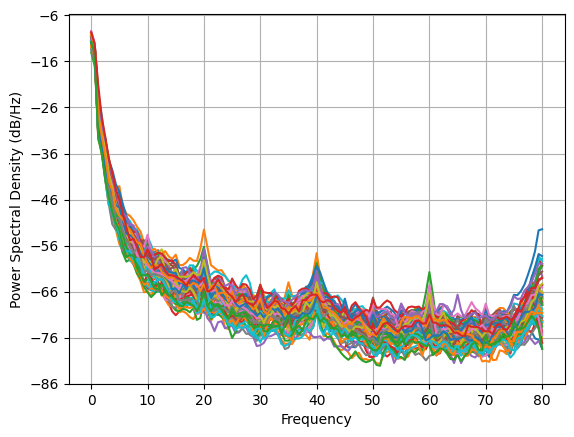

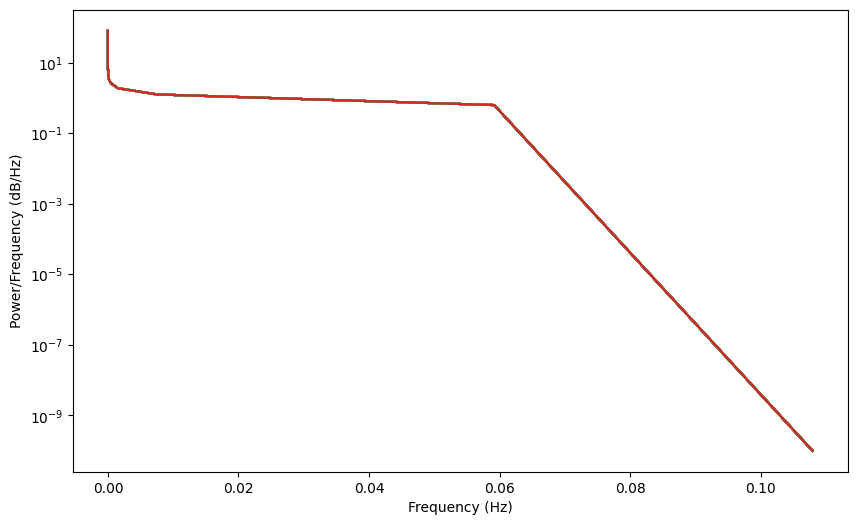

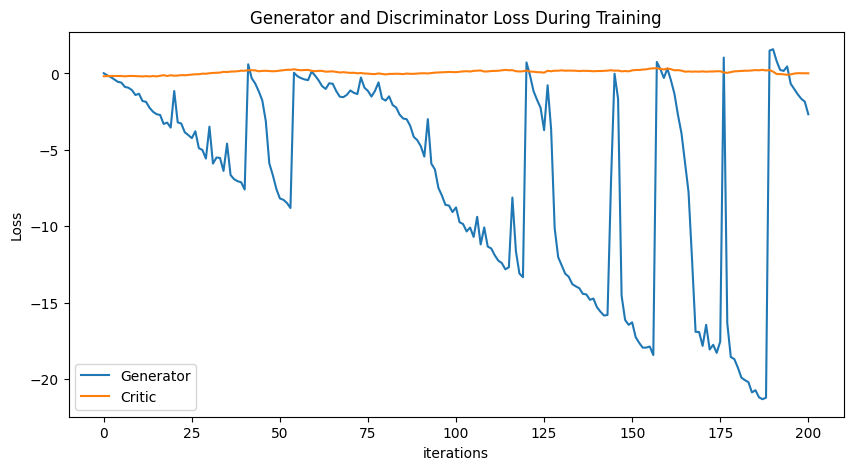

Epoch 250: Critic error ([0.01401503992304115, -0.12550882237296812, -0.23666965957107708, -0.391902591802978, -0.5483801822001985, -0.5993894625730188, -0.8812994674014779, -0.9341127340881787, -1.0906294322635213, -1.413627233410046, -1.3304693194922035, -1.8051963873019548, -1.8580767531987965, -2.2473712895721625, -2.5105384937829003, -2.665178821475426, -2.7208457456399033, -3.3048858683093396, -3.216570335577883, -3.545200519380346, -1.151401211575235, -3.2033565286053354, -3.278576344058825, -3.8509653078482007, -4.035676774083293, -4.232930119225211, -3.7833223386859887, -4.8906510339638025, -5.0086357273028055, -5.57061503430447, -3.4836078634755836, -5.900009558572935, -5.506007080282467, -5.527054525710507, -6.381614744363491, -4.59364219537157, -6.650247147661645, -6.922280309119628, -7.054457040431272, -7.121940908208732, -7.599517752652377, 0.5988329416687574, -0.31377200120764553, -0.6596768276496092, -1.1704041043024218, -1.7634686215561808, -3.120747480528475, -5.89074

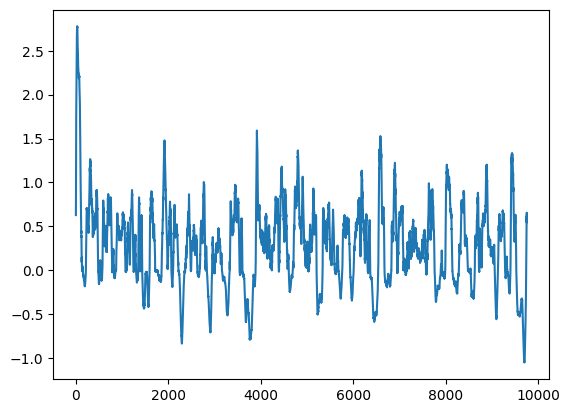

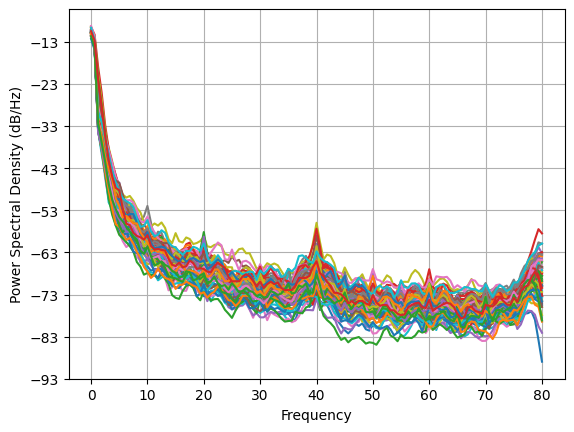

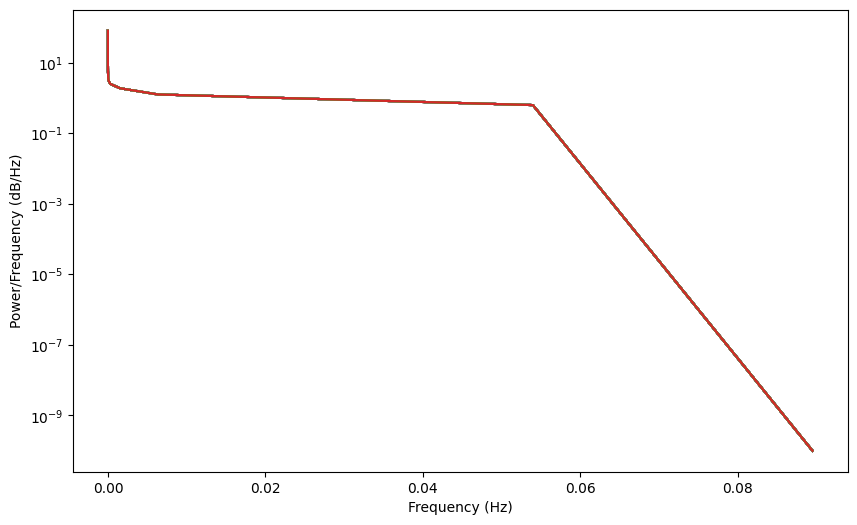

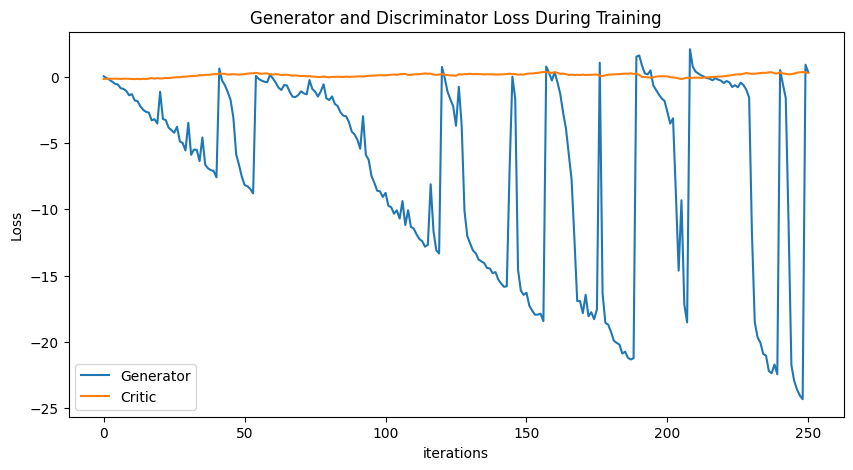

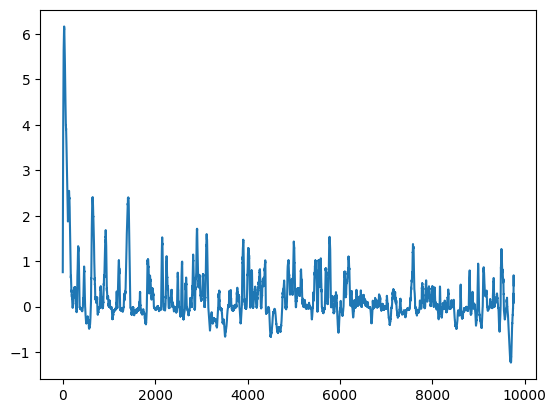

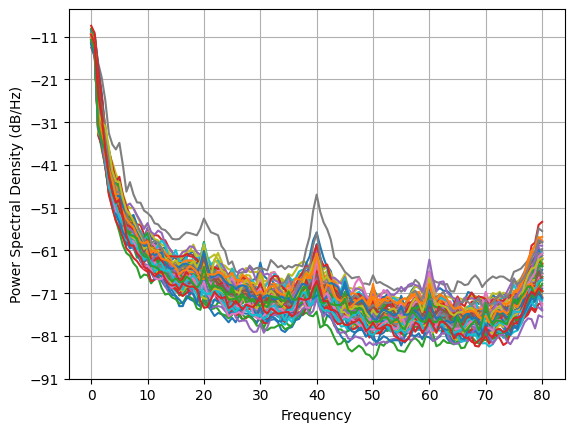

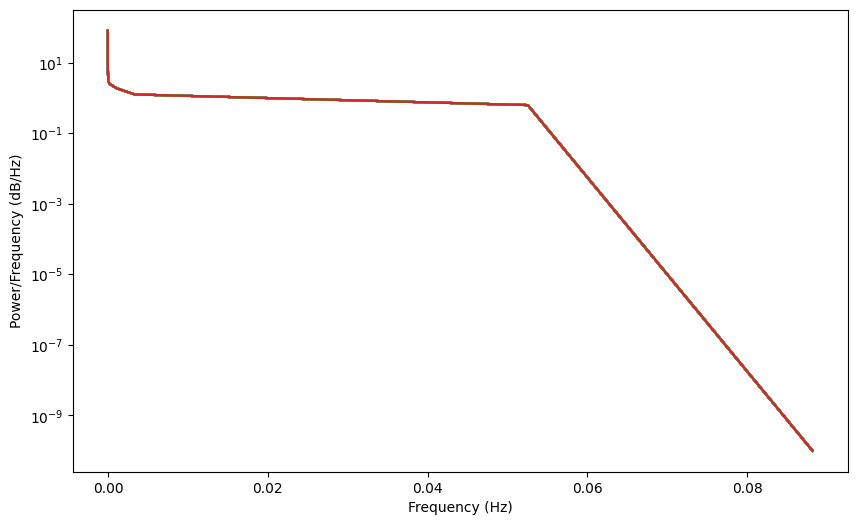

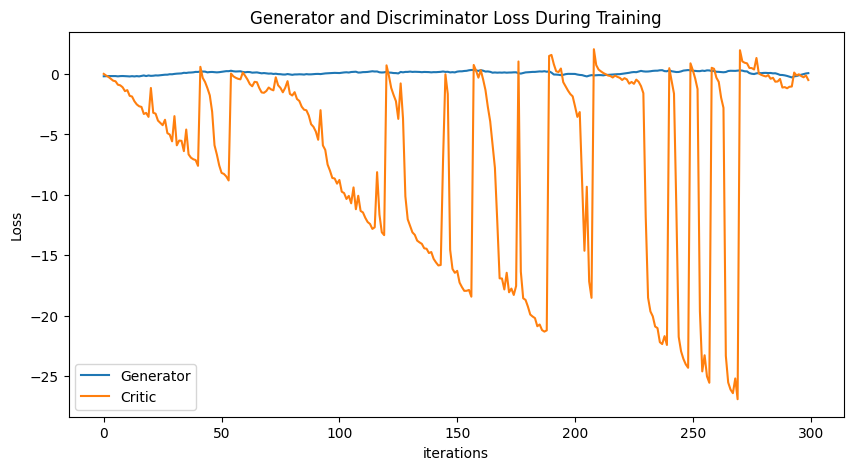

In [8]:
NUM_EPOCHS = 300
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(normalized_data_open)[0]

train_data = TensorDataset(torch.tensor(normalized_data_open).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for (real,) in train_loader:
            for _ in range(5):
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)
                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_closed_2, disc, gen = train()

torch.save(gen, 'gen4_2.pt')
torch.save(disc, 'disc4_2.pt')

plot_everything(generated_closed_2, gen_err, critic_err)

# Baseline (affine = false)

Epoch 0: Critic error ([1.493491743951764]) Generator err ([-0.023212675005197525])


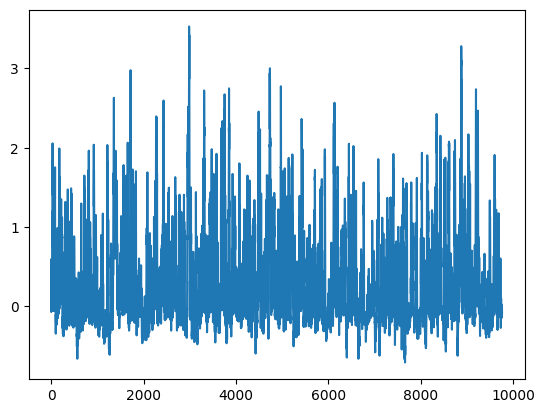

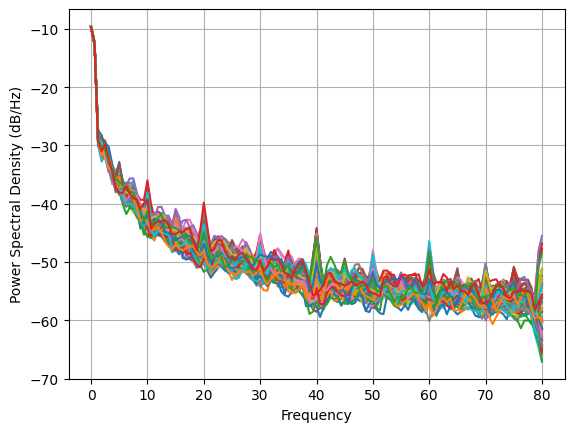

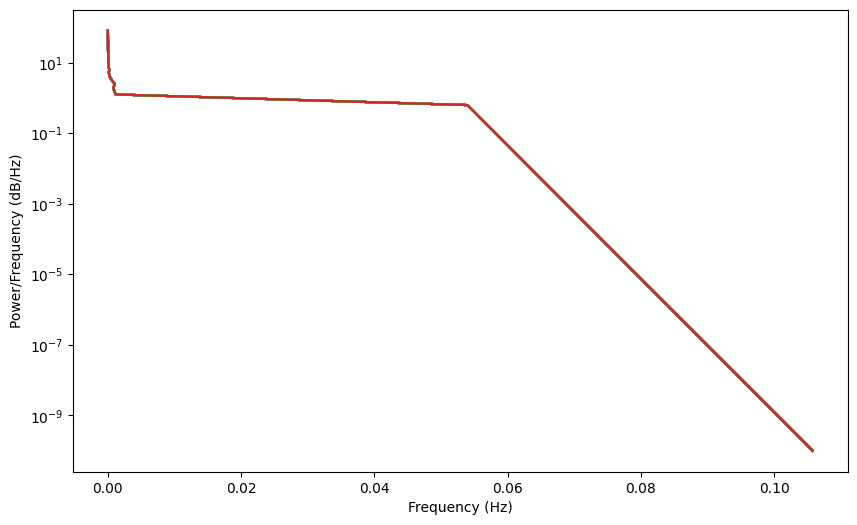

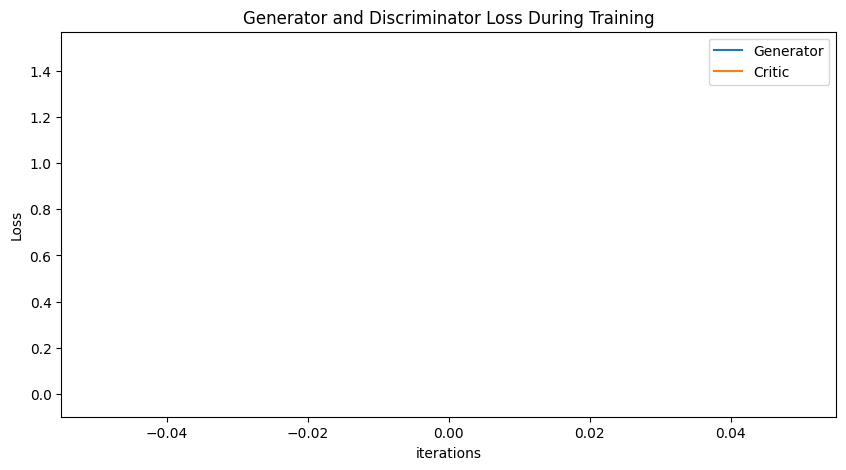

Epoch 50: Critic error ([1.493491743951764, 1.0297300407104908, 0.31821170060690085, 0.047066093688365215, -0.028496448325527644, -0.0225187089307283, -0.015629416025582085, -0.01378938394098108, -0.009773975038712999, -0.0013081979541858975, -0.018717071213017262, -0.015487240317292025, 0.00644922517597632, -0.015224321160736937, -0.016519796698680828, -0.018265491993586007, -0.021269802336070995, -0.019197189185209573, -0.027139798976587304, -0.03541478204906638, -0.030613700138515117, -0.024402489876166597, -0.03301970403756731, -0.046650026428749755, -0.041355115246500936, -0.039219336093696405, -0.040651947852512756, -0.05869791214667712, -0.05730334662062509, -0.08610837854742748, -0.07363779945824149, -0.0934385278939954, -0.10984255304980137, -0.13078385194499245, -0.17338520172026411, -0.21537982122613467, -0.3035513449449166, -0.3760162666957871, -0.6713722841394524, -0.984223104256886, -1.469641029621817, -1.884953483349705, -1.8660245544478733, -2.5502997897868536, -2.25264

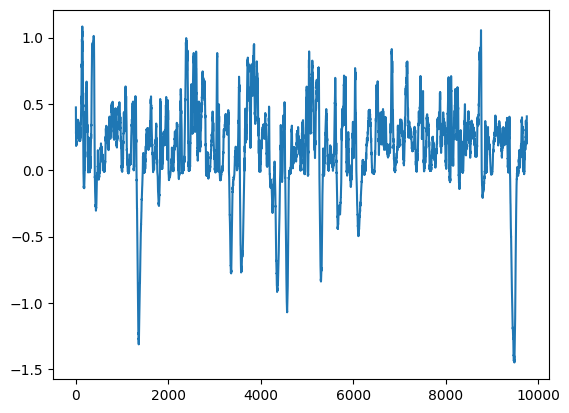

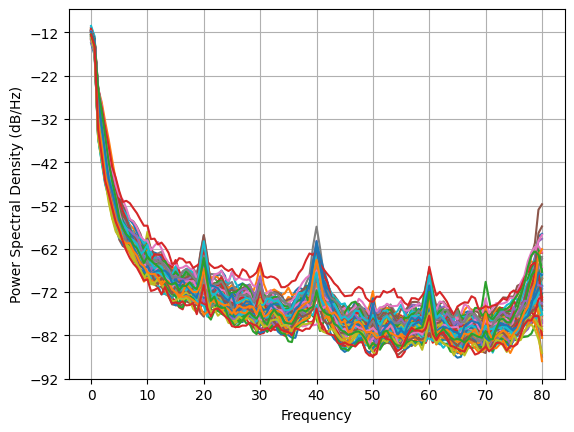

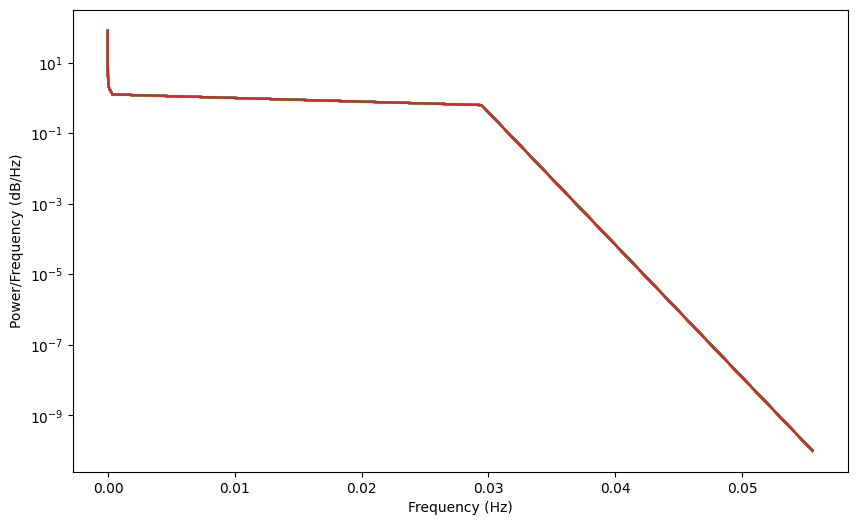

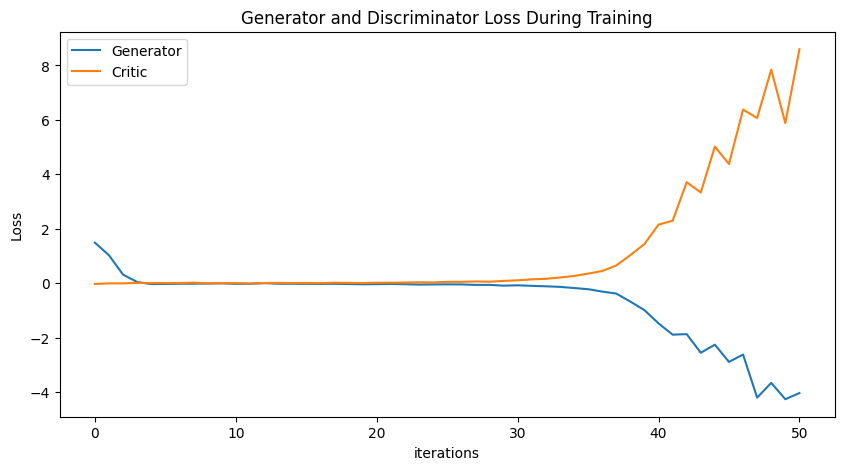

Epoch 100: Critic error ([1.493491743951764, 1.0297300407104908, 0.31821170060690085, 0.047066093688365215, -0.028496448325527644, -0.0225187089307283, -0.015629416025582085, -0.01378938394098108, -0.009773975038712999, -0.0013081979541858975, -0.018717071213017262, -0.015487240317292025, 0.00644922517597632, -0.015224321160736937, -0.016519796698680828, -0.018265491993586007, -0.021269802336070995, -0.019197189185209573, -0.027139798976587304, -0.03541478204906638, -0.030613700138515117, -0.024402489876166597, -0.03301970403756731, -0.046650026428749755, -0.041355115246500936, -0.039219336093696405, -0.040651947852512756, -0.05869791214667712, -0.05730334662062509, -0.08610837854742748, -0.07363779945824149, -0.0934385278939954, -0.10984255304980137, -0.13078385194499245, -0.17338520172026411, -0.21537982122613467, -0.3035513449449166, -0.3760162666957871, -0.6713722841394524, -0.984223104256886, -1.469641029621817, -1.884953483349705, -1.8660245544478733, -2.5502997897868536, -2.2526

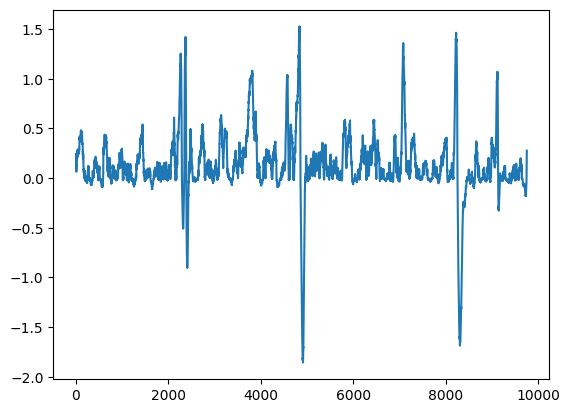

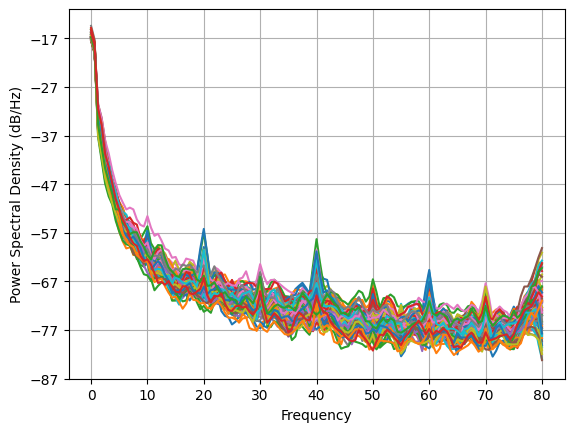

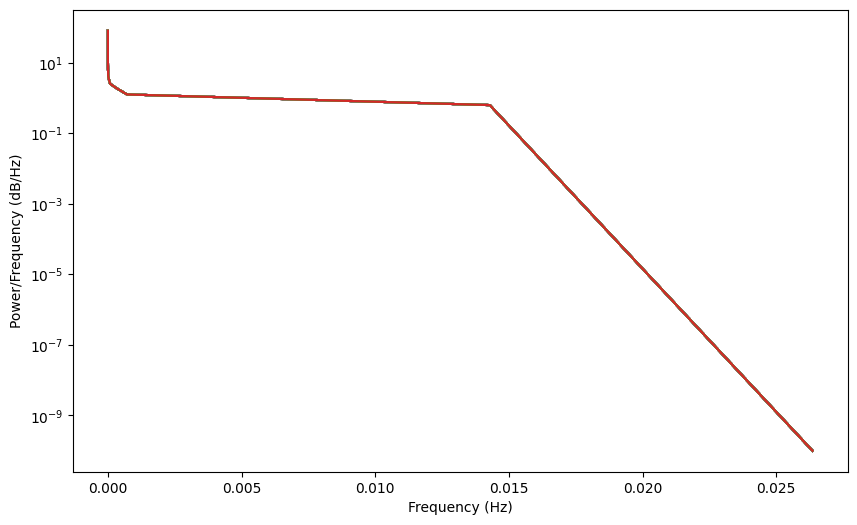

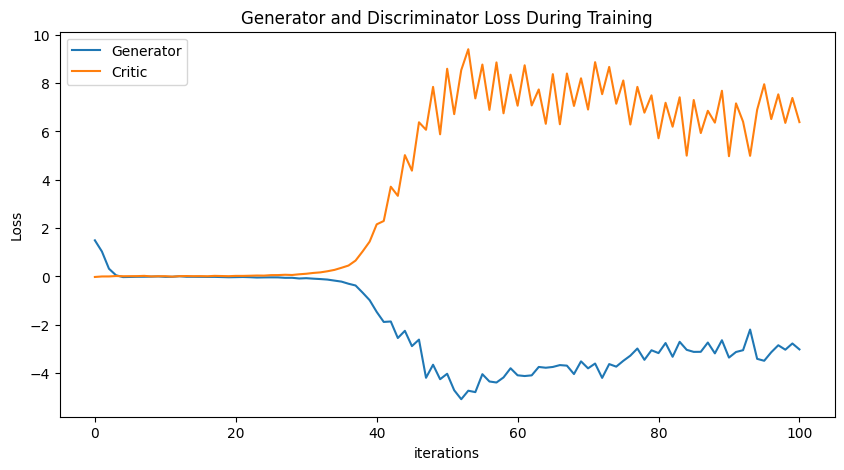

Epoch 150: Critic error ([1.493491743951764, 1.0297300407104908, 0.31821170060690085, 0.047066093688365215, -0.028496448325527644, -0.0225187089307283, -0.015629416025582085, -0.01378938394098108, -0.009773975038712999, -0.0013081979541858975, -0.018717071213017262, -0.015487240317292025, 0.00644922517597632, -0.015224321160736937, -0.016519796698680828, -0.018265491993586007, -0.021269802336070995, -0.019197189185209573, -0.027139798976587304, -0.03541478204906638, -0.030613700138515117, -0.024402489876166597, -0.03301970403756731, -0.046650026428749755, -0.041355115246500936, -0.039219336093696405, -0.040651947852512756, -0.05869791214667712, -0.05730334662062509, -0.08610837854742748, -0.07363779945824149, -0.0934385278939954, -0.10984255304980137, -0.13078385194499245, -0.17338520172026411, -0.21537982122613467, -0.3035513449449166, -0.3760162666957871, -0.6713722841394524, -0.984223104256886, -1.469641029621817, -1.884953483349705, -1.8660245544478733, -2.5502997897868536, -2.2526

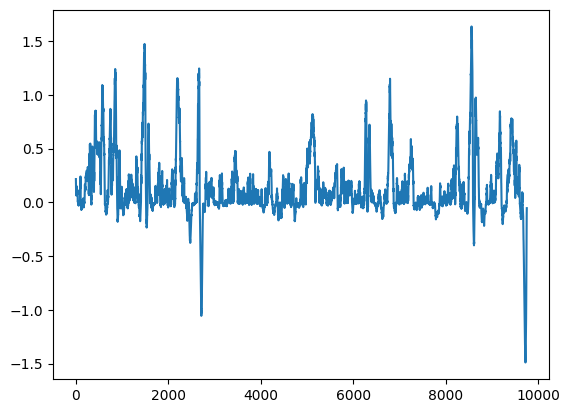

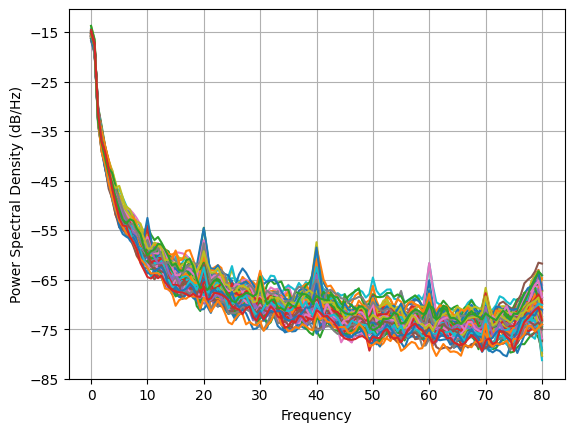

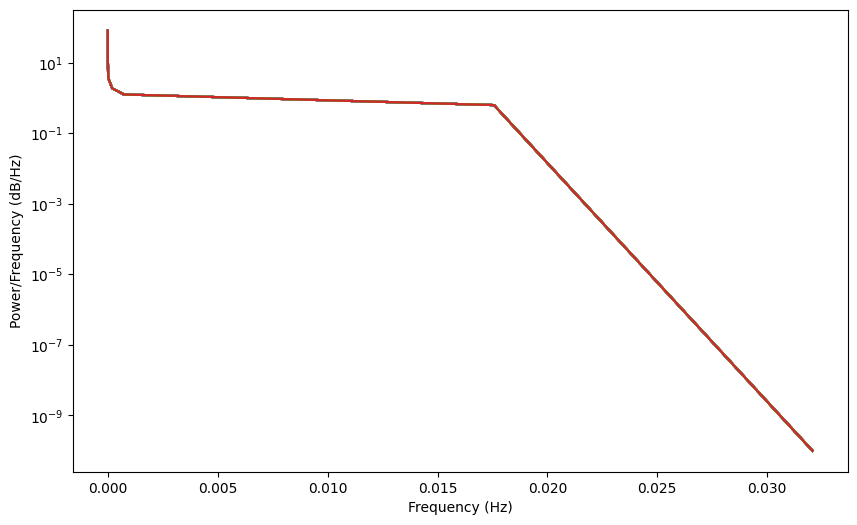

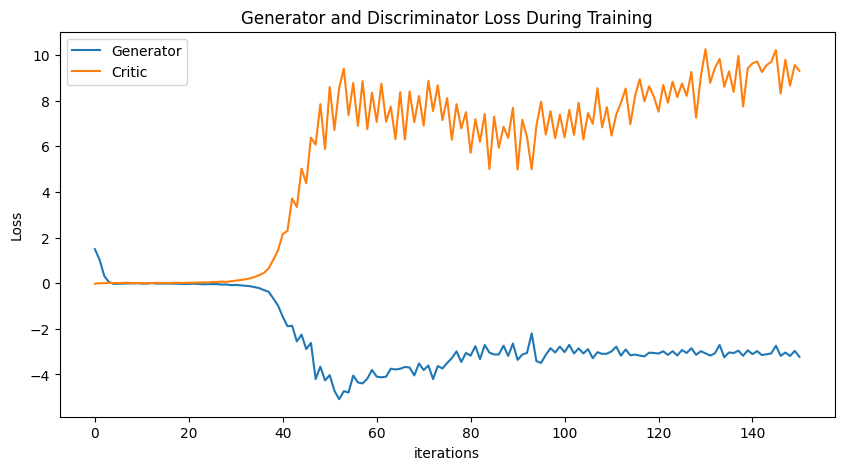

Epoch 200: Critic error ([1.493491743951764, 1.0297300407104908, 0.31821170060690085, 0.047066093688365215, -0.028496448325527644, -0.0225187089307283, -0.015629416025582085, -0.01378938394098108, -0.009773975038712999, -0.0013081979541858975, -0.018717071213017262, -0.015487240317292025, 0.00644922517597632, -0.015224321160736937, -0.016519796698680828, -0.018265491993586007, -0.021269802336070995, -0.019197189185209573, -0.027139798976587304, -0.03541478204906638, -0.030613700138515117, -0.024402489876166597, -0.03301970403756731, -0.046650026428749755, -0.041355115246500936, -0.039219336093696405, -0.040651947852512756, -0.05869791214667712, -0.05730334662062509, -0.08610837854742748, -0.07363779945824149, -0.0934385278939954, -0.10984255304980137, -0.13078385194499245, -0.17338520172026411, -0.21537982122613467, -0.3035513449449166, -0.3760162666957871, -0.6713722841394524, -0.984223104256886, -1.469641029621817, -1.884953483349705, -1.8660245544478733, -2.5502997897868536, -2.2526

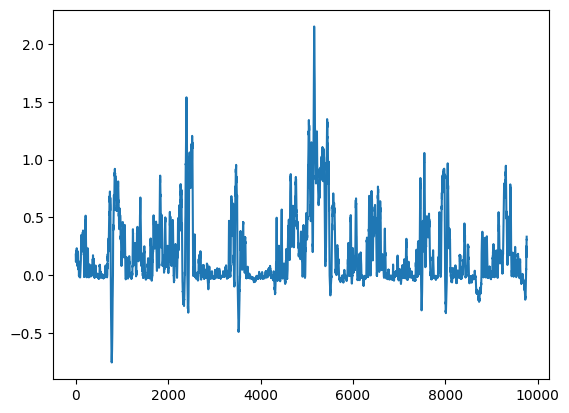

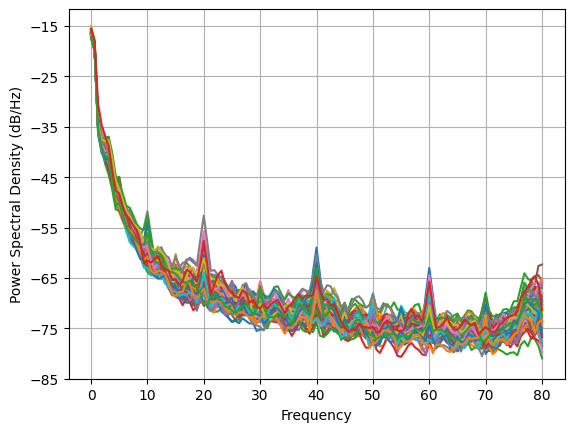

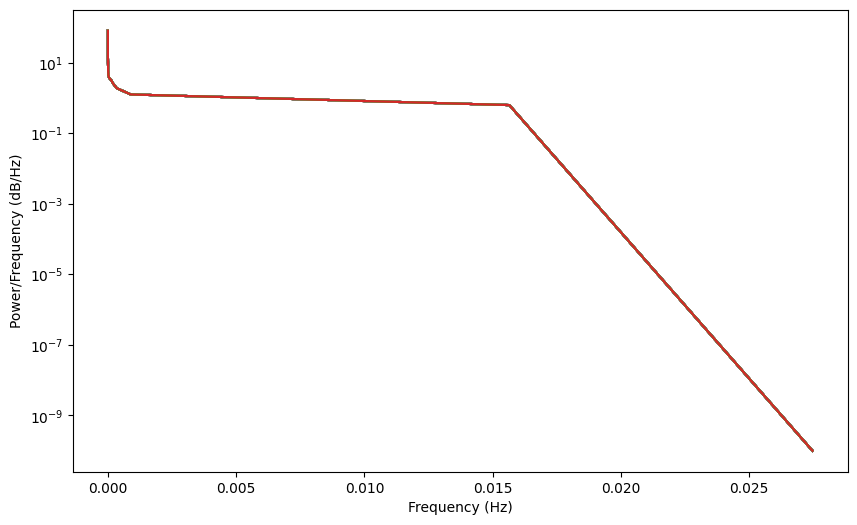

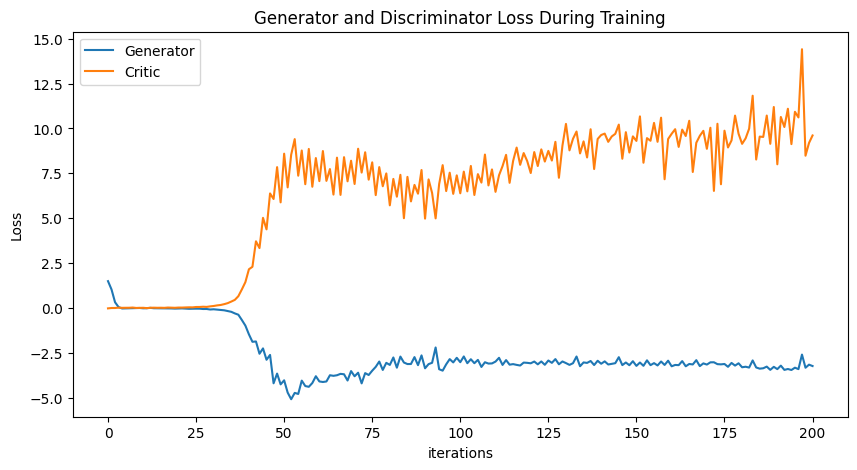

Epoch 250: Critic error ([1.493491743951764, 1.0297300407104908, 0.31821170060690085, 0.047066093688365215, -0.028496448325527644, -0.0225187089307283, -0.015629416025582085, -0.01378938394098108, -0.009773975038712999, -0.0013081979541858975, -0.018717071213017262, -0.015487240317292025, 0.00644922517597632, -0.015224321160736937, -0.016519796698680828, -0.018265491993586007, -0.021269802336070995, -0.019197189185209573, -0.027139798976587304, -0.03541478204906638, -0.030613700138515117, -0.024402489876166597, -0.03301970403756731, -0.046650026428749755, -0.041355115246500936, -0.039219336093696405, -0.040651947852512756, -0.05869791214667712, -0.05730334662062509, -0.08610837854742748, -0.07363779945824149, -0.0934385278939954, -0.10984255304980137, -0.13078385194499245, -0.17338520172026411, -0.21537982122613467, -0.3035513449449166, -0.3760162666957871, -0.6713722841394524, -0.984223104256886, -1.469641029621817, -1.884953483349705, -1.8660245544478733, -2.5502997897868536, -2.2526

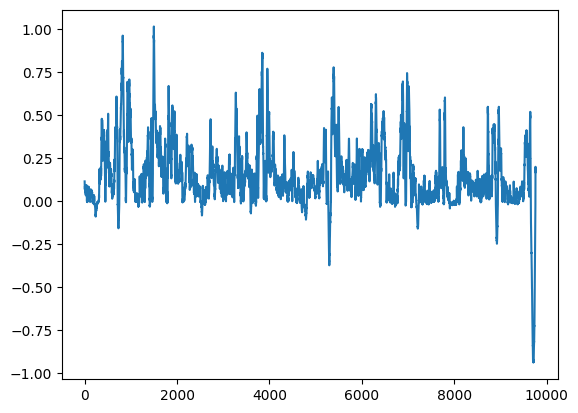

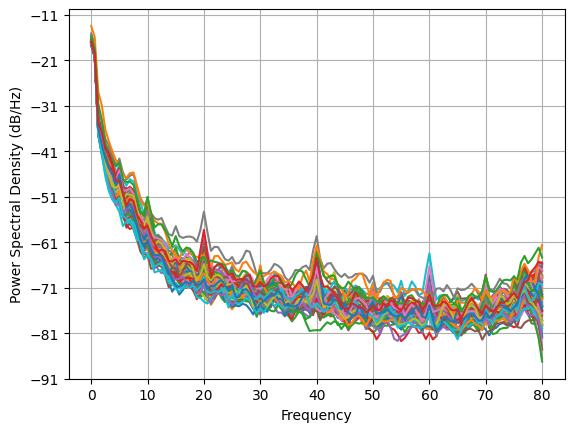

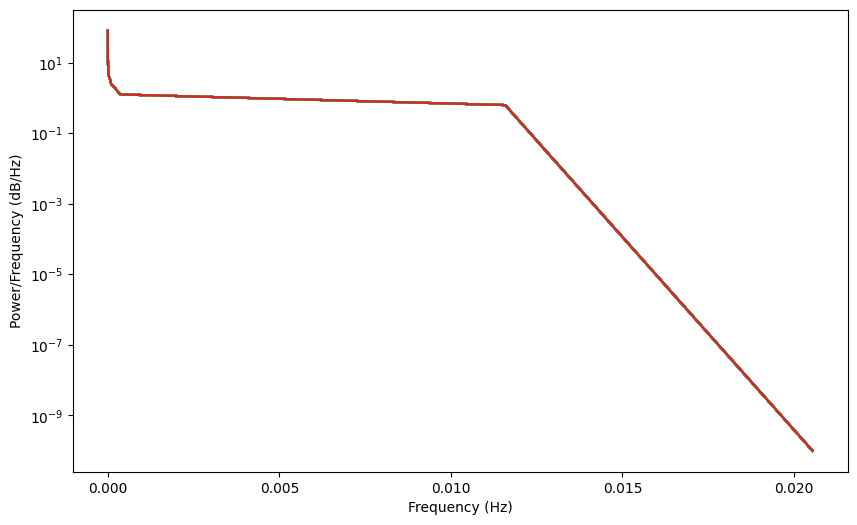

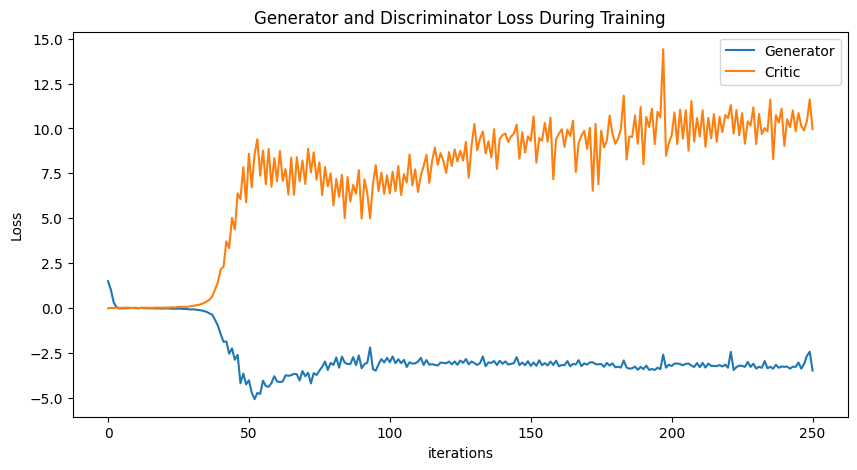

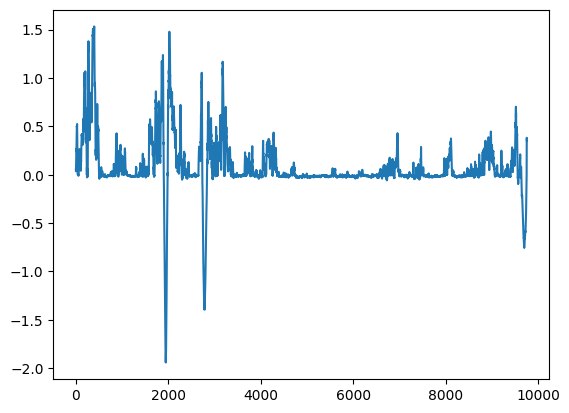

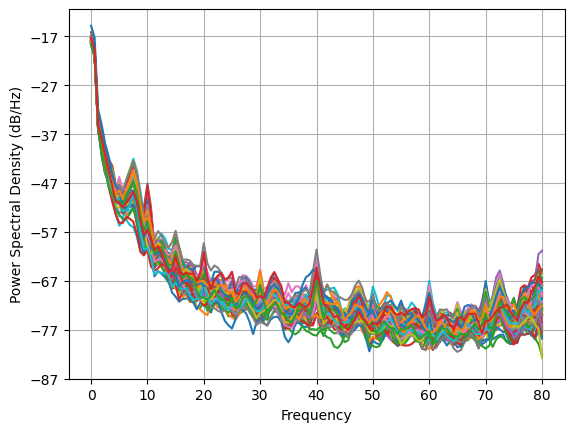

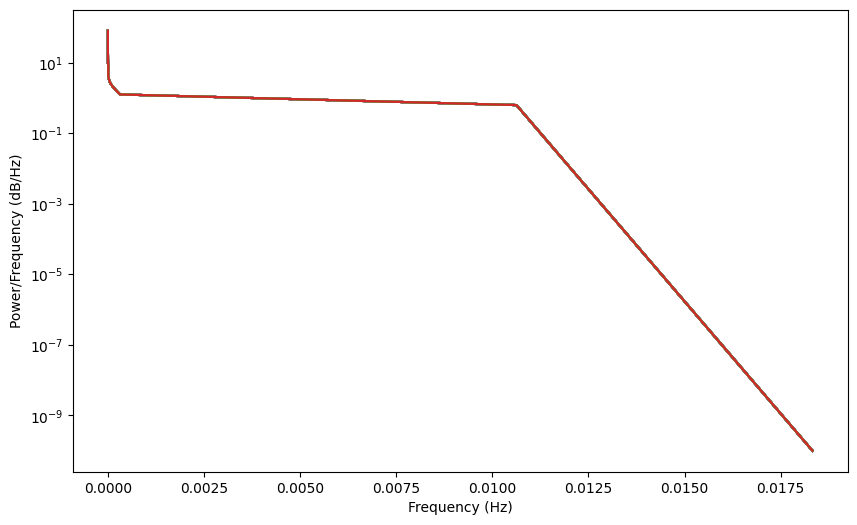

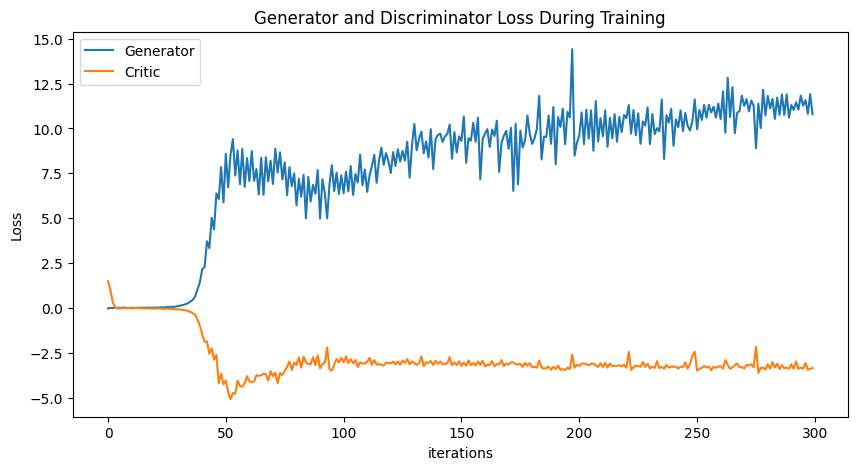

In [9]:
NUM_EPOCHS = 300
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(normalized_data_open)[0]

train_data = TensorDataset(torch.tensor(normalized_data_open).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=False),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=False),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=False),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=False),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=False),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=False),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for (real,) in train_loader:
            for _ in range(5):
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)
                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_closed_3, disc, gen = train()

torch.save(gen, 'gen4_3.pt')
torch.save(disc, 'disc4_3.pt')

plot_everything(generated_closed_3, gen_err, critic_err)

# Baseline + flatten (Disc makes 1 true/false output for 64 channels) 

Epoch 0: Critic error ([-2337.0957414128593]) Generator err ([21597.0])


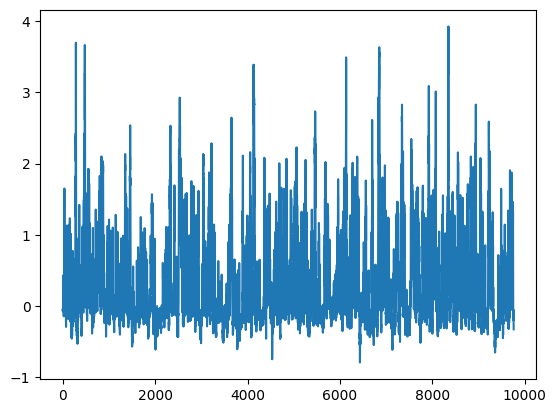

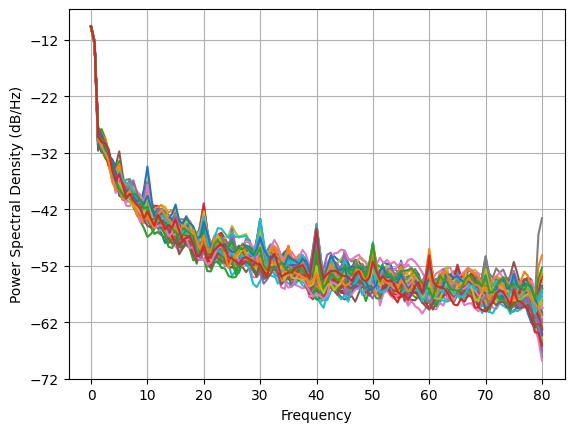

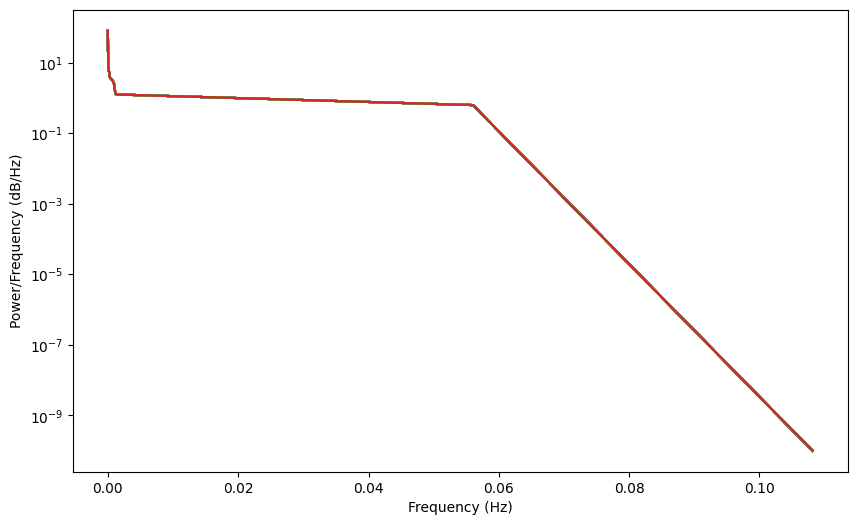

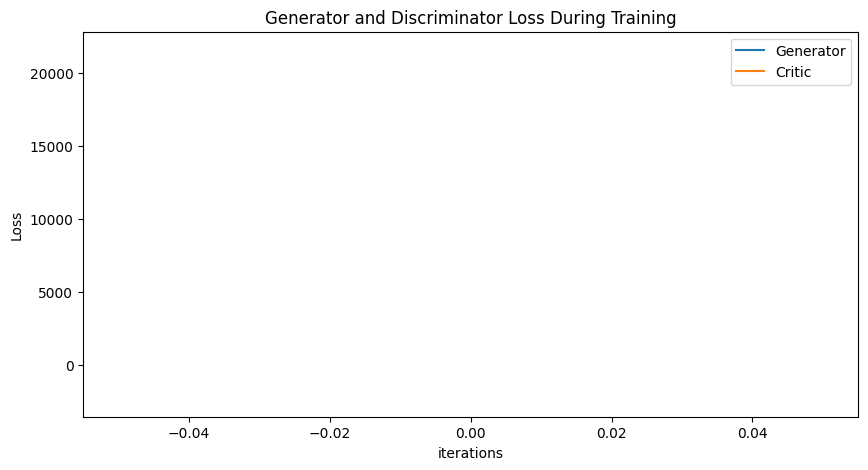

Epoch 50: Critic error ([-2337.0957414128593, -2834.841749413901, -3192.836822147551, -3379.9742090248324, -3030.601813889655, -2565.5876427310063, -3839.170026103092, -3384.8520825888545, -3120.9601287222263, -2955.1690576594506, -3274.070850878254, -3210.2378018296795, -3309.330244724198, -3303.213601223764, -2884.3073745219335, -3227.575262548125, -3071.54326526011, -2950.7506930145296, -2644.462897409037, -2667.049350757819, -2450.3942359011357, -2464.521208425565, -2442.955515797118, -2364.2513917094257, -2289.231355587615, -2603.0929506463945, -2381.5637922861174, -2362.4063444208987, -2407.2740715165696, -2507.7690649599836, -2451.5639445945726, -2499.7549137730684, -2336.395607652486, -2323.1084685255037, -2355.1346348066004, -2440.204807576865, -2215.351923222539, -2242.04016389593, -2285.515583217645, -2389.4908239862802, -2233.7604436328984, -2195.988621792276, -2388.6721838755993, -2290.122702349565, -2344.338146298792, -2194.9376602186912, -2291.5395108307534, -2216.167153

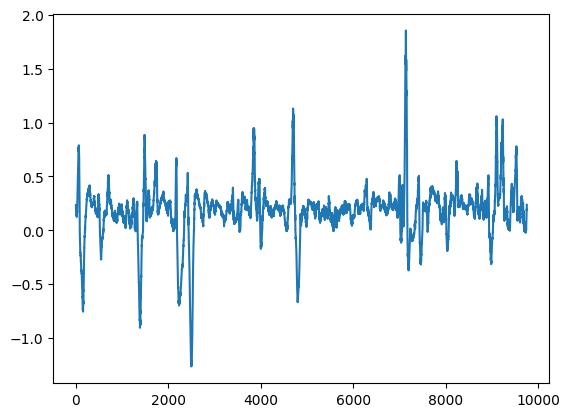

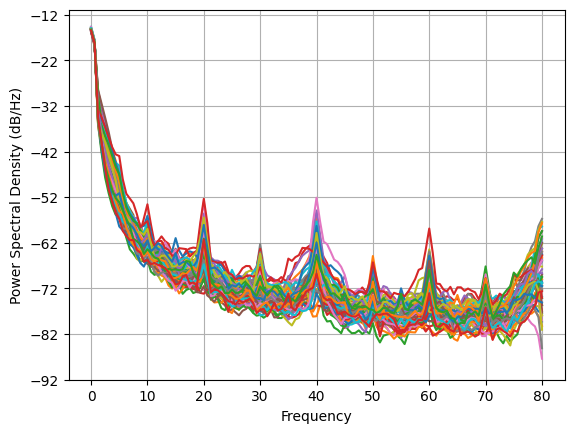

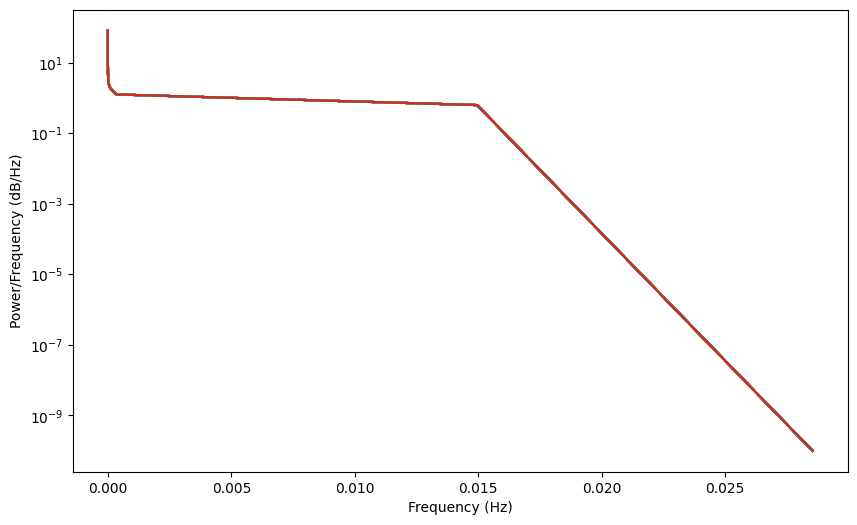

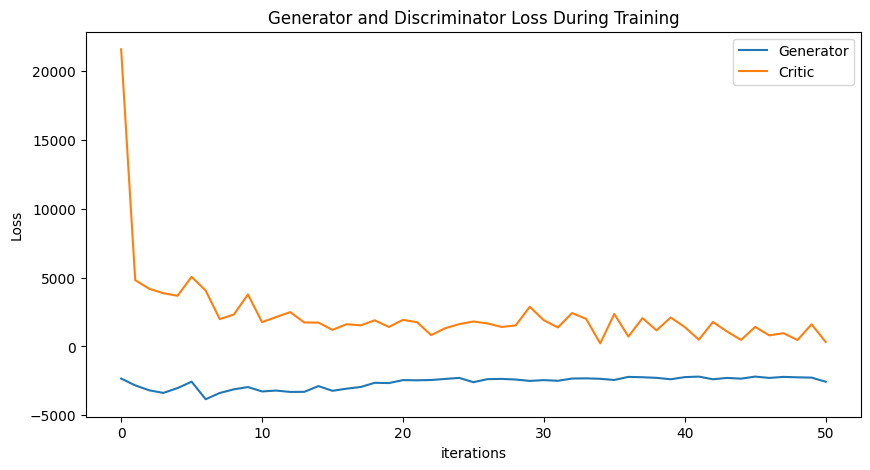

Epoch 100: Critic error ([-2337.0957414128593, -2834.841749413901, -3192.836822147551, -3379.9742090248324, -3030.601813889655, -2565.5876427310063, -3839.170026103092, -3384.8520825888545, -3120.9601287222263, -2955.1690576594506, -3274.070850878254, -3210.2378018296795, -3309.330244724198, -3303.213601223764, -2884.3073745219335, -3227.575262548125, -3071.54326526011, -2950.7506930145296, -2644.462897409037, -2667.049350757819, -2450.3942359011357, -2464.521208425565, -2442.955515797118, -2364.2513917094257, -2289.231355587615, -2603.0929506463945, -2381.5637922861174, -2362.4063444208987, -2407.2740715165696, -2507.7690649599836, -2451.5639445945726, -2499.7549137730684, -2336.395607652486, -2323.1084685255037, -2355.1346348066004, -2440.204807576865, -2215.351923222539, -2242.04016389593, -2285.515583217645, -2389.4908239862802, -2233.7604436328984, -2195.988621792276, -2388.6721838755993, -2290.122702349565, -2344.338146298792, -2194.9376602186912, -2291.5395108307534, -2216.16715

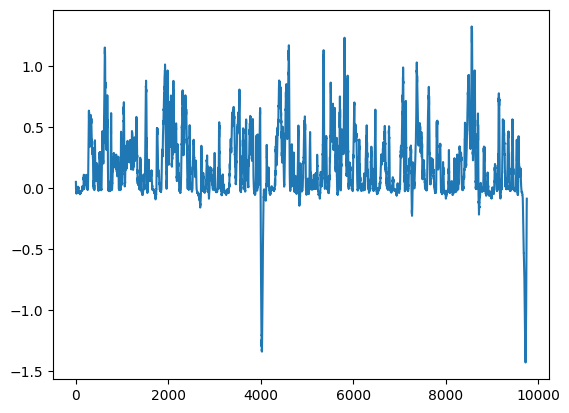

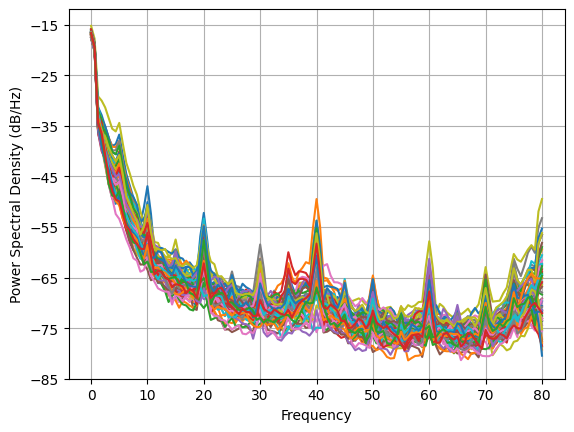

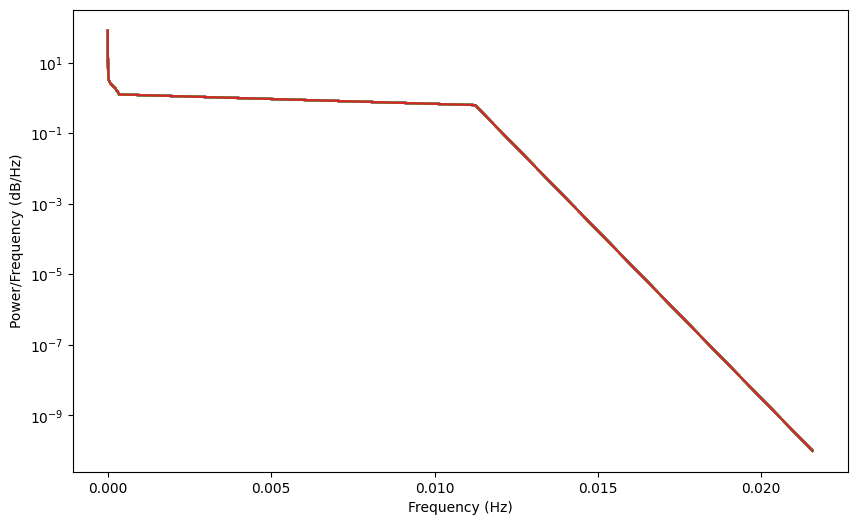

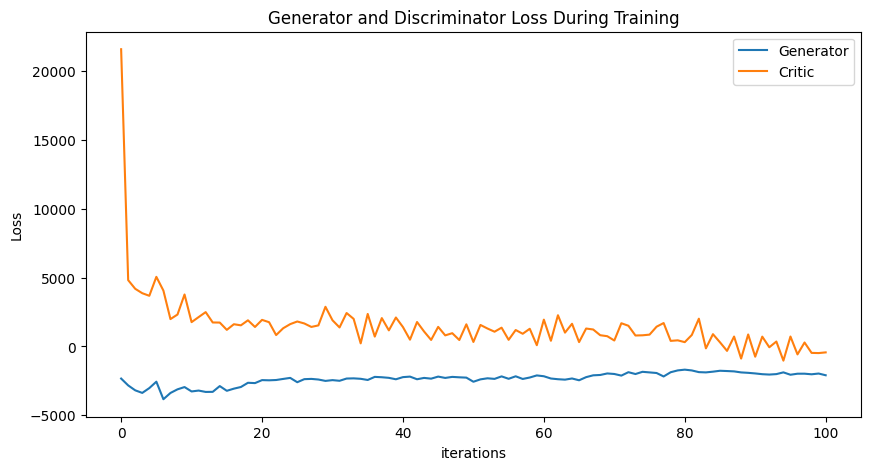

Epoch 150: Critic error ([-2337.0957414128593, -2834.841749413901, -3192.836822147551, -3379.9742090248324, -3030.601813889655, -2565.5876427310063, -3839.170026103092, -3384.8520825888545, -3120.9601287222263, -2955.1690576594506, -3274.070850878254, -3210.2378018296795, -3309.330244724198, -3303.213601223764, -2884.3073745219335, -3227.575262548125, -3071.54326526011, -2950.7506930145296, -2644.462897409037, -2667.049350757819, -2450.3942359011357, -2464.521208425565, -2442.955515797118, -2364.2513917094257, -2289.231355587615, -2603.0929506463945, -2381.5637922861174, -2362.4063444208987, -2407.2740715165696, -2507.7690649599836, -2451.5639445945726, -2499.7549137730684, -2336.395607652486, -2323.1084685255037, -2355.1346348066004, -2440.204807576865, -2215.351923222539, -2242.04016389593, -2285.515583217645, -2389.4908239862802, -2233.7604436328984, -2195.988621792276, -2388.6721838755993, -2290.122702349565, -2344.338146298792, -2194.9376602186912, -2291.5395108307534, -2216.16715

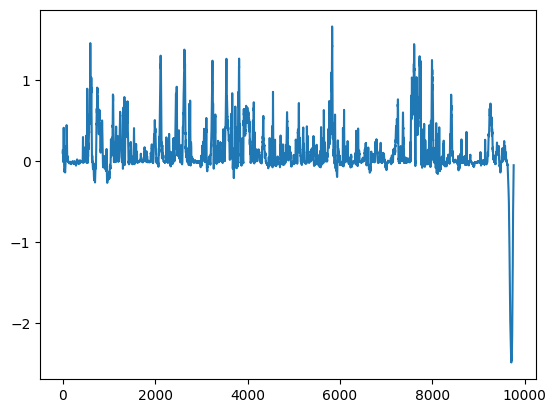

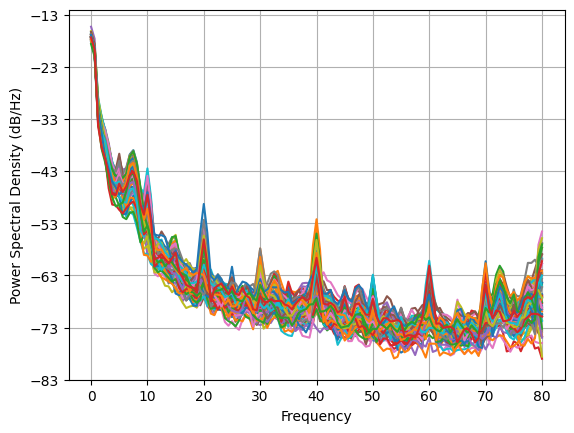

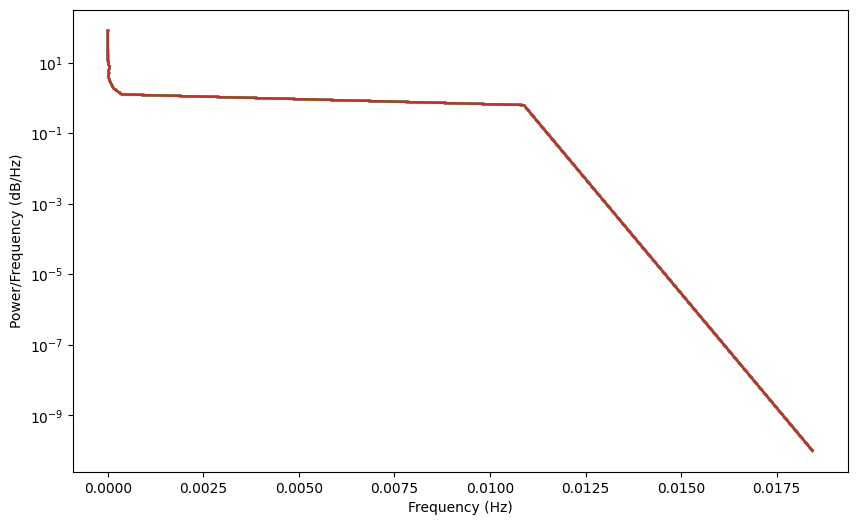

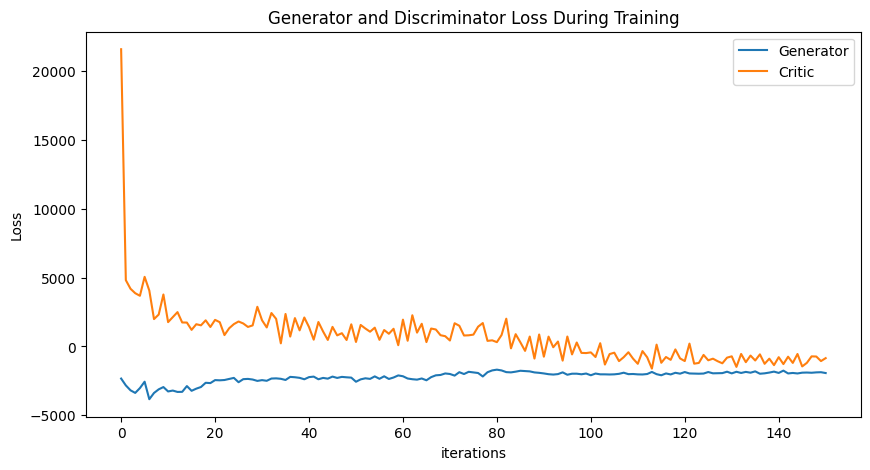

Epoch 200: Critic error ([-2337.0957414128593, -2834.841749413901, -3192.836822147551, -3379.9742090248324, -3030.601813889655, -2565.5876427310063, -3839.170026103092, -3384.8520825888545, -3120.9601287222263, -2955.1690576594506, -3274.070850878254, -3210.2378018296795, -3309.330244724198, -3303.213601223764, -2884.3073745219335, -3227.575262548125, -3071.54326526011, -2950.7506930145296, -2644.462897409037, -2667.049350757819, -2450.3942359011357, -2464.521208425565, -2442.955515797118, -2364.2513917094257, -2289.231355587615, -2603.0929506463945, -2381.5637922861174, -2362.4063444208987, -2407.2740715165696, -2507.7690649599836, -2451.5639445945726, -2499.7549137730684, -2336.395607652486, -2323.1084685255037, -2355.1346348066004, -2440.204807576865, -2215.351923222539, -2242.04016389593, -2285.515583217645, -2389.4908239862802, -2233.7604436328984, -2195.988621792276, -2388.6721838755993, -2290.122702349565, -2344.338146298792, -2194.9376602186912, -2291.5395108307534, -2216.16715

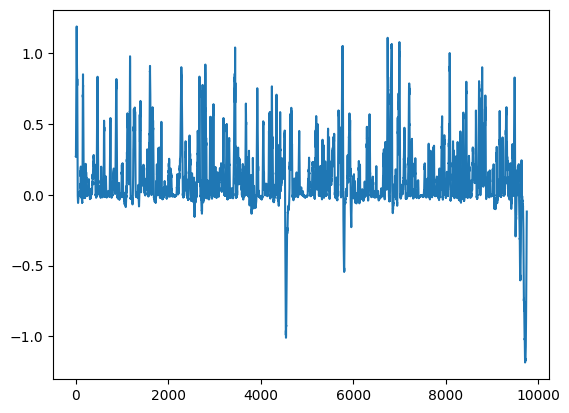

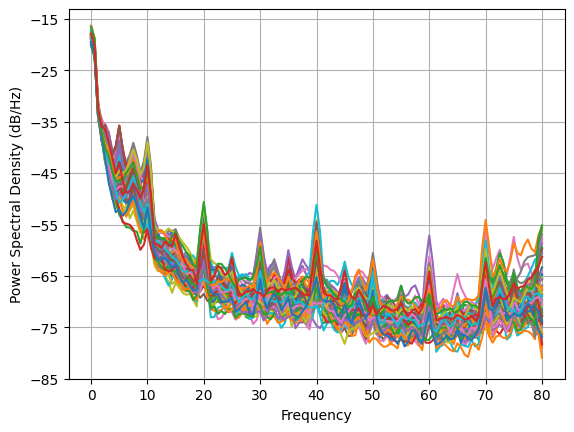

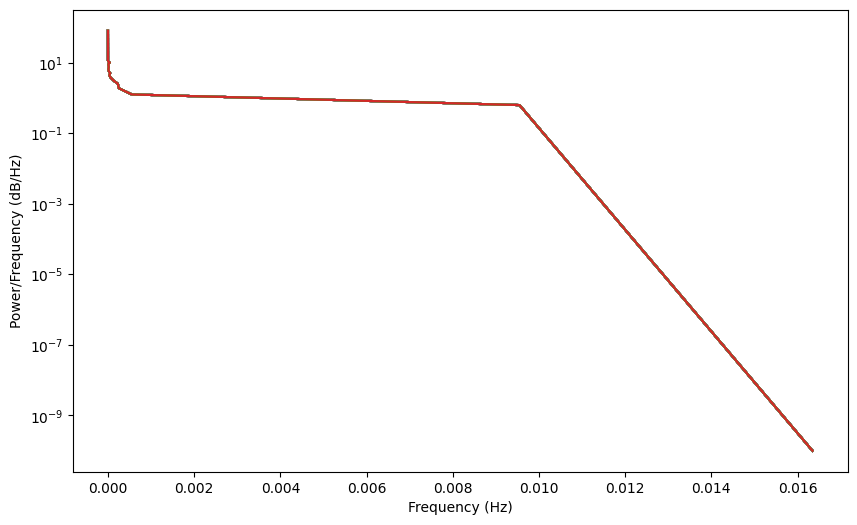

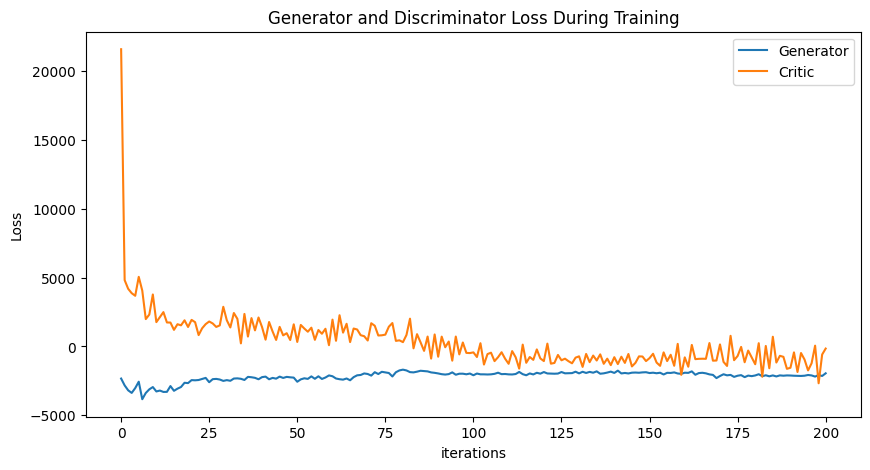

Epoch 250: Critic error ([-2337.0957414128593, -2834.841749413901, -3192.836822147551, -3379.9742090248324, -3030.601813889655, -2565.5876427310063, -3839.170026103092, -3384.8520825888545, -3120.9601287222263, -2955.1690576594506, -3274.070850878254, -3210.2378018296795, -3309.330244724198, -3303.213601223764, -2884.3073745219335, -3227.575262548125, -3071.54326526011, -2950.7506930145296, -2644.462897409037, -2667.049350757819, -2450.3942359011357, -2464.521208425565, -2442.955515797118, -2364.2513917094257, -2289.231355587615, -2603.0929506463945, -2381.5637922861174, -2362.4063444208987, -2407.2740715165696, -2507.7690649599836, -2451.5639445945726, -2499.7549137730684, -2336.395607652486, -2323.1084685255037, -2355.1346348066004, -2440.204807576865, -2215.351923222539, -2242.04016389593, -2285.515583217645, -2389.4908239862802, -2233.7604436328984, -2195.988621792276, -2388.6721838755993, -2290.122702349565, -2344.338146298792, -2194.9376602186912, -2291.5395108307534, -2216.16715

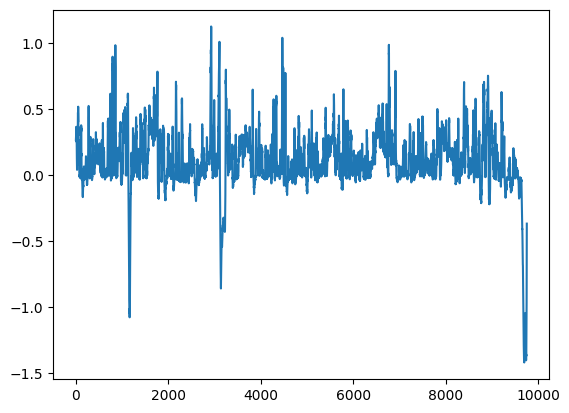

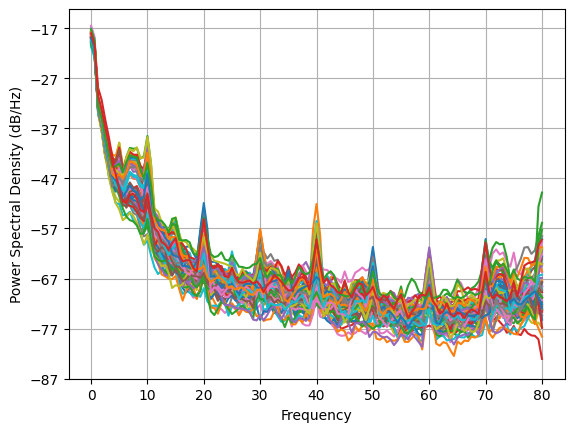

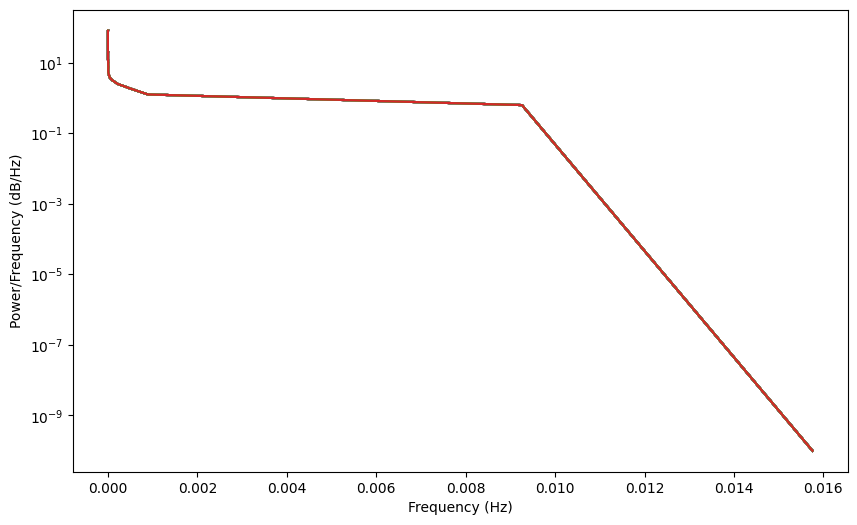

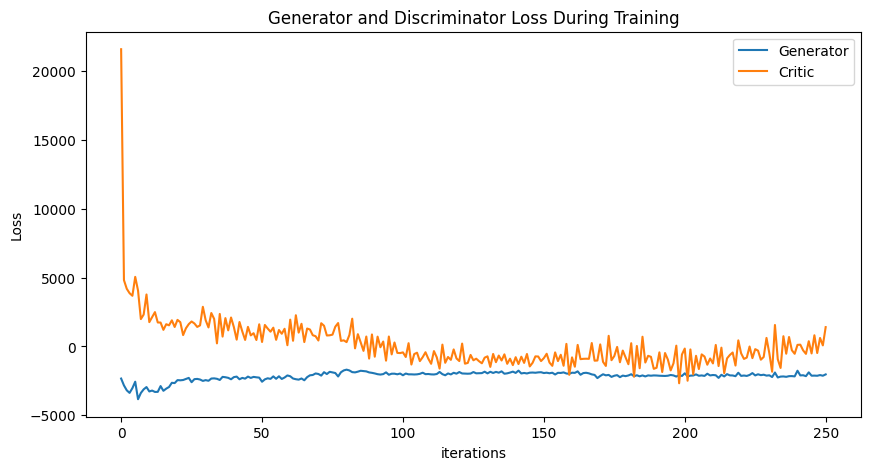

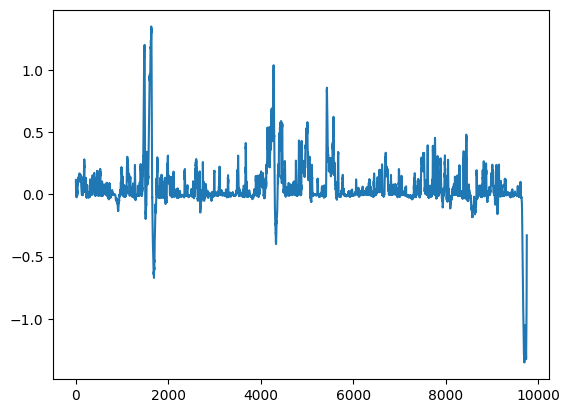

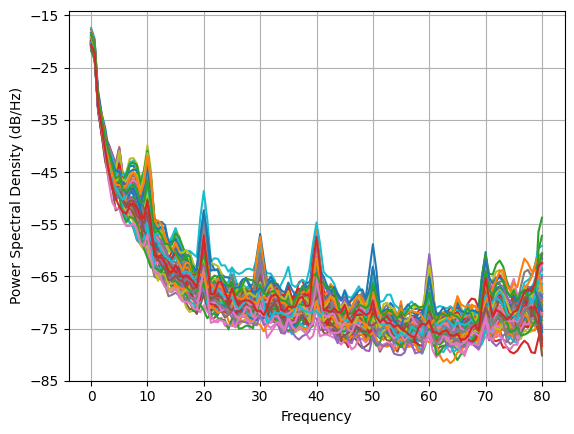

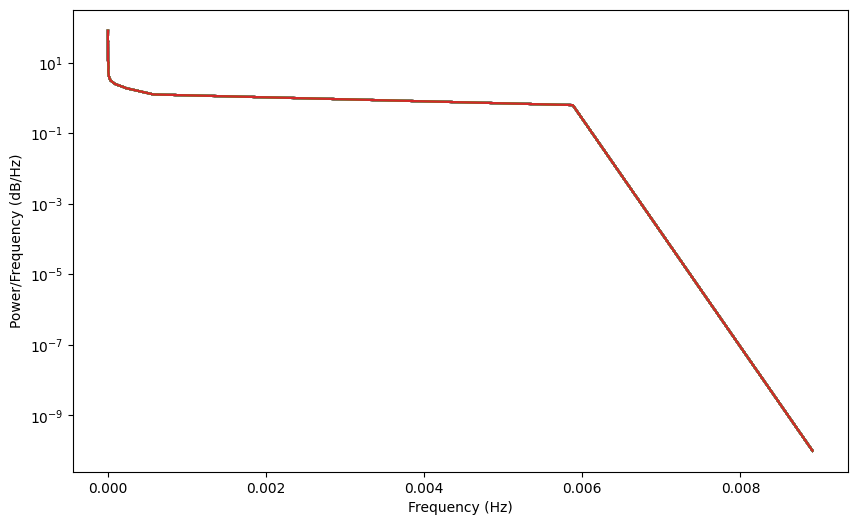

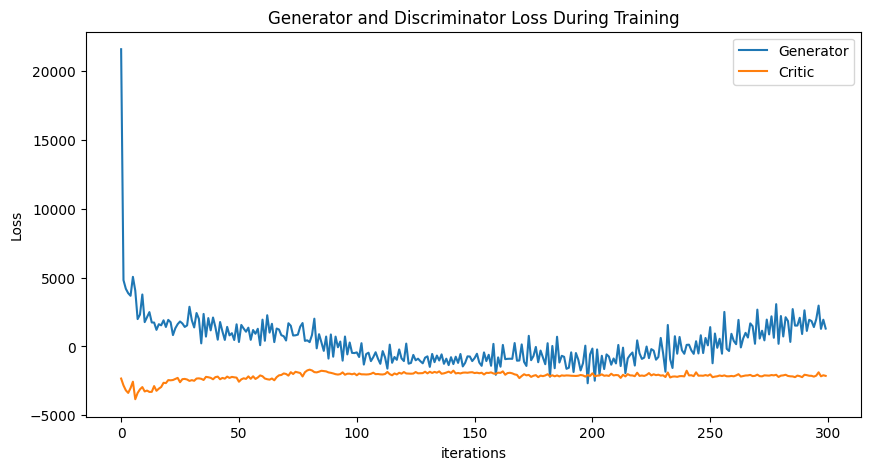

In [7]:
NUM_EPOCHS = 300
PRINT_INTERVAL = 50
BATCH_SIZE = np.shape(normalized_data_open)[0]

train_data = TensorDataset(torch.tensor(normalized_data_open).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Flatten(), 
            nn.Linear(19520, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for (real,) in train_loader:
            for _ in range(5):
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)
                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_closed_4, disc, gen = train()

torch.save(gen, 'gen4_4.pt')
torch.save(disc, 'disc4_4.pt')

plot_everything(generated_closed_4, gen_err, critic_err)

# Baseline + Tanh + flatten (Disc makes 1 true/false output for 64 channels) 
# bigger disc, higher LR

Epoch 0: Critic error ([0.6885826130416479]) Generator err ([30.18351173400879])


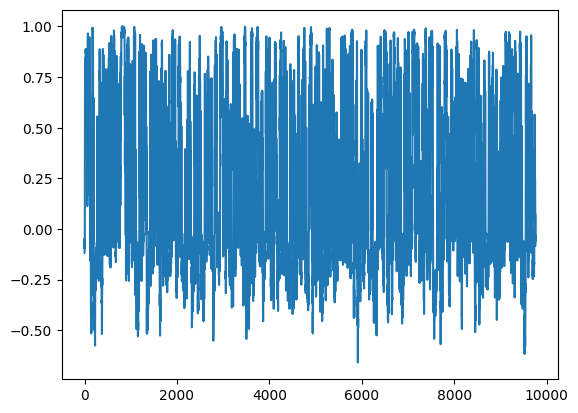

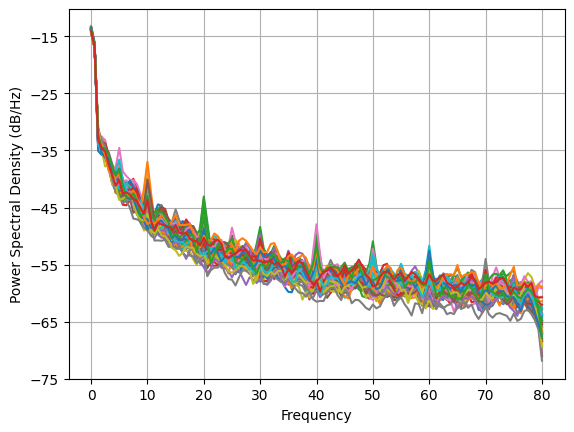

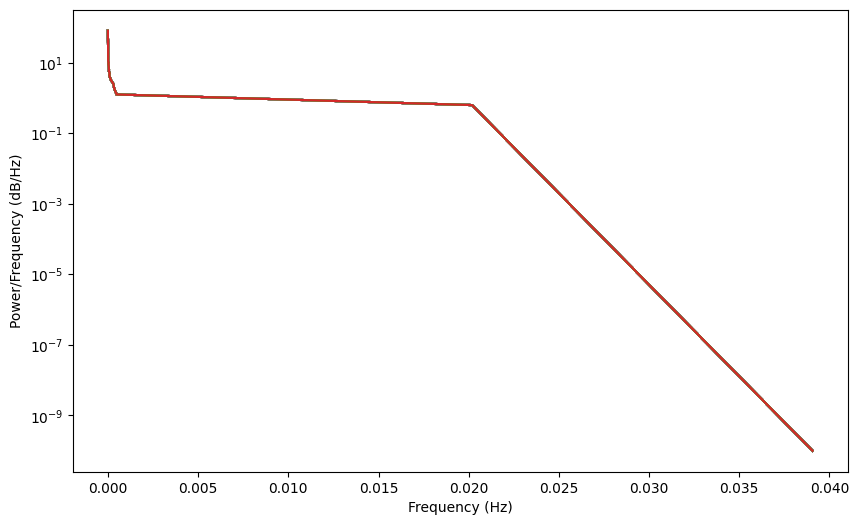

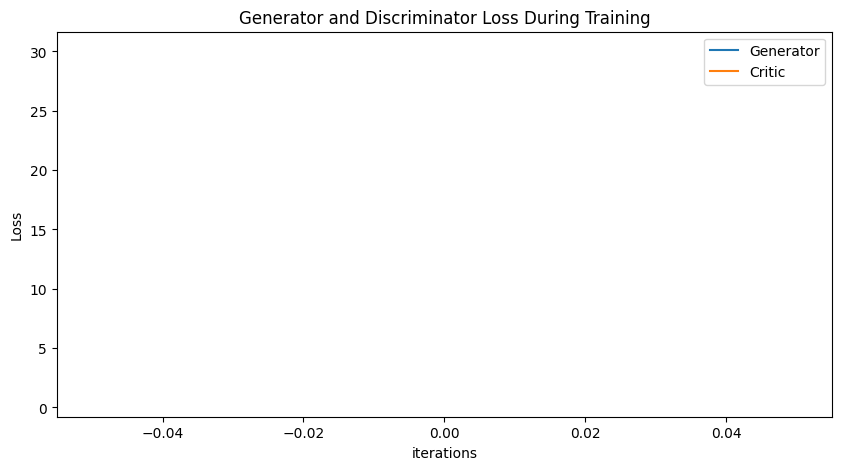

Epoch 25: Critic error ([0.6885826130416479, 0.16965117618913972, -301.5321389013607, 4.726798039269767, 4.547169763994072, 4.4297431224987145, 4.172676367460495, 3.9472600998981395, 3.584533098299273, 1.4505722537033137, -1.1125052283036476, -5.538010237991461, -30.9433405547383, -655.2924383305321, -7.295822976046338, -87.90702365964054, -359.53579252472167, -342.50567799257533, -50.49142903336721, -919.5582088843395, -286.00777356182743, -823.1714649468568, -685.7858913947388, -25.404094383601247, -43.215558182795306, -81.31134102318043]) Generator err ([30.18351173400879, 2.729623556137085, -966.7296752929688, 0.47672659158706665, 0.5315682291984558, 0.7272634506225586, 0.7343072295188904, 0.9086995720863342, 0.8401132822036743, -0.09078031778335571, 0.620218813419342, -3.2782082557678223, 3.276771306991577, -394.4200744628906, 38.9017333984375, 493.853759765625, 2681.999267578125, 1247.7210693359375, -151.5666961669922, -2363.95849609375, 1043.2325439453125, 787.702392578125, 3904

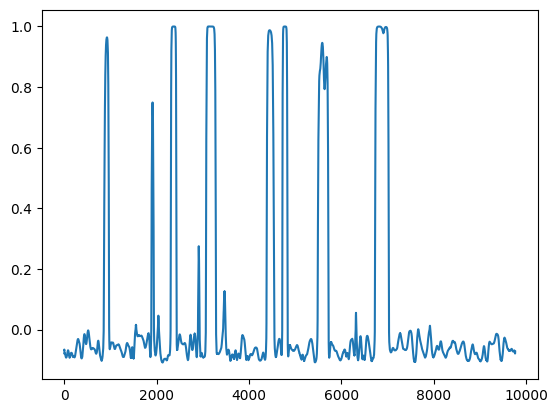

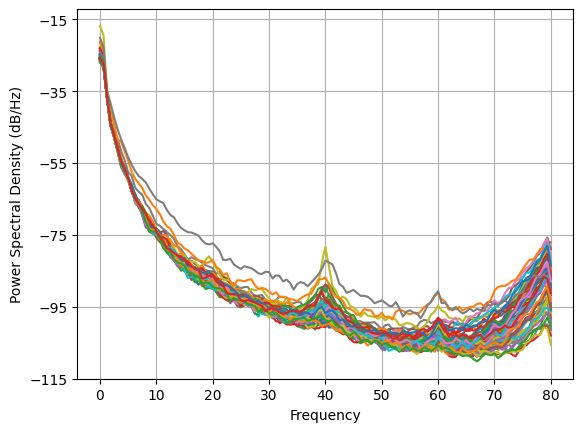

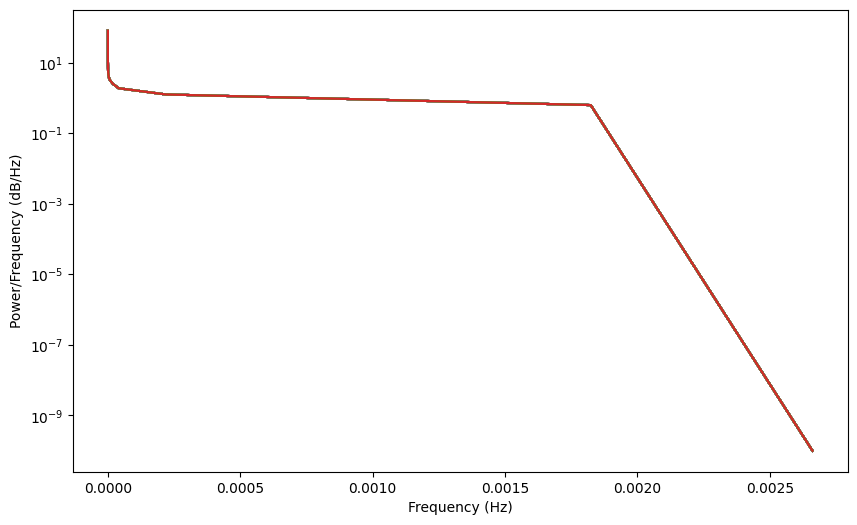

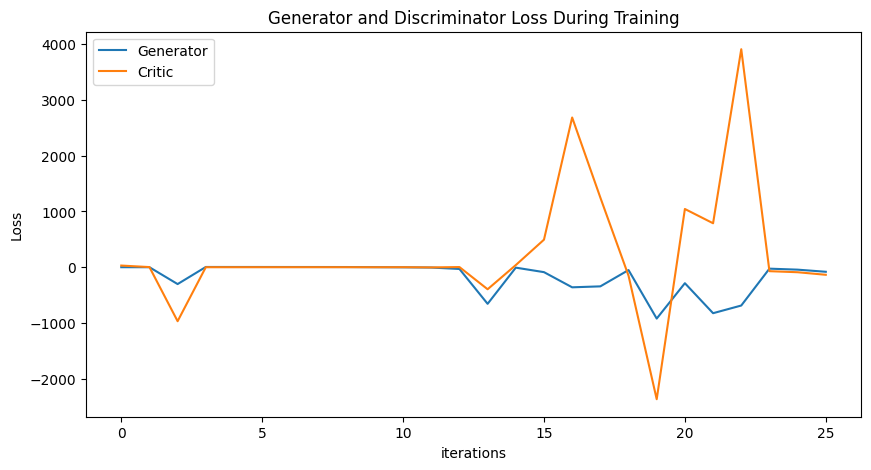

Epoch 50: Critic error ([0.6885826130416479, 0.16965117618913972, -301.5321389013607, 4.726798039269767, 4.547169763994072, 4.4297431224987145, 4.172676367460495, 3.9472600998981395, 3.584533098299273, 1.4505722537033137, -1.1125052283036476, -5.538010237991461, -30.9433405547383, -655.2924383305321, -7.295822976046338, -87.90702365964054, -359.53579252472167, -342.50567799257533, -50.49142903336721, -919.5582088843395, -286.00777356182743, -823.1714649468568, -685.7858913947388, -25.404094383601247, -43.215558182795306, -81.31134102318043, -229.7946142461082, -812.284318160045, -1057.7161573070434, -1043.6522178075552, -1045.4714623676232, -1082.6698963087676, -927.3439793457399, -914.281522758653, -817.0398258072553, -952.0280722262062, -896.2793348354313, -1020.7808096879388, -969.2728015831478, -979.6540614666624, -874.3526868775518, -1106.1143304820148, -824.4152983321169, -1250.9347759593338, -1150.6811978327742, -1688.244581897198, -1233.2111006167859, -62.72987930928217, -1182.

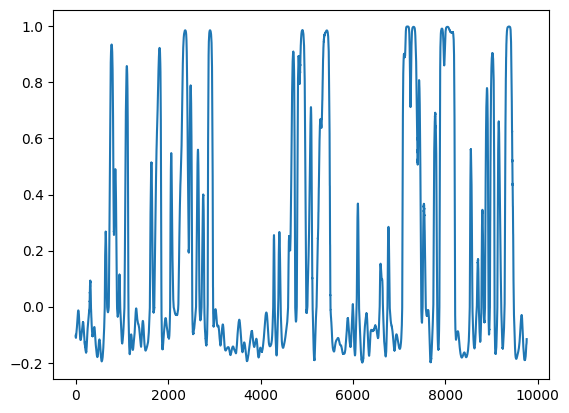

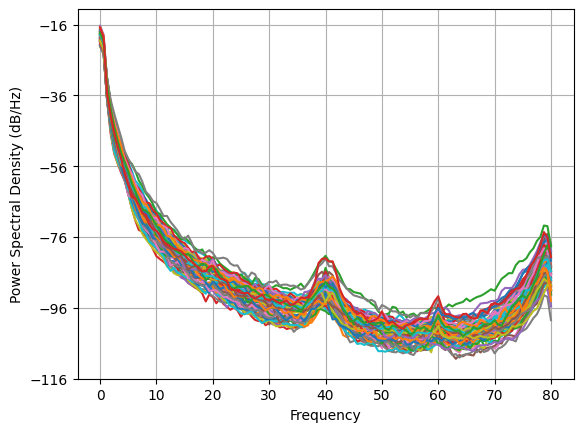

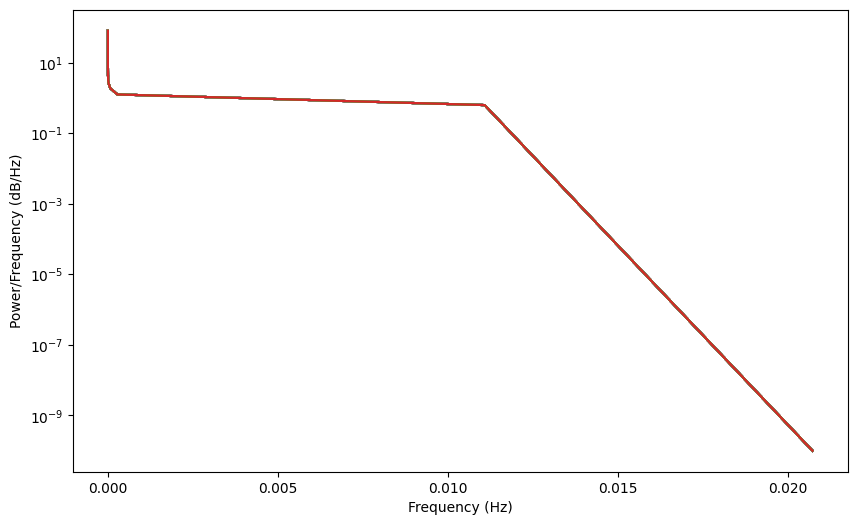

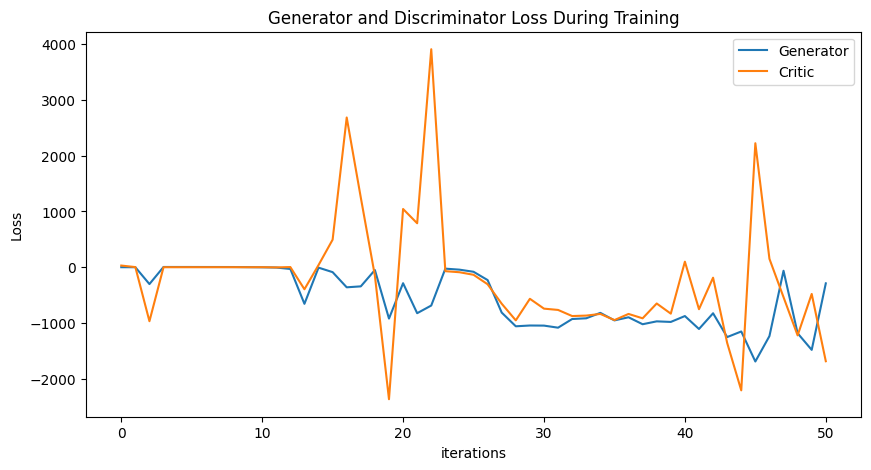

Epoch 75: Critic error ([0.6885826130416479, 0.16965117618913972, -301.5321389013607, 4.726798039269767, 4.547169763994072, 4.4297431224987145, 4.172676367460495, 3.9472600998981395, 3.584533098299273, 1.4505722537033137, -1.1125052283036476, -5.538010237991461, -30.9433405547383, -655.2924383305321, -7.295822976046338, -87.90702365964054, -359.53579252472167, -342.50567799257533, -50.49142903336721, -919.5582088843395, -286.00777356182743, -823.1714649468568, -685.7858913947388, -25.404094383601247, -43.215558182795306, -81.31134102318043, -229.7946142461082, -812.284318160045, -1057.7161573070434, -1043.6522178075552, -1045.4714623676232, -1082.6698963087676, -927.3439793457399, -914.281522758653, -817.0398258072553, -952.0280722262062, -896.2793348354313, -1020.7808096879388, -969.2728015831478, -979.6540614666624, -874.3526868775518, -1106.1143304820148, -824.4152983321169, -1250.9347759593338, -1150.6811978327742, -1688.244581897198, -1233.2111006167859, -62.72987930928217, -1182.

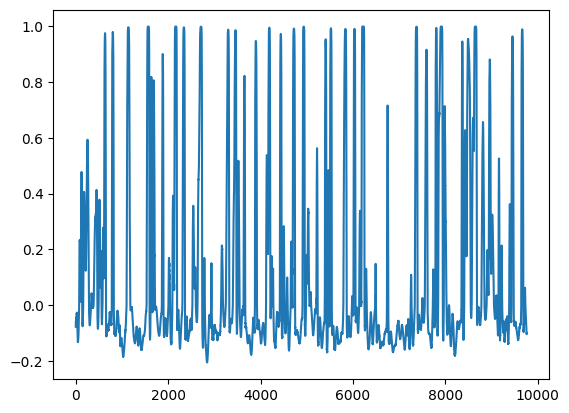

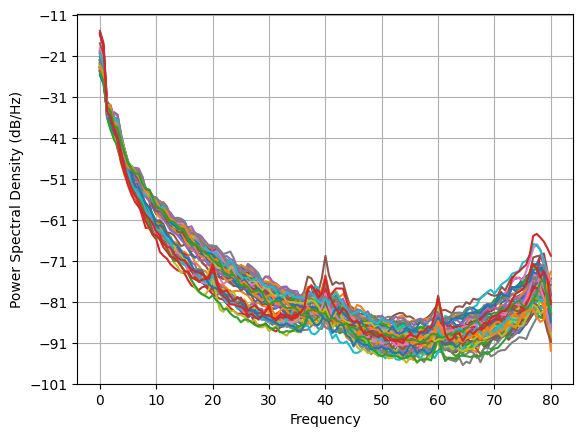

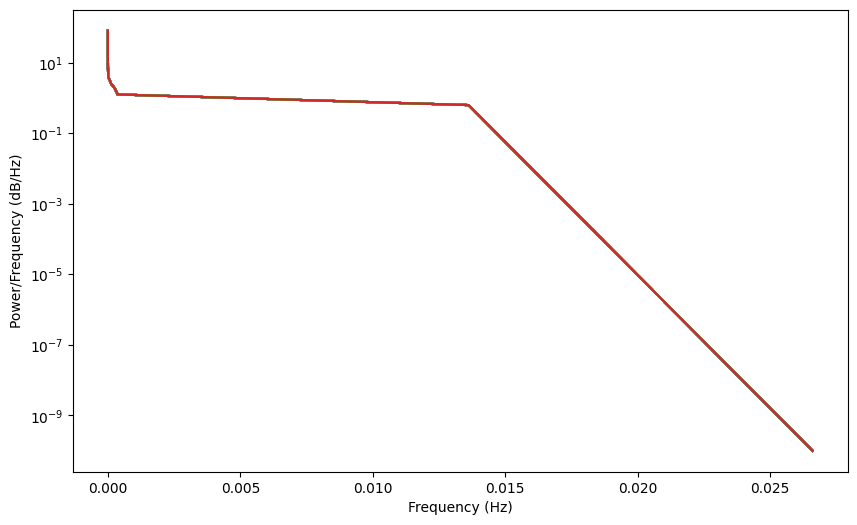

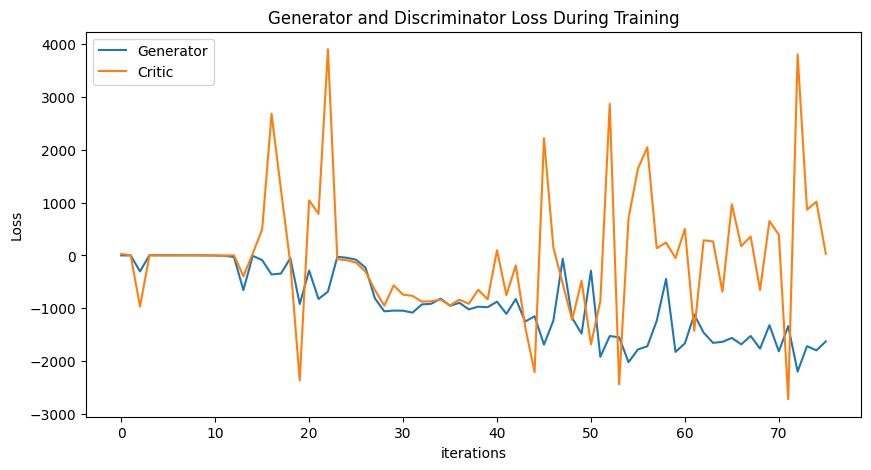

Epoch 100: Critic error ([0.6885826130416479, 0.16965117618913972, -301.5321389013607, 4.726798039269767, 4.547169763994072, 4.4297431224987145, 4.172676367460495, 3.9472600998981395, 3.584533098299273, 1.4505722537033137, -1.1125052283036476, -5.538010237991461, -30.9433405547383, -655.2924383305321, -7.295822976046338, -87.90702365964054, -359.53579252472167, -342.50567799257533, -50.49142903336721, -919.5582088843395, -286.00777356182743, -823.1714649468568, -685.7858913947388, -25.404094383601247, -43.215558182795306, -81.31134102318043, -229.7946142461082, -812.284318160045, -1057.7161573070434, -1043.6522178075552, -1045.4714623676232, -1082.6698963087676, -927.3439793457399, -914.281522758653, -817.0398258072553, -952.0280722262062, -896.2793348354313, -1020.7808096879388, -969.2728015831478, -979.6540614666624, -874.3526868775518, -1106.1143304820148, -824.4152983321169, -1250.9347759593338, -1150.6811978327742, -1688.244581897198, -1233.2111006167859, -62.72987930928217, -1182

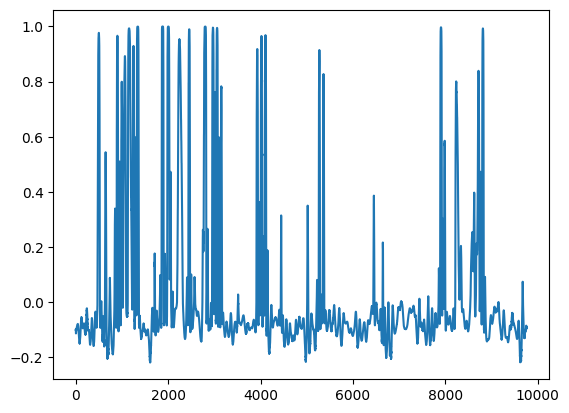

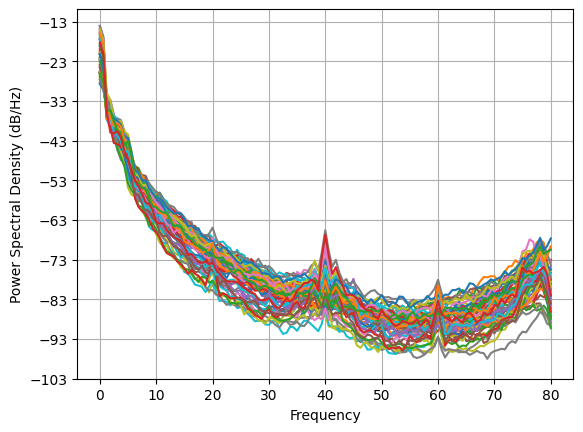

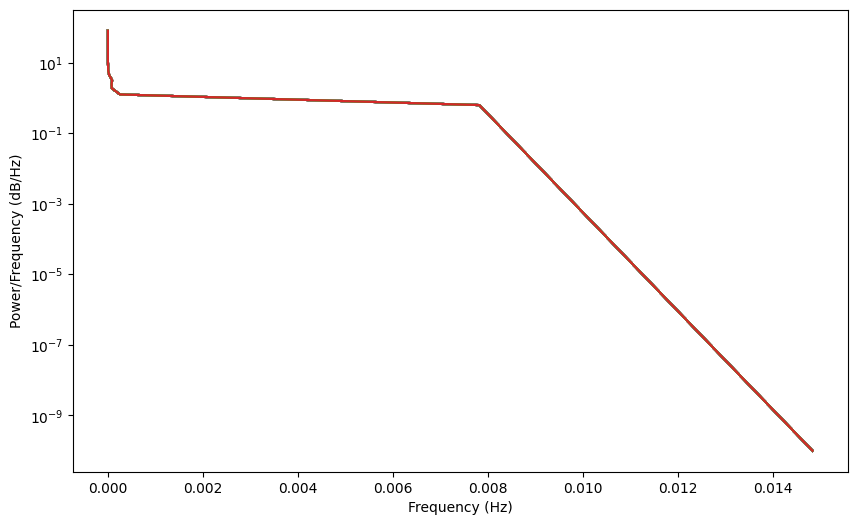

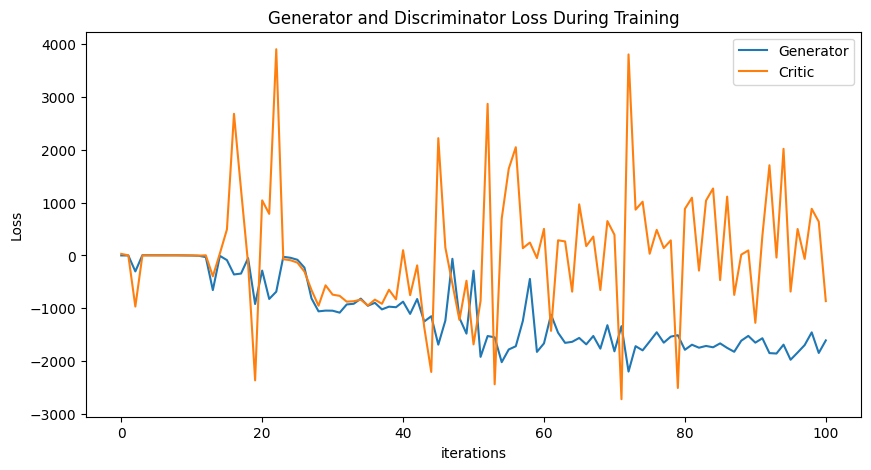

Epoch 125: Critic error ([0.6885826130416479, 0.16965117618913972, -301.5321389013607, 4.726798039269767, 4.547169763994072, 4.4297431224987145, 4.172676367460495, 3.9472600998981395, 3.584533098299273, 1.4505722537033137, -1.1125052283036476, -5.538010237991461, -30.9433405547383, -655.2924383305321, -7.295822976046338, -87.90702365964054, -359.53579252472167, -342.50567799257533, -50.49142903336721, -919.5582088843395, -286.00777356182743, -823.1714649468568, -685.7858913947388, -25.404094383601247, -43.215558182795306, -81.31134102318043, -229.7946142461082, -812.284318160045, -1057.7161573070434, -1043.6522178075552, -1045.4714623676232, -1082.6698963087676, -927.3439793457399, -914.281522758653, -817.0398258072553, -952.0280722262062, -896.2793348354313, -1020.7808096879388, -969.2728015831478, -979.6540614666624, -874.3526868775518, -1106.1143304820148, -824.4152983321169, -1250.9347759593338, -1150.6811978327742, -1688.244581897198, -1233.2111006167859, -62.72987930928217, -1182

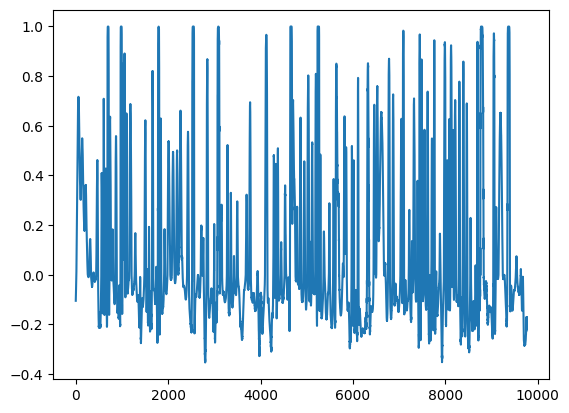

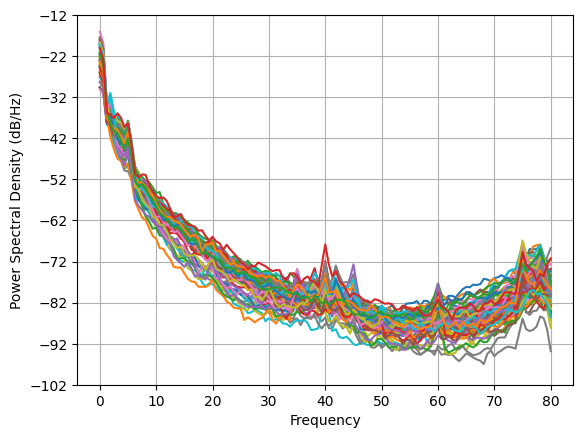

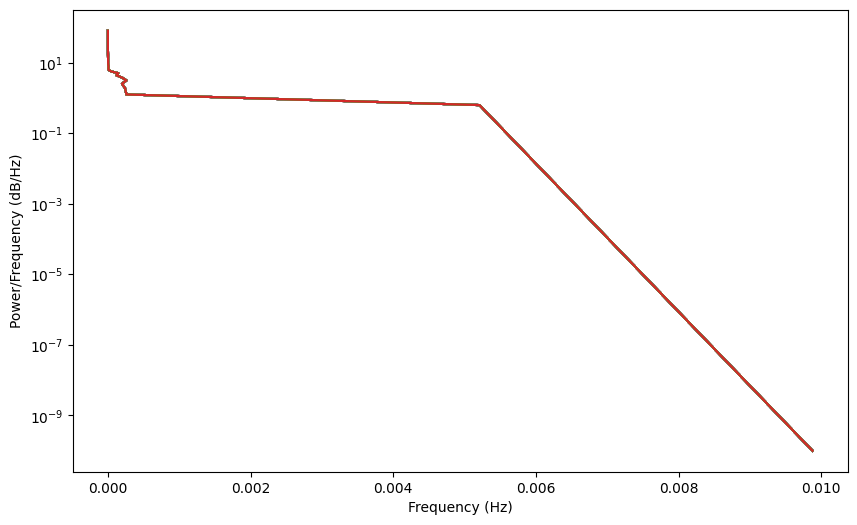

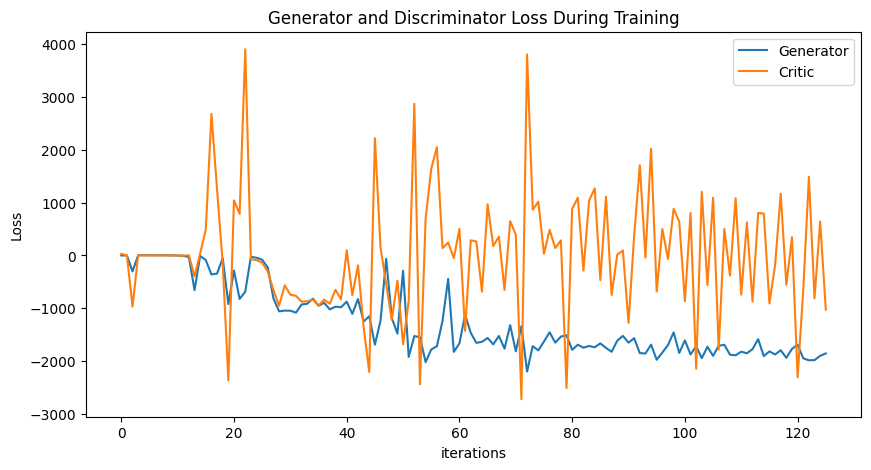

Epoch 150: Critic error ([0.6885826130416479, 0.16965117618913972, -301.5321389013607, 4.726798039269767, 4.547169763994072, 4.4297431224987145, 4.172676367460495, 3.9472600998981395, 3.584533098299273, 1.4505722537033137, -1.1125052283036476, -5.538010237991461, -30.9433405547383, -655.2924383305321, -7.295822976046338, -87.90702365964054, -359.53579252472167, -342.50567799257533, -50.49142903336721, -919.5582088843395, -286.00777356182743, -823.1714649468568, -685.7858913947388, -25.404094383601247, -43.215558182795306, -81.31134102318043, -229.7946142461082, -812.284318160045, -1057.7161573070434, -1043.6522178075552, -1045.4714623676232, -1082.6698963087676, -927.3439793457399, -914.281522758653, -817.0398258072553, -952.0280722262062, -896.2793348354313, -1020.7808096879388, -969.2728015831478, -979.6540614666624, -874.3526868775518, -1106.1143304820148, -824.4152983321169, -1250.9347759593338, -1150.6811978327742, -1688.244581897198, -1233.2111006167859, -62.72987930928217, -1182

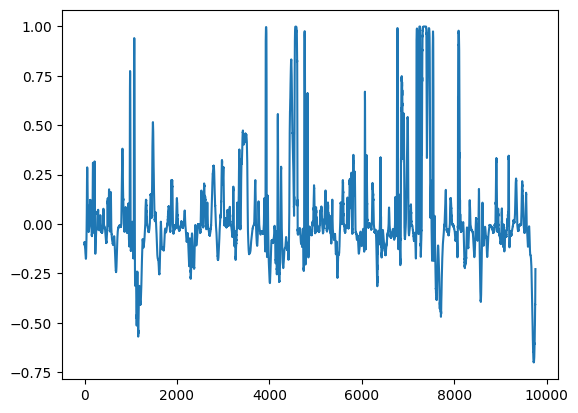

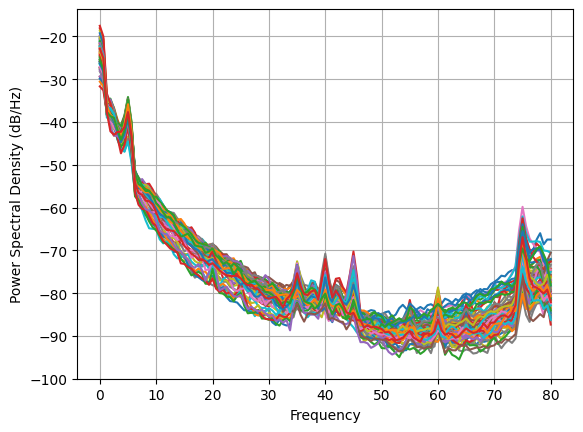

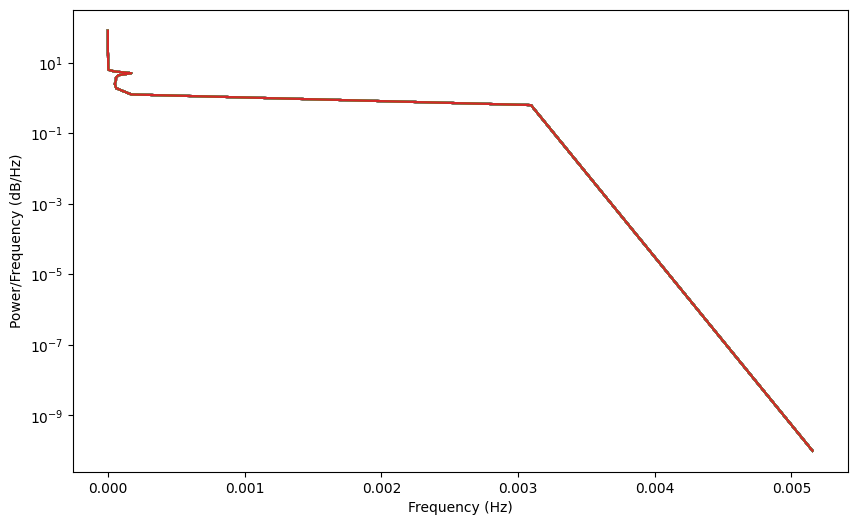

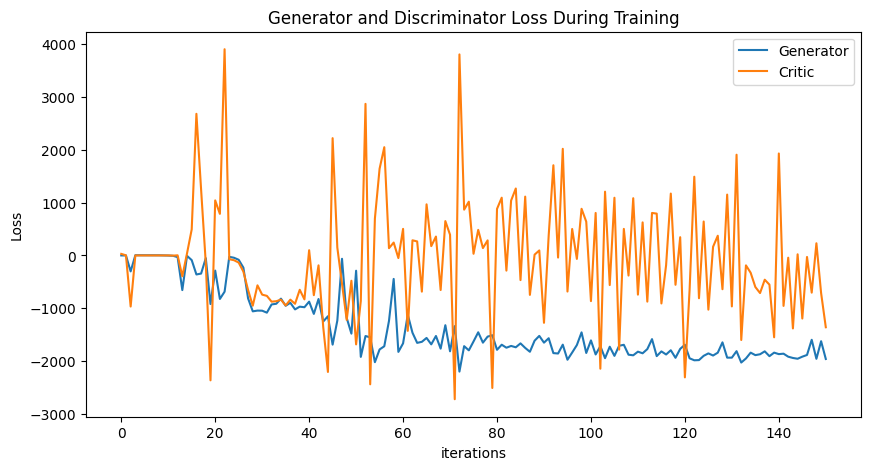

Epoch 175: Critic error ([0.6885826130416479, 0.16965117618913972, -301.5321389013607, 4.726798039269767, 4.547169763994072, 4.4297431224987145, 4.172676367460495, 3.9472600998981395, 3.584533098299273, 1.4505722537033137, -1.1125052283036476, -5.538010237991461, -30.9433405547383, -655.2924383305321, -7.295822976046338, -87.90702365964054, -359.53579252472167, -342.50567799257533, -50.49142903336721, -919.5582088843395, -286.00777356182743, -823.1714649468568, -685.7858913947388, -25.404094383601247, -43.215558182795306, -81.31134102318043, -229.7946142461082, -812.284318160045, -1057.7161573070434, -1043.6522178075552, -1045.4714623676232, -1082.6698963087676, -927.3439793457399, -914.281522758653, -817.0398258072553, -952.0280722262062, -896.2793348354313, -1020.7808096879388, -969.2728015831478, -979.6540614666624, -874.3526868775518, -1106.1143304820148, -824.4152983321169, -1250.9347759593338, -1150.6811978327742, -1688.244581897198, -1233.2111006167859, -62.72987930928217, -1182

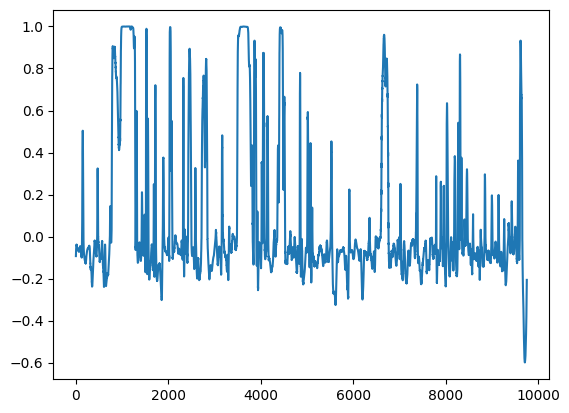

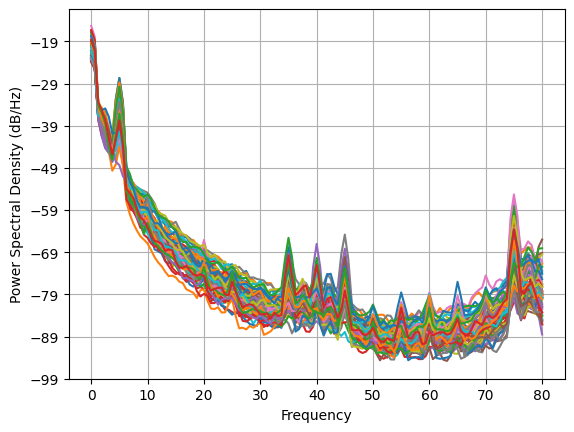

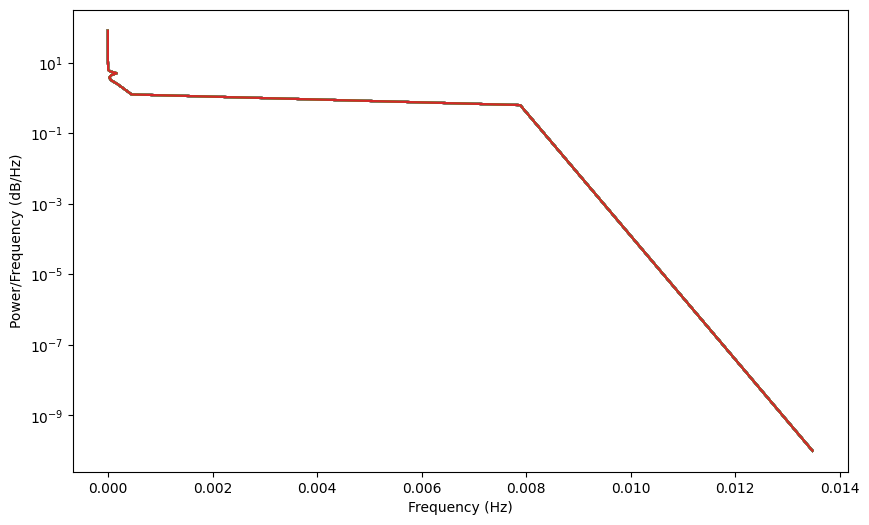

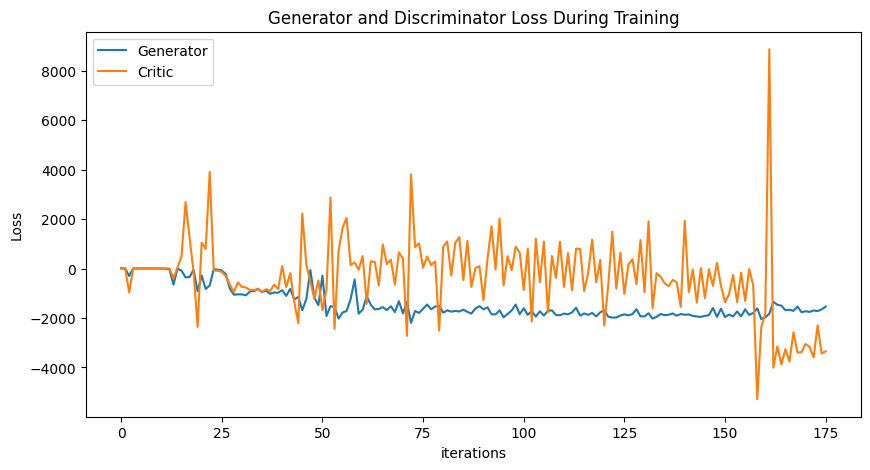

Epoch 200: Critic error ([0.6885826130416479, 0.16965117618913972, -301.5321389013607, 4.726798039269767, 4.547169763994072, 4.4297431224987145, 4.172676367460495, 3.9472600998981395, 3.584533098299273, 1.4505722537033137, -1.1125052283036476, -5.538010237991461, -30.9433405547383, -655.2924383305321, -7.295822976046338, -87.90702365964054, -359.53579252472167, -342.50567799257533, -50.49142903336721, -919.5582088843395, -286.00777356182743, -823.1714649468568, -685.7858913947388, -25.404094383601247, -43.215558182795306, -81.31134102318043, -229.7946142461082, -812.284318160045, -1057.7161573070434, -1043.6522178075552, -1045.4714623676232, -1082.6698963087676, -927.3439793457399, -914.281522758653, -817.0398258072553, -952.0280722262062, -896.2793348354313, -1020.7808096879388, -969.2728015831478, -979.6540614666624, -874.3526868775518, -1106.1143304820148, -824.4152983321169, -1250.9347759593338, -1150.6811978327742, -1688.244581897198, -1233.2111006167859, -62.72987930928217, -1182

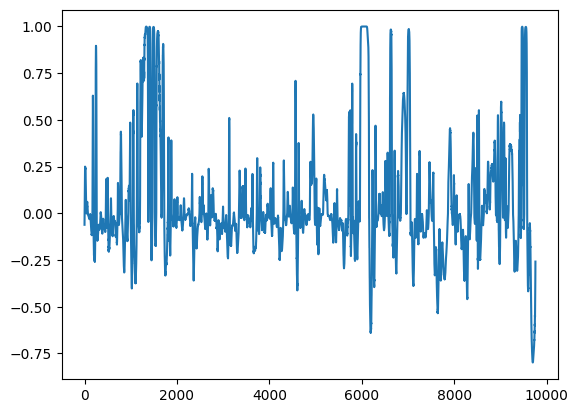

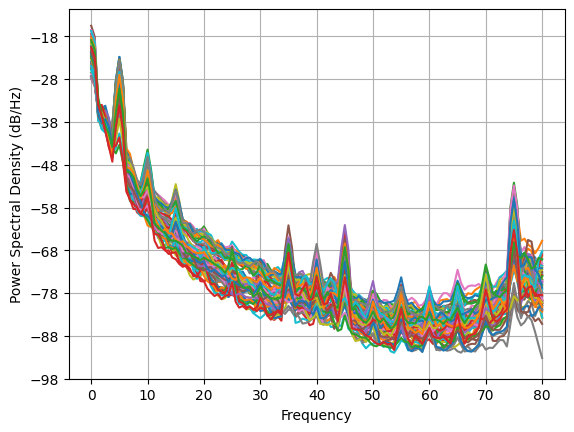

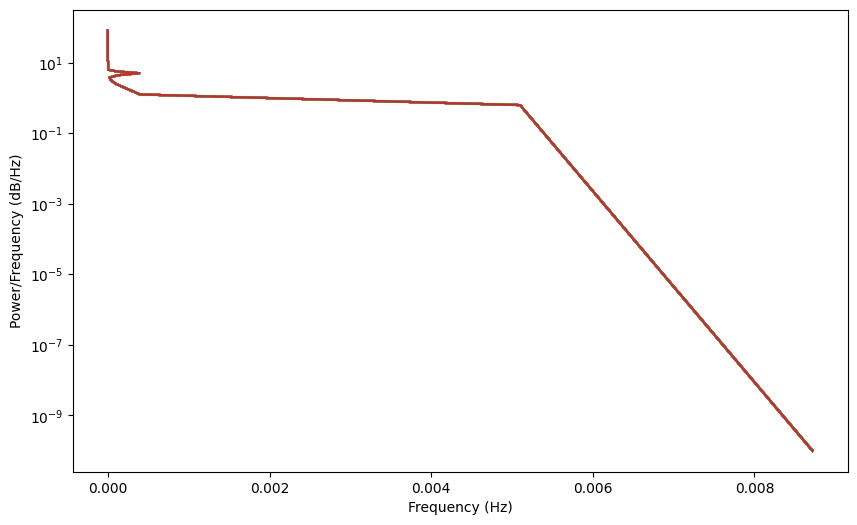

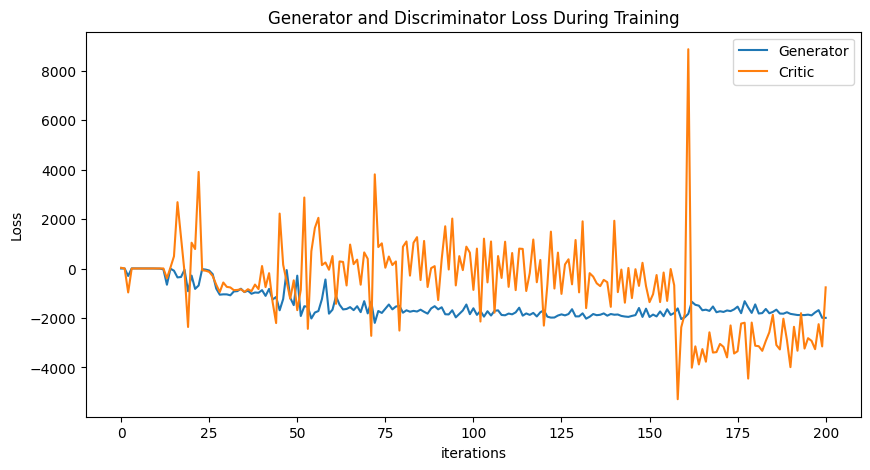

KeyboardInterrupt: 

In [16]:
NUM_EPOCHS = 300
PRINT_INTERVAL = 25
BATCH_SIZE = np.shape(normalized_data_open)[0]

train_data = TensorDataset(torch.tensor(normalized_data_open).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Flatten(), 
            nn.Linear(1216, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=5e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=5e-4)

    for epoch in range(NUM_EPOCHS):
        for (real,) in train_loader:
            for _ in range(5):
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)
                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_closed_5, disc, gen = train()

torch.save(gen, 'gen4_5.pt')
torch.save(disc, 'disc4_5.pt')

plot_everything(generated_closed_5, gen_err, critic_err)

# Baseline + complex latent (to capture freq 20,60 peaks)

Epoch 0: Critic error ([2.5254023204517275]) Generator err ([0.004081925842911005])


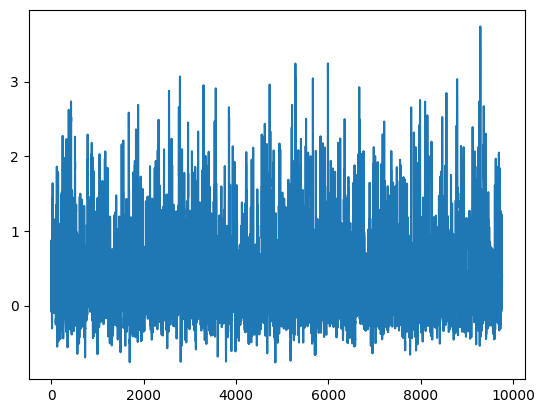

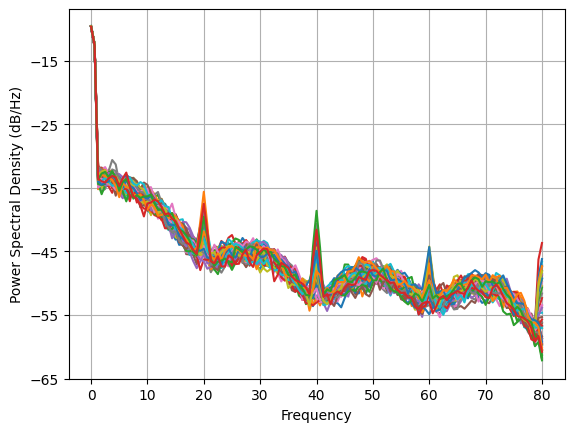

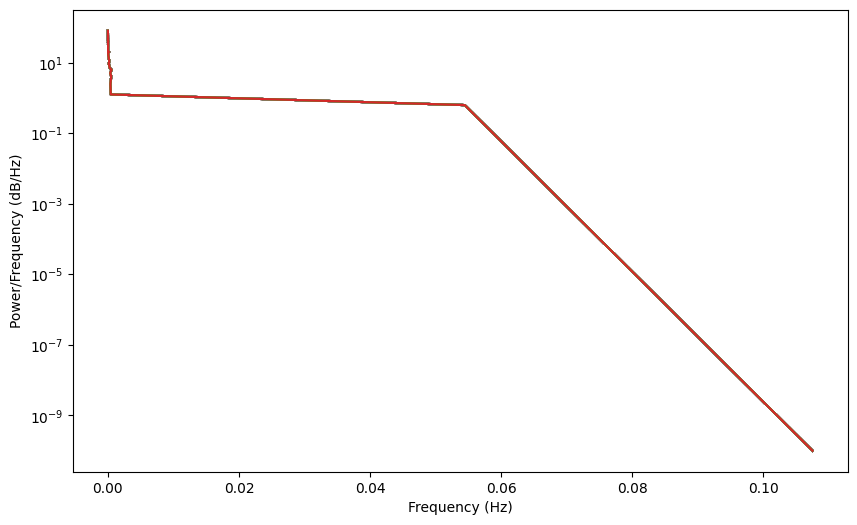

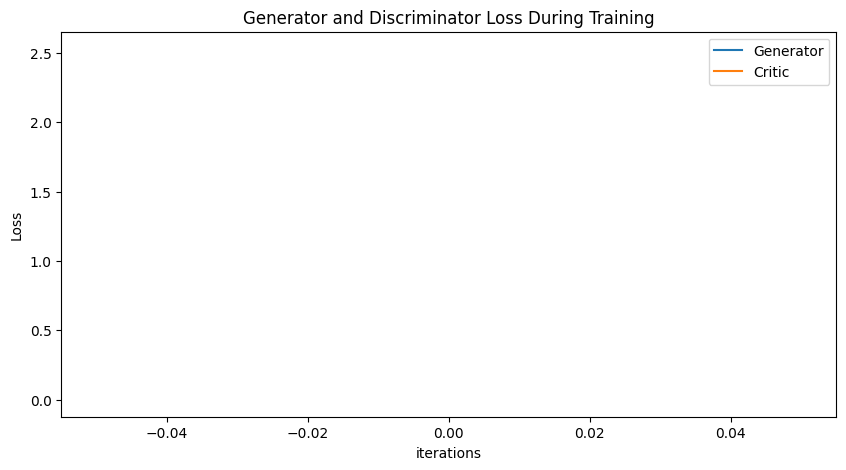

Epoch 15: Critic error ([2.5254023204517275, 0.10414430098131444, 0.07560900254802161, 0.05762201036798659, 0.10093936795581995, 0.06358143147966143, -0.11372965003151694, -0.2955144304827704, -0.33923896558531363, -0.3271201762446919, -0.6493182159319537, -1.292430473729954, -1.9391634677259169, -3.005756458108798, -3.5064218990680276, -3.558472417544749]) Generator err ([0.004081925842911005, -0.038171201944351196, -0.02661803923547268, 0.002707695821300149, 0.016960598528385162, 0.023621754720807076, 0.17163683474063873, 0.5409235954284668, 0.5166521072387695, 0.9241567850112915, 1.2920957803726196, 3.1271145343780518, 1.6573530435562134, 3.631039619445801, 5.967316150665283, 6.4240803718566895])


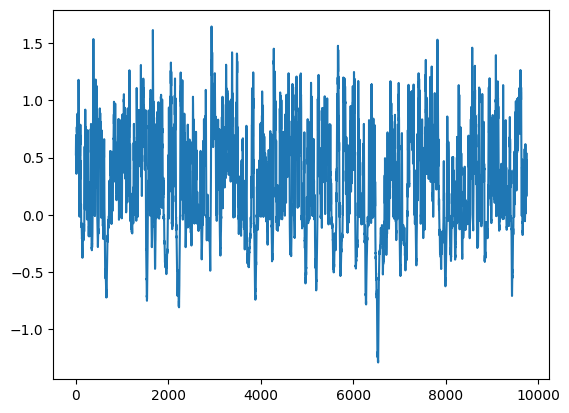

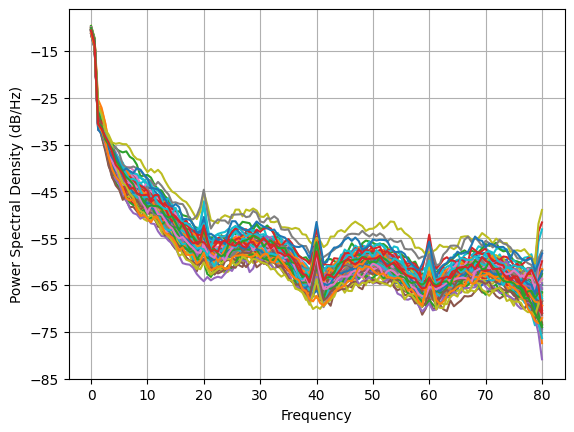

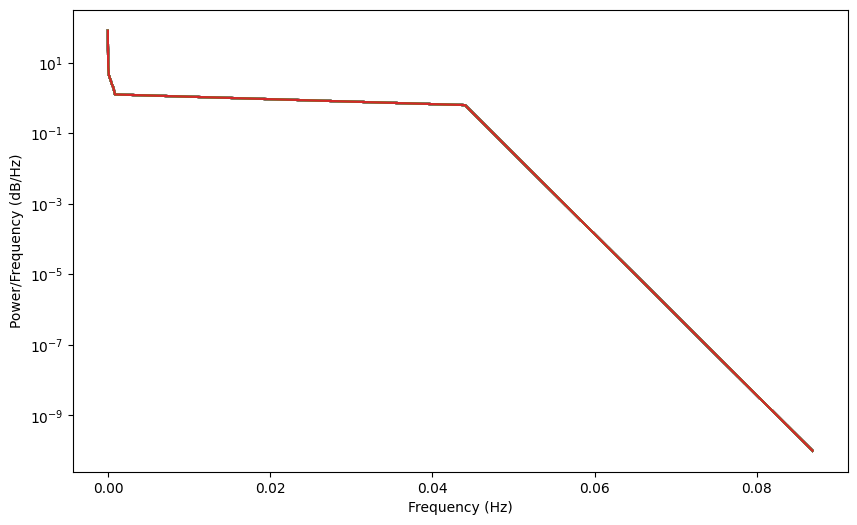

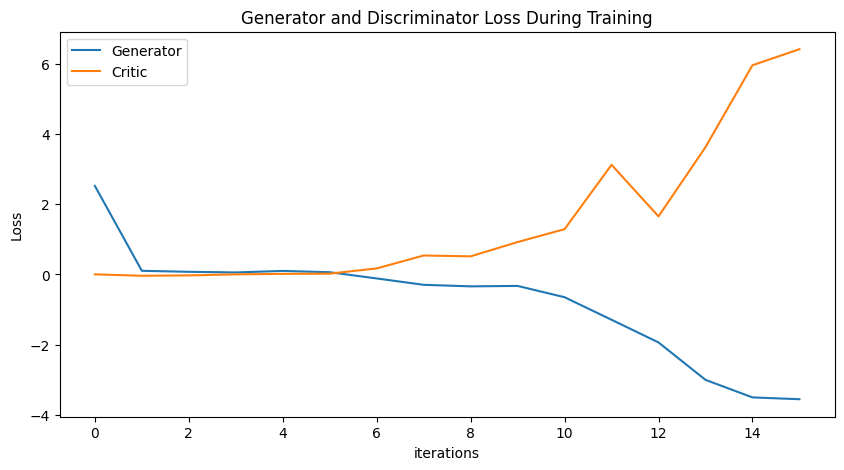

Epoch 30: Critic error ([2.5254023204517275, 0.10414430098131444, 0.07560900254802161, 0.05762201036798659, 0.10093936795581995, 0.06358143147966143, -0.11372965003151694, -0.2955144304827704, -0.33923896558531363, -0.3271201762446919, -0.6493182159319537, -1.292430473729954, -1.9391634677259169, -3.005756458108798, -3.5064218990680276, -3.558472417544749, -4.003541427934374, -3.96889525026416, -3.8032663058016287, -3.4407518460927466, -3.833094388196814, -3.8338944789163807, -2.7619520232938206, -3.9808033535515195, -3.3872296006374305, -4.108841931931262, -4.122065117460242, -4.304073214988582, -3.9788842558468476, -4.040682025321502, -3.5758253912892703]) Generator err ([0.004081925842911005, -0.038171201944351196, -0.02661803923547268, 0.002707695821300149, 0.016960598528385162, 0.023621754720807076, 0.17163683474063873, 0.5409235954284668, 0.5166521072387695, 0.9241567850112915, 1.2920957803726196, 3.1271145343780518, 1.6573530435562134, 3.631039619445801, 5.967316150665283, 6.424

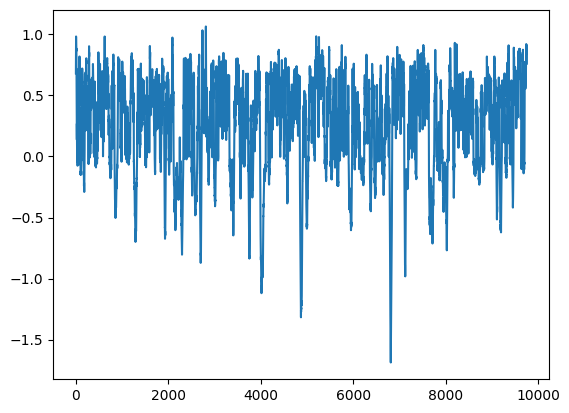

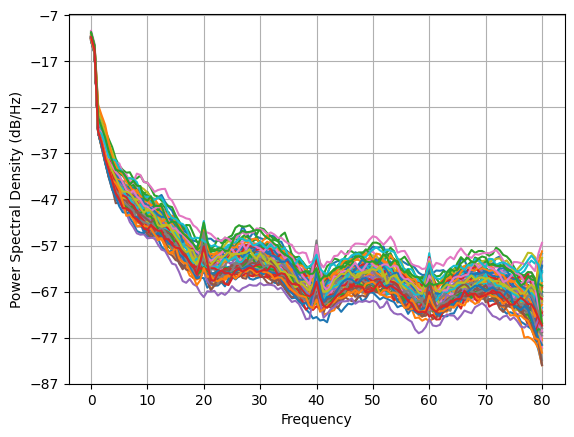

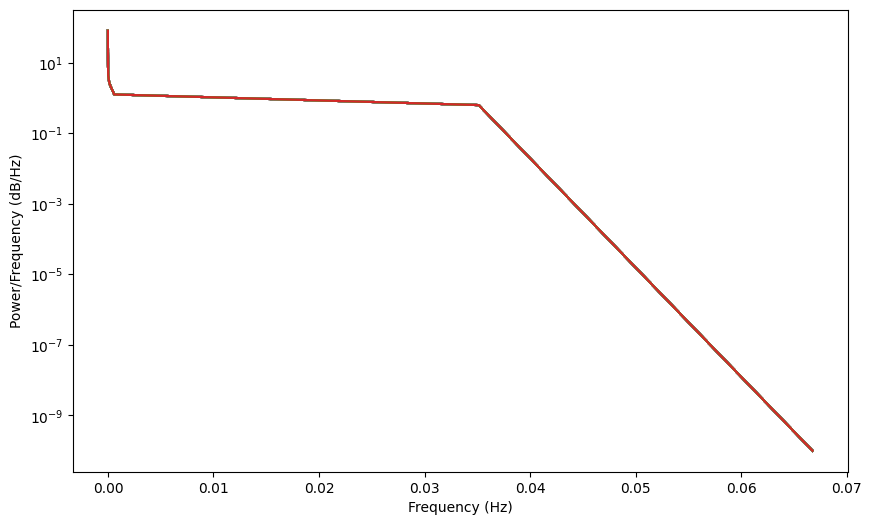

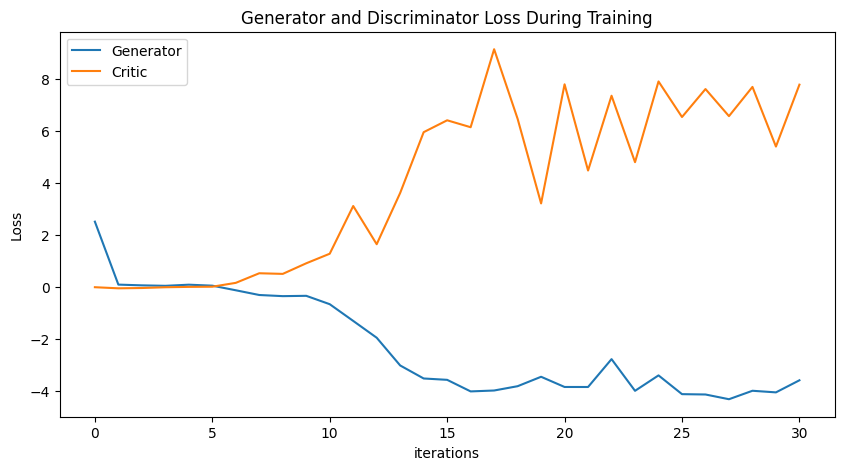

Epoch 45: Critic error ([2.5254023204517275, 0.10414430098131444, 0.07560900254802161, 0.05762201036798659, 0.10093936795581995, 0.06358143147966143, -0.11372965003151694, -0.2955144304827704, -0.33923896558531363, -0.3271201762446919, -0.6493182159319537, -1.292430473729954, -1.9391634677259169, -3.005756458108798, -3.5064218990680276, -3.558472417544749, -4.003541427934374, -3.96889525026416, -3.8032663058016287, -3.4407518460927466, -3.833094388196814, -3.8338944789163807, -2.7619520232938206, -3.9808033535515195, -3.3872296006374305, -4.108841931931262, -4.122065117460242, -4.304073214988582, -3.9788842558468476, -4.040682025321502, -3.5758253912892703, -4.084734437225748, -3.9952358151637006, -4.078806201218233, -4.101674770691292, -4.355836962609389, -4.181795179099113, -4.186443356815012, -4.059672373185779, -4.281858419156456, -4.009136887996007, -4.09577600790147, -3.98361678163422, -4.243673417512512, -3.8940876376634193, -3.9750687581987756]) Generator err ([0.00408192584291

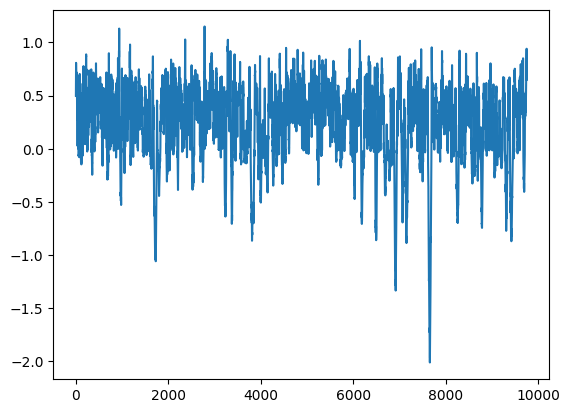

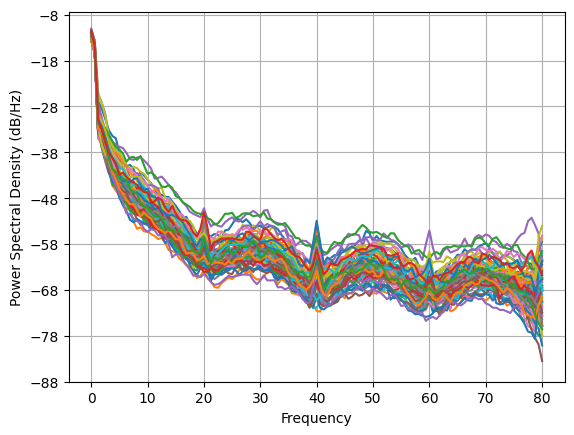

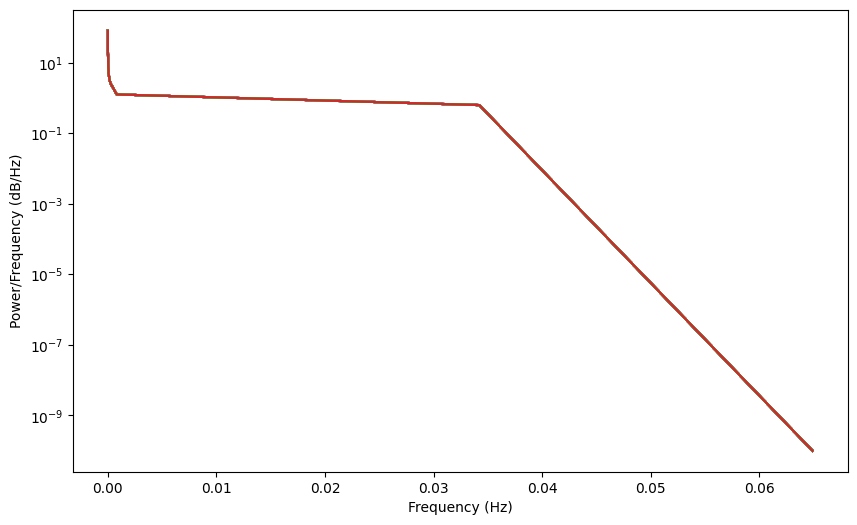

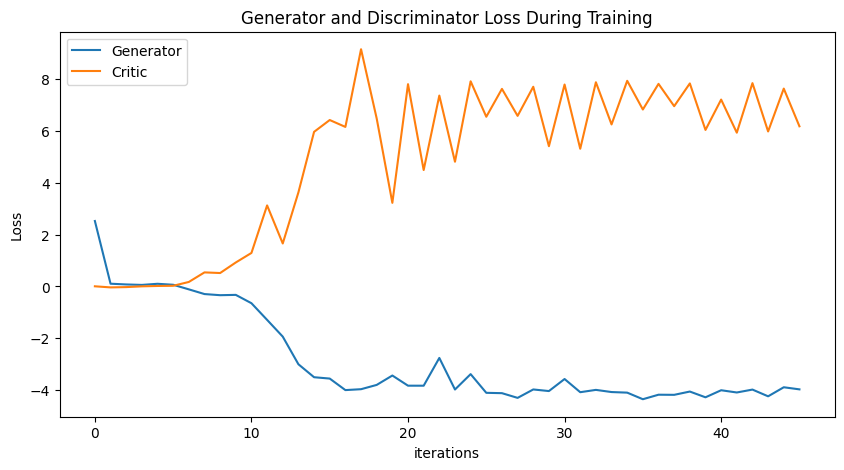

Epoch 60: Critic error ([2.5254023204517275, 0.10414430098131444, 0.07560900254802161, 0.05762201036798659, 0.10093936795581995, 0.06358143147966143, -0.11372965003151694, -0.2955144304827704, -0.33923896558531363, -0.3271201762446919, -0.6493182159319537, -1.292430473729954, -1.9391634677259169, -3.005756458108798, -3.5064218990680276, -3.558472417544749, -4.003541427934374, -3.96889525026416, -3.8032663058016287, -3.4407518460927466, -3.833094388196814, -3.8338944789163807, -2.7619520232938206, -3.9808033535515195, -3.3872296006374305, -4.108841931931262, -4.122065117460242, -4.304073214988582, -3.9788842558468476, -4.040682025321502, -3.5758253912892703, -4.084734437225748, -3.9952358151637006, -4.078806201218233, -4.101674770691292, -4.355836962609389, -4.181795179099113, -4.186443356815012, -4.059672373185779, -4.281858419156456, -4.009136887996007, -4.09577600790147, -3.98361678163422, -4.243673417512512, -3.8940876376634193, -3.9750687581987756, -3.9226275613630697, -4.086859208

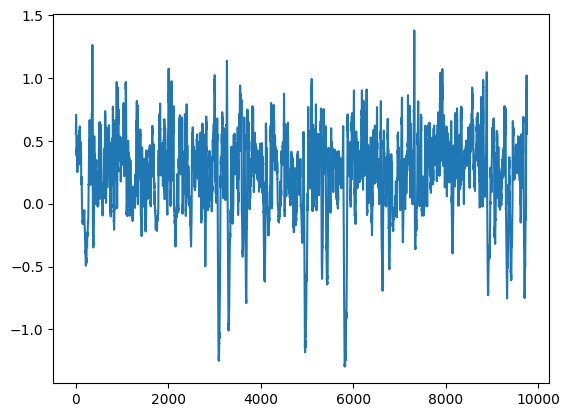

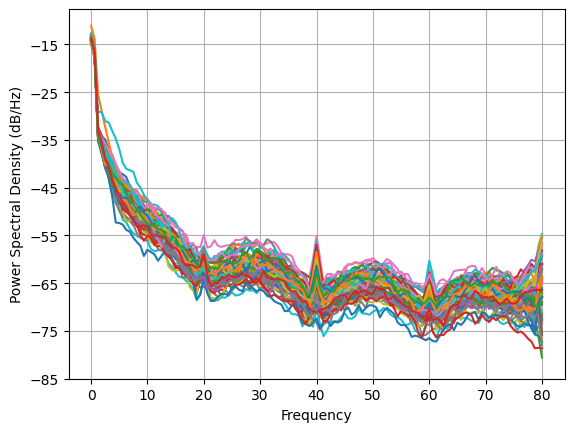

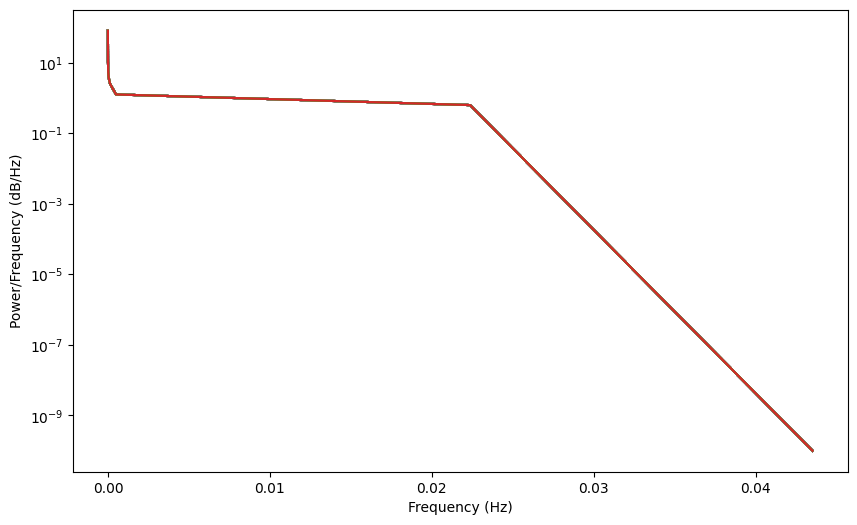

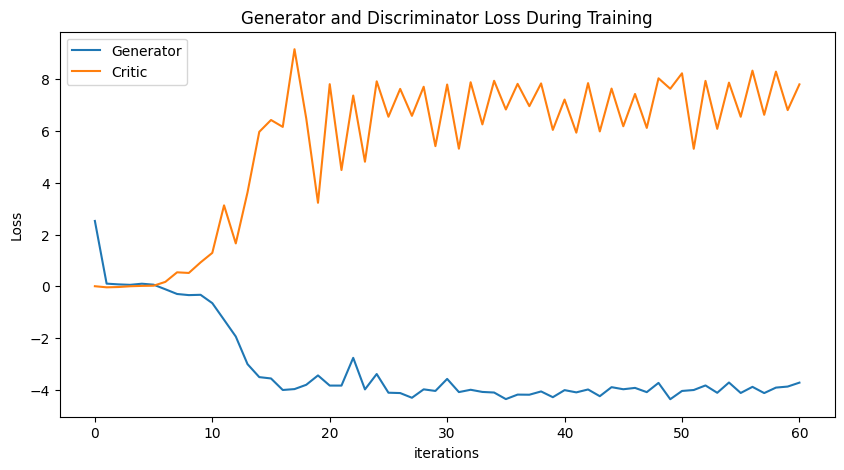

Epoch 75: Critic error ([2.5254023204517275, 0.10414430098131444, 0.07560900254802161, 0.05762201036798659, 0.10093936795581995, 0.06358143147966143, -0.11372965003151694, -0.2955144304827704, -0.33923896558531363, -0.3271201762446919, -0.6493182159319537, -1.292430473729954, -1.9391634677259169, -3.005756458108798, -3.5064218990680276, -3.558472417544749, -4.003541427934374, -3.96889525026416, -3.8032663058016287, -3.4407518460927466, -3.833094388196814, -3.8338944789163807, -2.7619520232938206, -3.9808033535515195, -3.3872296006374305, -4.108841931931262, -4.122065117460242, -4.304073214988582, -3.9788842558468476, -4.040682025321502, -3.5758253912892703, -4.084734437225748, -3.9952358151637006, -4.078806201218233, -4.101674770691292, -4.355836962609389, -4.181795179099113, -4.186443356815012, -4.059672373185779, -4.281858419156456, -4.009136887996007, -4.09577600790147, -3.98361678163422, -4.243673417512512, -3.8940876376634193, -3.9750687581987756, -3.9226275613630697, -4.086859208

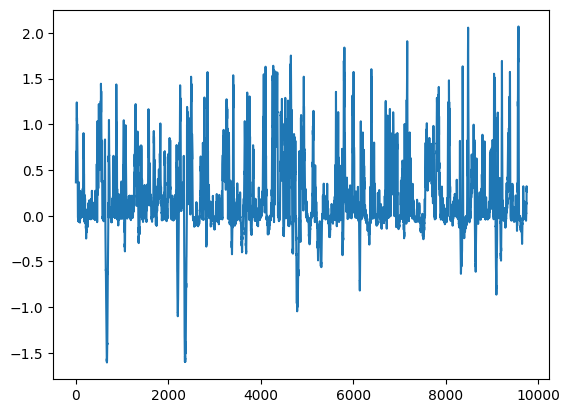

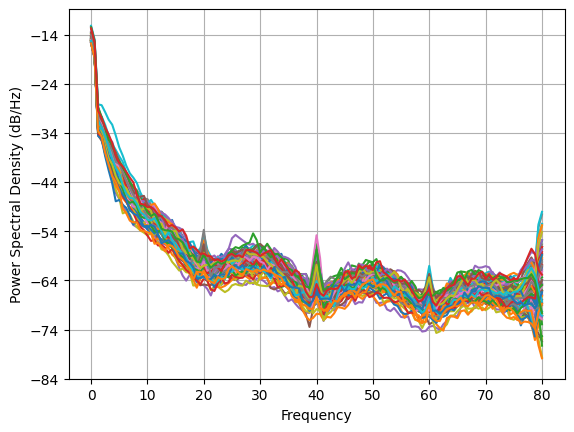

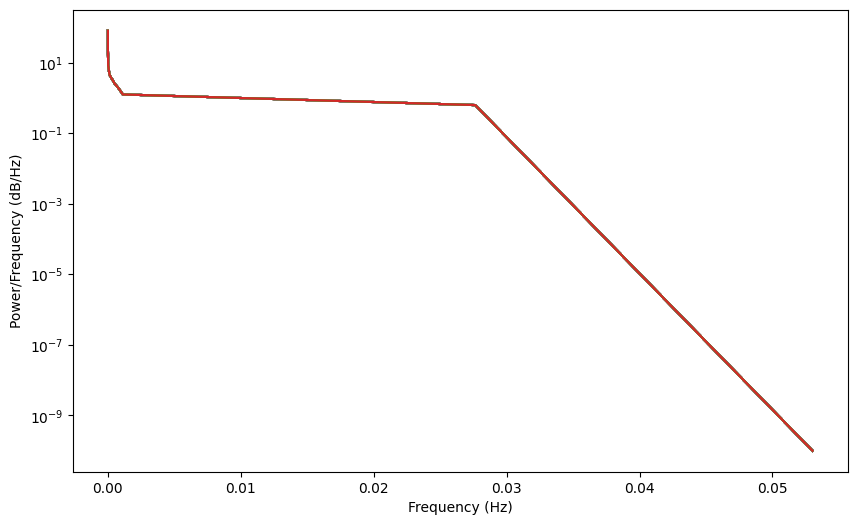

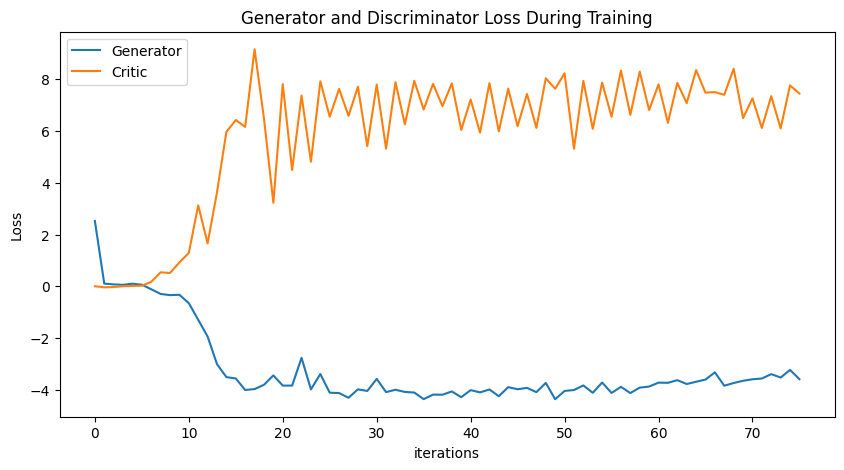

Epoch 90: Critic error ([2.5254023204517275, 0.10414430098131444, 0.07560900254802161, 0.05762201036798659, 0.10093936795581995, 0.06358143147966143, -0.11372965003151694, -0.2955144304827704, -0.33923896558531363, -0.3271201762446919, -0.6493182159319537, -1.292430473729954, -1.9391634677259169, -3.005756458108798, -3.5064218990680276, -3.558472417544749, -4.003541427934374, -3.96889525026416, -3.8032663058016287, -3.4407518460927466, -3.833094388196814, -3.8338944789163807, -2.7619520232938206, -3.9808033535515195, -3.3872296006374305, -4.108841931931262, -4.122065117460242, -4.304073214988582, -3.9788842558468476, -4.040682025321502, -3.5758253912892703, -4.084734437225748, -3.9952358151637006, -4.078806201218233, -4.101674770691292, -4.355836962609389, -4.181795179099113, -4.186443356815012, -4.059672373185779, -4.281858419156456, -4.009136887996007, -4.09577600790147, -3.98361678163422, -4.243673417512512, -3.8940876376634193, -3.9750687581987756, -3.9226275613630697, -4.086859208

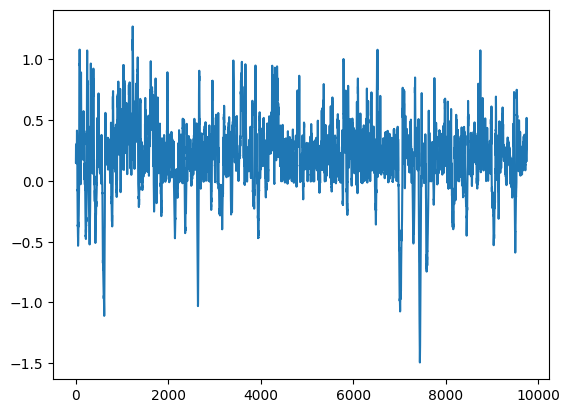

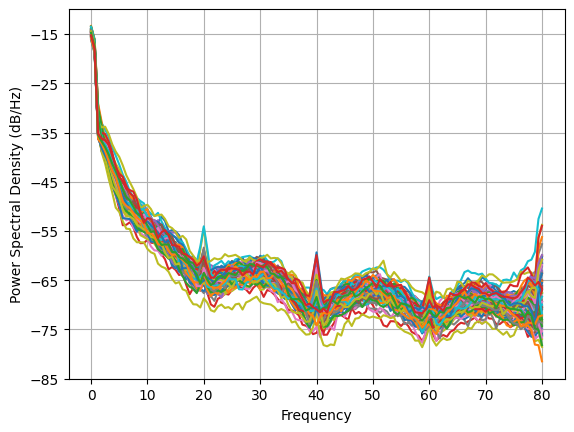

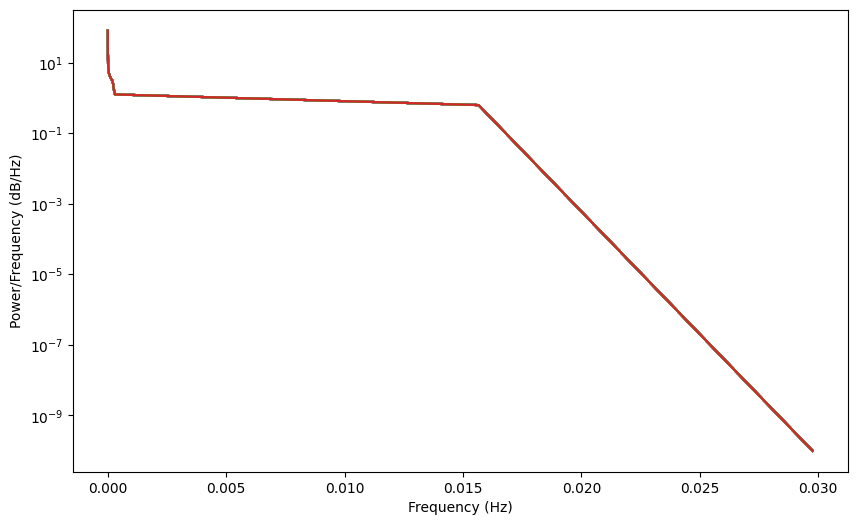

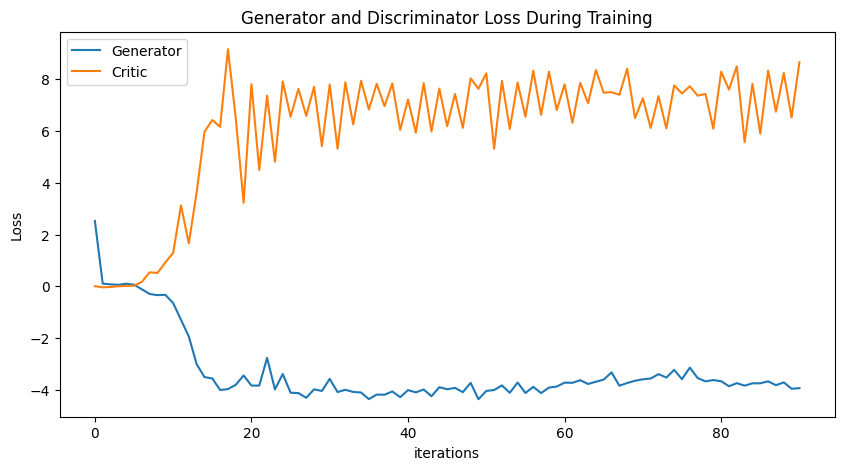

Epoch 105: Critic error ([2.5254023204517275, 0.10414430098131444, 0.07560900254802161, 0.05762201036798659, 0.10093936795581995, 0.06358143147966143, -0.11372965003151694, -0.2955144304827704, -0.33923896558531363, -0.3271201762446919, -0.6493182159319537, -1.292430473729954, -1.9391634677259169, -3.005756458108798, -3.5064218990680276, -3.558472417544749, -4.003541427934374, -3.96889525026416, -3.8032663058016287, -3.4407518460927466, -3.833094388196814, -3.8338944789163807, -2.7619520232938206, -3.9808033535515195, -3.3872296006374305, -4.108841931931262, -4.122065117460242, -4.304073214988582, -3.9788842558468476, -4.040682025321502, -3.5758253912892703, -4.084734437225748, -3.9952358151637006, -4.078806201218233, -4.101674770691292, -4.355836962609389, -4.181795179099113, -4.186443356815012, -4.059672373185779, -4.281858419156456, -4.009136887996007, -4.09577600790147, -3.98361678163422, -4.243673417512512, -3.8940876376634193, -3.9750687581987756, -3.9226275613630697, -4.08685920

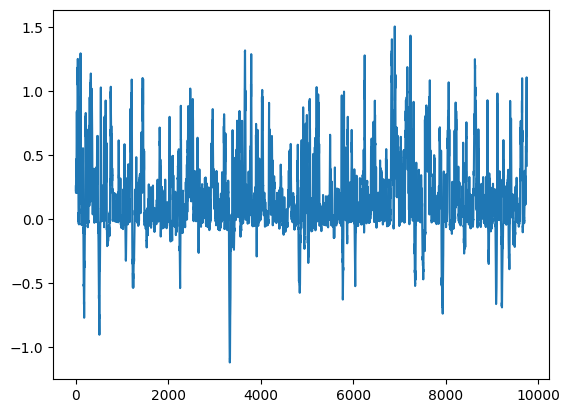

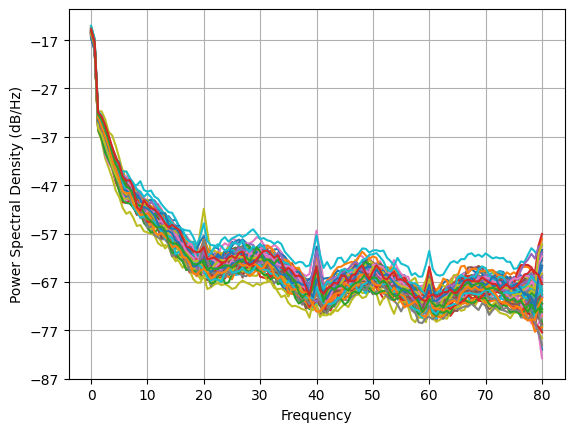

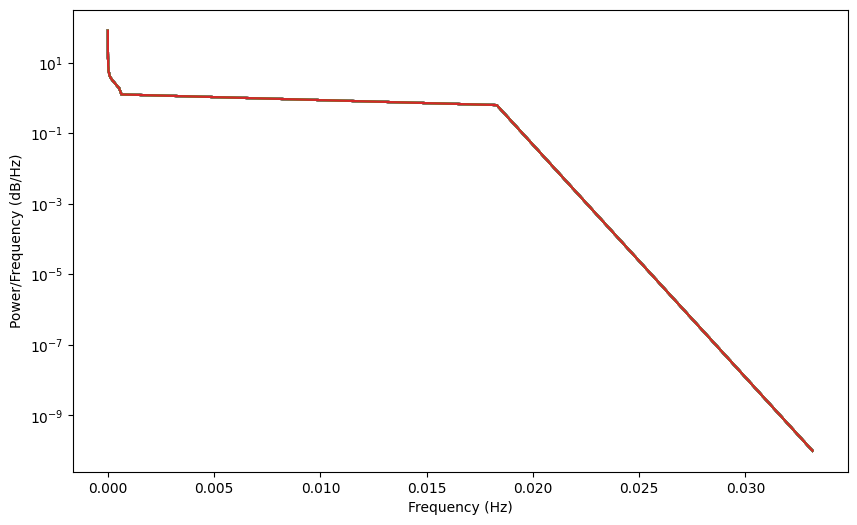

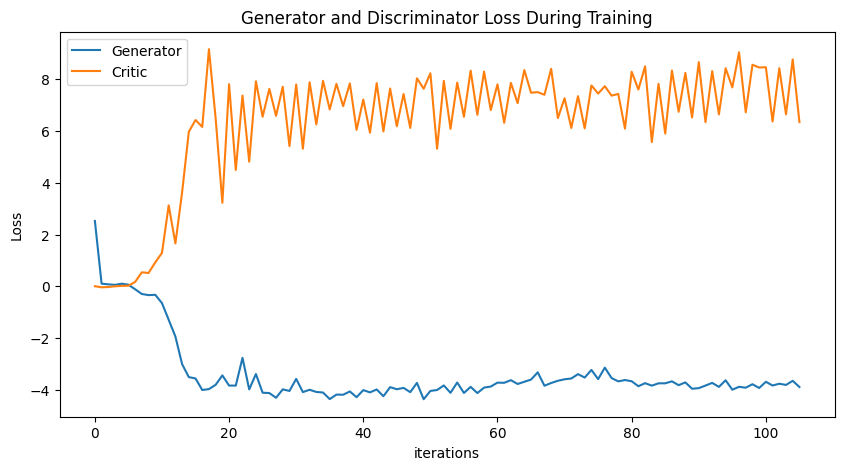

Epoch 120: Critic error ([2.5254023204517275, 0.10414430098131444, 0.07560900254802161, 0.05762201036798659, 0.10093936795581995, 0.06358143147966143, -0.11372965003151694, -0.2955144304827704, -0.33923896558531363, -0.3271201762446919, -0.6493182159319537, -1.292430473729954, -1.9391634677259169, -3.005756458108798, -3.5064218990680276, -3.558472417544749, -4.003541427934374, -3.96889525026416, -3.8032663058016287, -3.4407518460927466, -3.833094388196814, -3.8338944789163807, -2.7619520232938206, -3.9808033535515195, -3.3872296006374305, -4.108841931931262, -4.122065117460242, -4.304073214988582, -3.9788842558468476, -4.040682025321502, -3.5758253912892703, -4.084734437225748, -3.9952358151637006, -4.078806201218233, -4.101674770691292, -4.355836962609389, -4.181795179099113, -4.186443356815012, -4.059672373185779, -4.281858419156456, -4.009136887996007, -4.09577600790147, -3.98361678163422, -4.243673417512512, -3.8940876376634193, -3.9750687581987756, -3.9226275613630697, -4.08685920

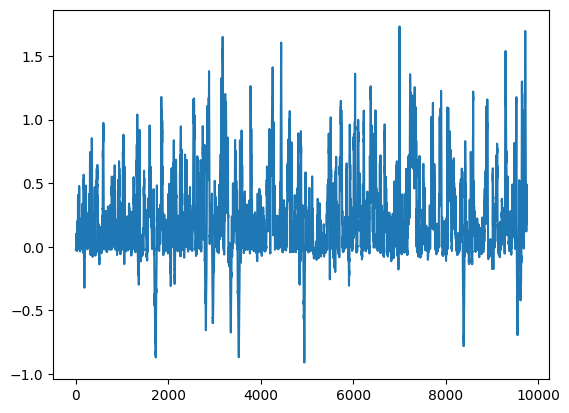

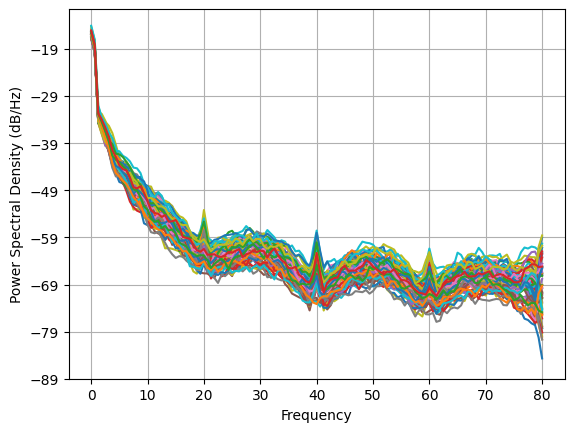

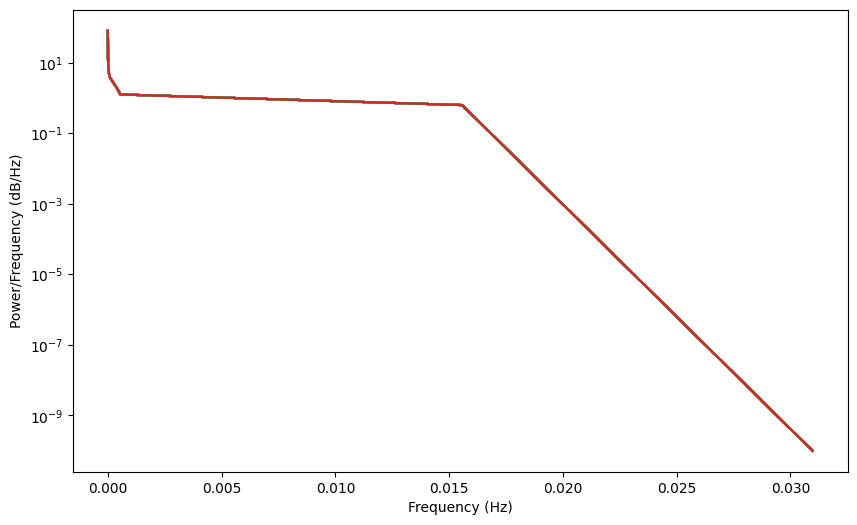

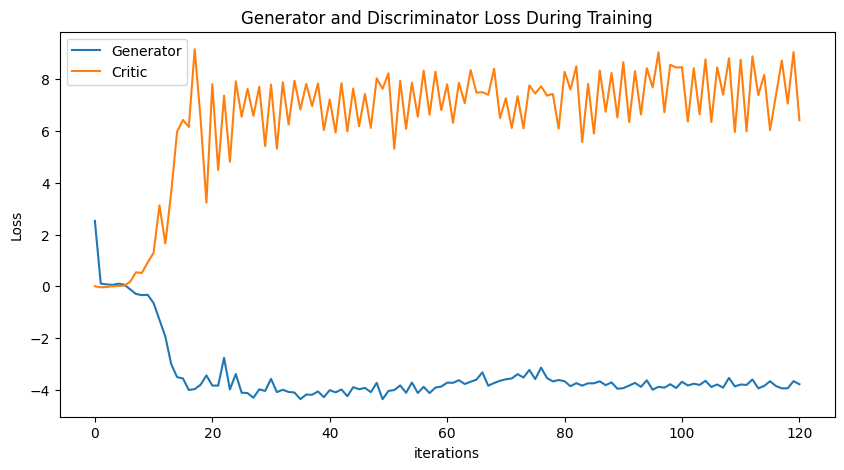

Epoch 135: Critic error ([2.5254023204517275, 0.10414430098131444, 0.07560900254802161, 0.05762201036798659, 0.10093936795581995, 0.06358143147966143, -0.11372965003151694, -0.2955144304827704, -0.33923896558531363, -0.3271201762446919, -0.6493182159319537, -1.292430473729954, -1.9391634677259169, -3.005756458108798, -3.5064218990680276, -3.558472417544749, -4.003541427934374, -3.96889525026416, -3.8032663058016287, -3.4407518460927466, -3.833094388196814, -3.8338944789163807, -2.7619520232938206, -3.9808033535515195, -3.3872296006374305, -4.108841931931262, -4.122065117460242, -4.304073214988582, -3.9788842558468476, -4.040682025321502, -3.5758253912892703, -4.084734437225748, -3.9952358151637006, -4.078806201218233, -4.101674770691292, -4.355836962609389, -4.181795179099113, -4.186443356815012, -4.059672373185779, -4.281858419156456, -4.009136887996007, -4.09577600790147, -3.98361678163422, -4.243673417512512, -3.8940876376634193, -3.9750687581987756, -3.9226275613630697, -4.08685920

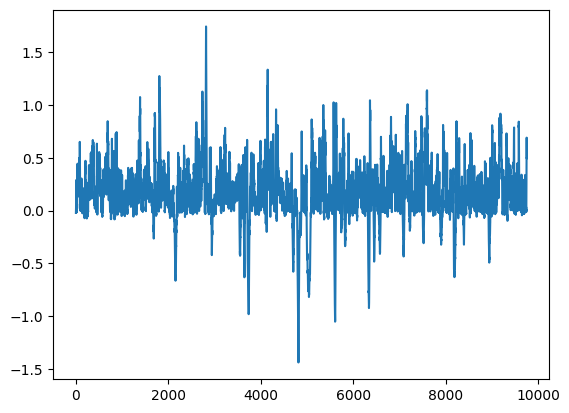

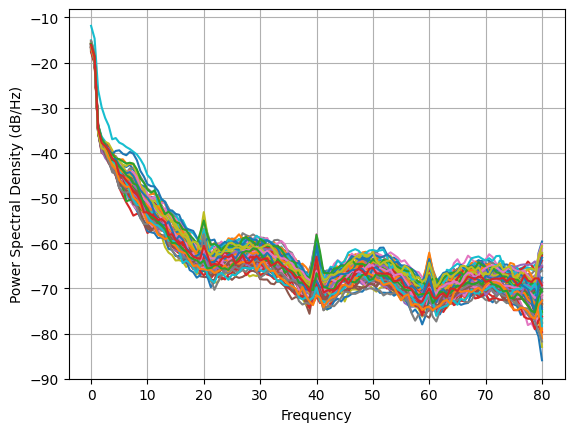

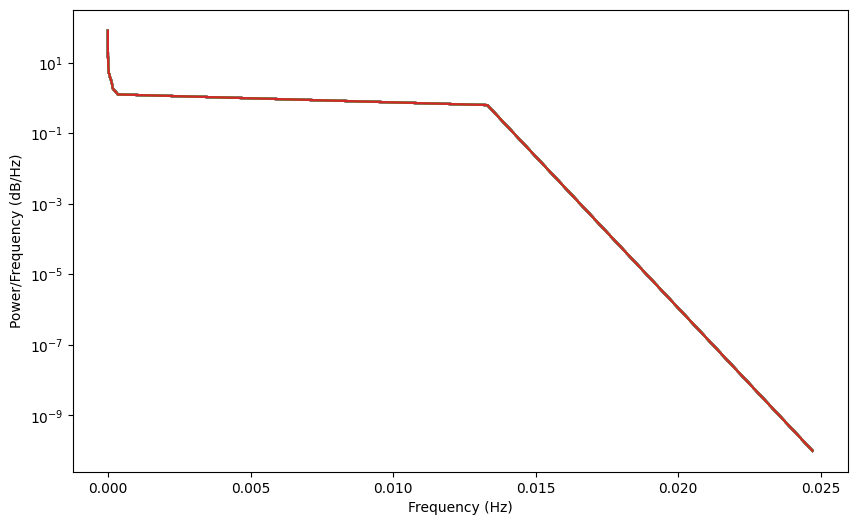

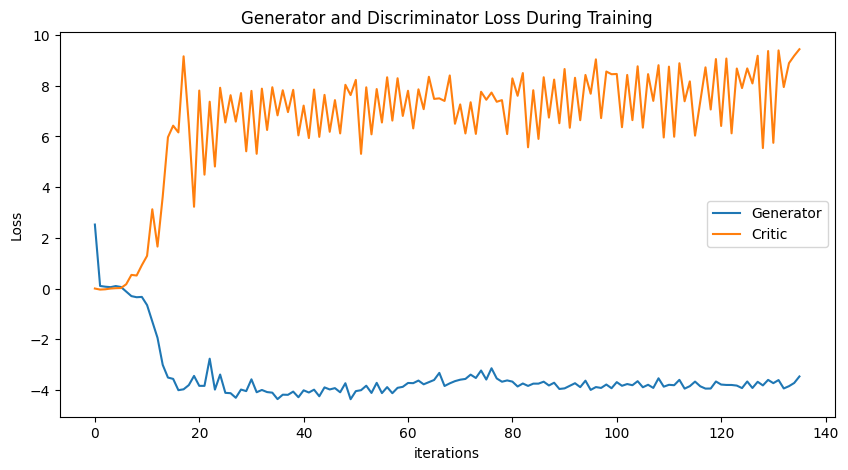

Epoch 150: Critic error ([2.5254023204517275, 0.10414430098131444, 0.07560900254802161, 0.05762201036798659, 0.10093936795581995, 0.06358143147966143, -0.11372965003151694, -0.2955144304827704, -0.33923896558531363, -0.3271201762446919, -0.6493182159319537, -1.292430473729954, -1.9391634677259169, -3.005756458108798, -3.5064218990680276, -3.558472417544749, -4.003541427934374, -3.96889525026416, -3.8032663058016287, -3.4407518460927466, -3.833094388196814, -3.8338944789163807, -2.7619520232938206, -3.9808033535515195, -3.3872296006374305, -4.108841931931262, -4.122065117460242, -4.304073214988582, -3.9788842558468476, -4.040682025321502, -3.5758253912892703, -4.084734437225748, -3.9952358151637006, -4.078806201218233, -4.101674770691292, -4.355836962609389, -4.181795179099113, -4.186443356815012, -4.059672373185779, -4.281858419156456, -4.009136887996007, -4.09577600790147, -3.98361678163422, -4.243673417512512, -3.8940876376634193, -3.9750687581987756, -3.9226275613630697, -4.08685920

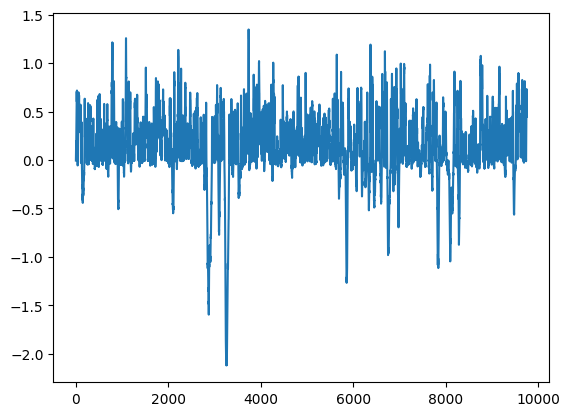

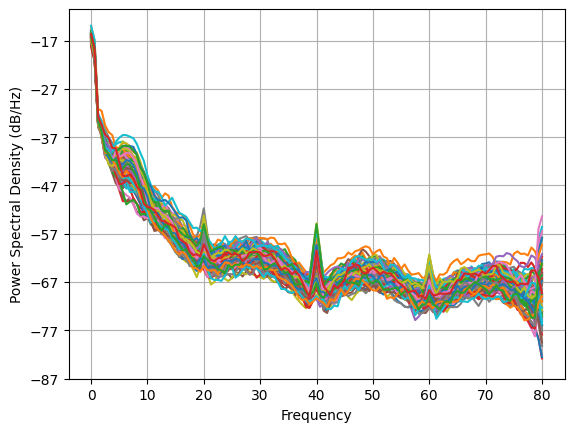

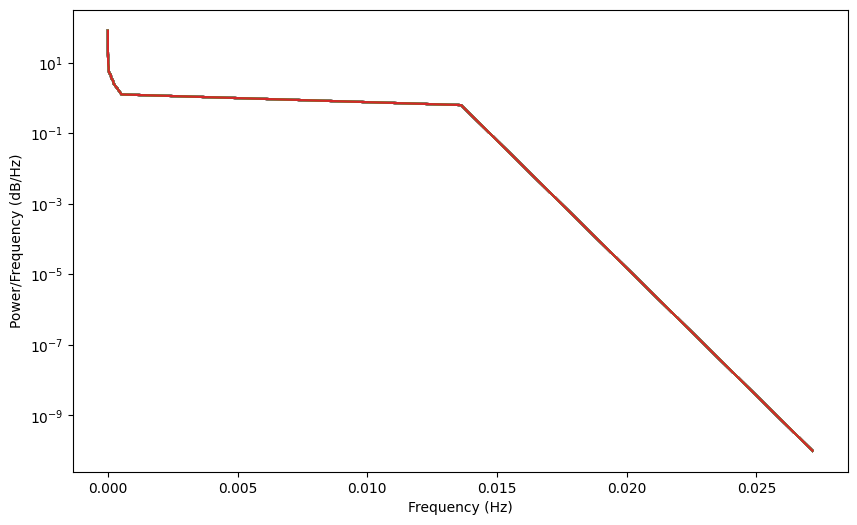

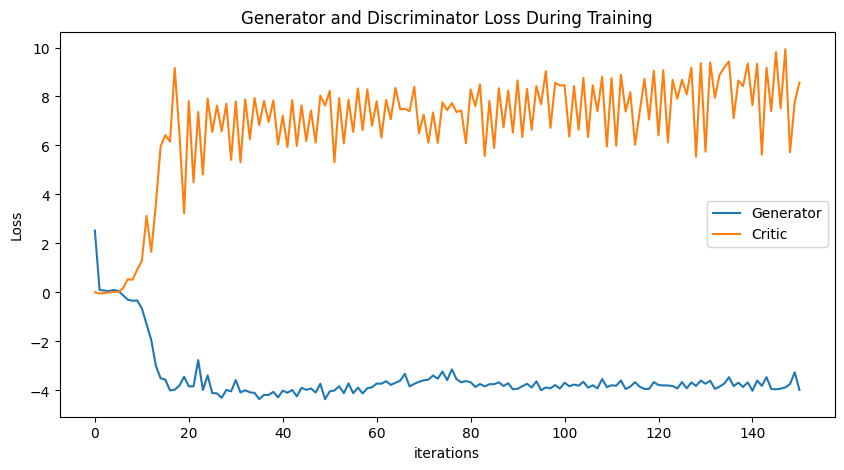

KeyboardInterrupt: 

In [21]:
NUM_EPOCHS = 300
PRINT_INTERVAL = 15
BATCH_SIZE = np.shape(normalized_data_closed)[0]

train_data = TensorDataset(torch.tensor(normalized_data_closed).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(128, 128, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(128, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(128, 128, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(128, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(128, 128, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(128, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(128, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for (real,) in train_loader:
            loss_critic = None
            for _ in range(5):
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)
                noise = sample_normal_distribution(BATCH_SIZE, 128, 1220)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  
            critic_err.append(loss_critic.item())

        noise = sample_normal_distribution(BATCH_SIZE, 128, 1220)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_closed_6, disc, gen = train()

torch.save(gen, 'gen4_6.pt')
torch.save(disc, 'disc4_6.pt')

plot_everything(generated_closed_6, gen_err, critic_err)

In [ ]:
NUM_EPOCHS = 300
PRINT_INTERVAL = 15
BATCH_SIZE = np.shape(normalized_data_open)[0]

train_data = TensorDataset(torch.tensor(normalized_data_open).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(128, 128, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(128, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(128, 128, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(128, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(128, 128, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(128, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(128, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for (real,) in train_loader:
            loss_critic = None
            for _ in range(5):
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)
                noise = sample_normal_distribution(BATCH_SIZE, 128, 1220)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  
            critic_err.append(loss_critic.item())

        noise = sample_normal_distribution(BATCH_SIZE, 128, 1220)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_open_6, disc, gen = train()

torch.save(gen, 'gen4_6_open.pt')
torch.save(disc, 'disc4_6_open.pt')

plot_everything(generated_open_6, gen_err, critic_err)